In [1]:
import gym
import numpy as np
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from gym import spaces
from collections import defaultdict
import pickle
import optuna

In [2]:
import numpy as np
import gym
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from gym import spaces

class Warehouse_robot(gym.Env):
    def __init__(self):
        super(Warehouse_robot, self).__init__()

        self.grid_size = 6
        self.start_position = (0, 0)
        self.item_position = (2, 2)
        self.dropoff_position = (5, 5)
        self.robot_pos = self.start_position
        self.carrying = False
        self.obstacles = [(1, 3), (2, 4), (3, 2), (4, 3)]
        self.action_space = spaces.Discrete(6)
        self.observation_space = spaces.MultiDiscrete([self.grid_size, self.grid_size, 2])
        self.idle_agent_image = mpimg.imread("idle_agent.jpg")
        self.agent_carrying_package_image = mpimg.imread("agent_carrying_package.jpg")
        self.obstacle_img = mpimg.imread("obstacle.jpg")
        self.item_package_image = mpimg.imread("package.jpg")
        self.white_background_image = mpimg.imread("white_background.png")

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.robot_pos = self.start_position
        self.carrying = False
        observation = np.array([self.robot_pos[0], self.robot_pos[1], int(self.carrying)])
        info = {}  # Additional debug info if needed
        return observation, info

    def step(self, action):
        a, b = self.robot_pos
        terminated = False  # Gymnasium uses "terminated"
        truncated = False   # Gymnasium adds "truncated" for time limits
        
        if action == 0 and b > 0:
            b -= 1
        elif action == 1 and b < self.grid_size - 1:
            b += 1
        elif action == 2 and a > 0:
            a -= 1
        elif action == 3 and a < self.grid_size - 1:
            a += 1

        if (a, b) in self.obstacles:
            a, b = self.robot_pos
            reward = -20
        else:
            reward = -1

        if action == 4 and (a, b) == self.item_position and not self.carrying:
            self.carrying = True
            reward = 25
        elif action == 5 and (a, b) == self.dropoff_position and self.carrying:
            reward = 100
            terminated = True  # Mark as complete when the item is delivered
        
        self.robot_pos = (a, b)
        
        observation = np.array([a, b, int(self.carrying)])
        info = {}  # Any additional info
        
        return observation, reward, terminated, truncated, info

    def render(self):
        figure, axis = plt.subplots(figsize=(5, 5))
        axis.imshow(self.white_background_image)

        for (ox, oy) in self.obstacles:
            axis.imshow(self.obstacle_img, extent=[ox, ox + 1, oy, oy + 1])
            
        if not self.carrying:
            ix, iy = self.item_position
            axis.imshow(self.item_package_image, extent=[ix, ix + 1, iy, iy + 1])
        rx, ry = self.robot_pos
        if self.carrying:
            axis.imshow(self.agent_carrying_package_image, extent=[rx, rx + 1, ry, ry + 1])
        else:
            axis.imshow(self.idle_agent_image, extent=[rx, rx + 1, ry, ry + 1])
        plt.xlim(0, self.grid_size)
        plt.ylim(0, self.grid_size)
        plt.grid()
        plt.show()


Step: 1
  Action Taken: Drop-off
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



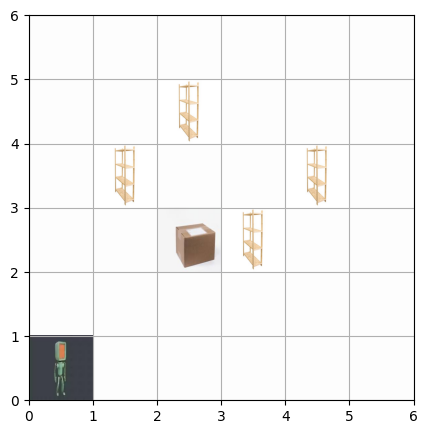

Step: 2
  Action Taken: Drop-off
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



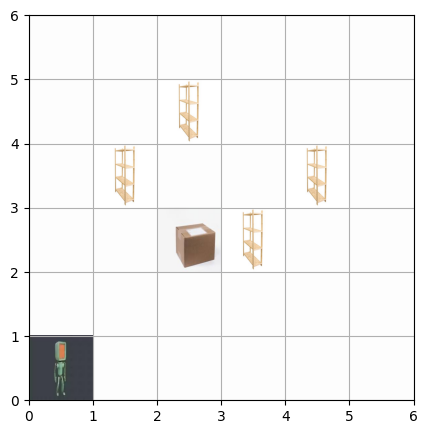

Step: 3
  Action Taken: Drop-off
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



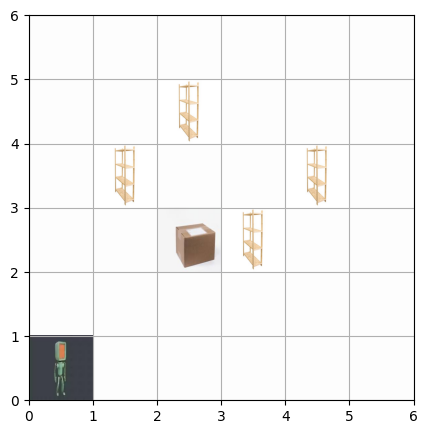

Step: 4
  Action Taken: Drop-off
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



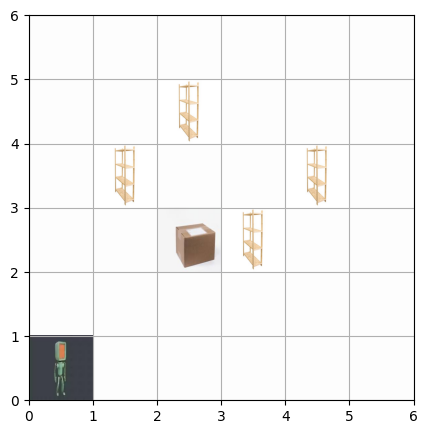

Step: 5
  Action Taken: Right
  Current State: Position=[1 0], Carrying Item=False
  Reward: -1
  Done: False



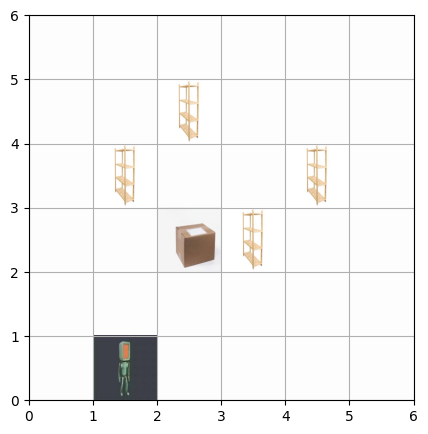

Step: 6
  Action Taken: Pick-up
  Current State: Position=[1 0], Carrying Item=False
  Reward: -1
  Done: False



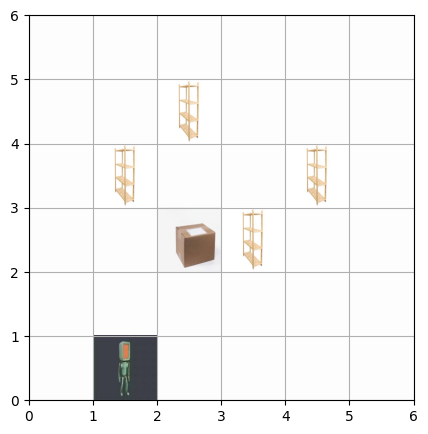

Step: 7
  Action Taken: Right
  Current State: Position=[2 0], Carrying Item=False
  Reward: -1
  Done: False



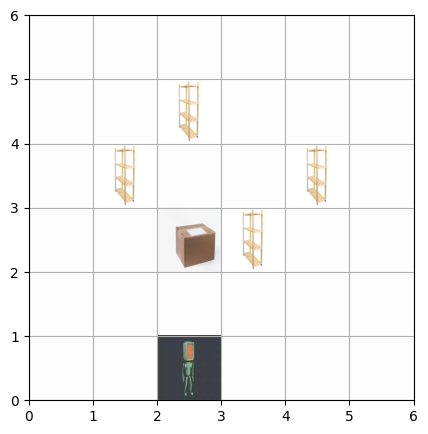

Step: 8
  Action Taken: Drop-off
  Current State: Position=[2 0], Carrying Item=False
  Reward: -1
  Done: False



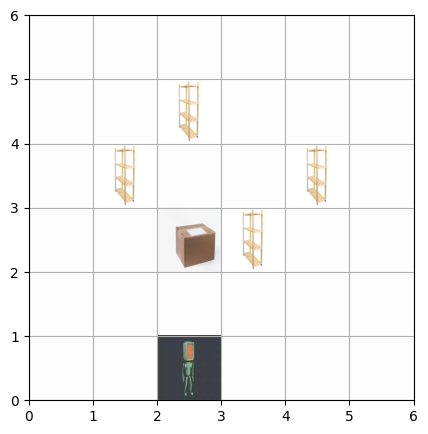

Step: 9
  Action Taken: Down
  Current State: Position=[2 0], Carrying Item=False
  Reward: -1
  Done: False



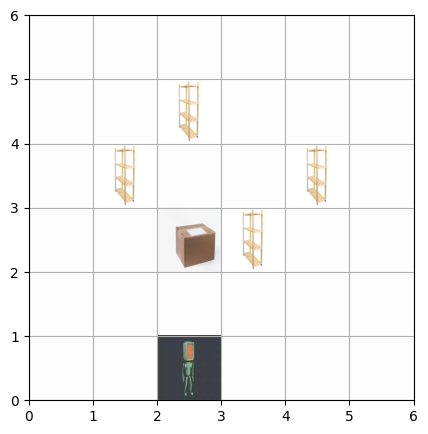

Step: 10
  Action Taken: Pick-up
  Current State: Position=[2 0], Carrying Item=False
  Reward: -1
  Done: False



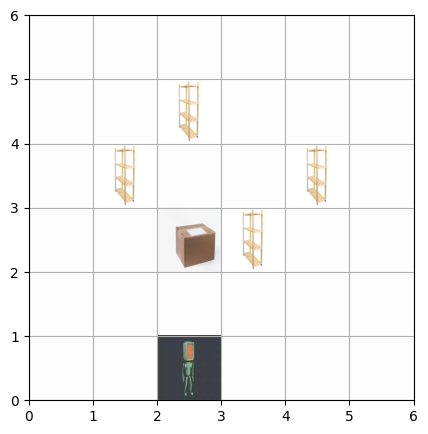

In [3]:
environment = Warehouse_robot()
initial_state = environment.reset()
mapped_actions = {1: "Up", 0: "Down", 2: "Left", 3: "Right", 4: "Pick-up", 5: "Drop-off"}

for step in range(10):
    action = environment.action_space.sample()
    next_state, r, finished, truncated, _ = environment.step(action)  # step() now returns 5 values
    print(f"Step: {step + 1}")
    print(f"  Action Taken: {mapped_actions[action]}")
    print(f"  Current State: Position={next_state[:2]}, Carrying Item={bool(next_state[2])}")
    print(f"  Reward: {r}")
    print(f"  Done: {finished or truncated}\n")  # Consider termination due to truncation
    environment.render()
    
    if finished or truncated:  # Ensure we stop if episode ends
        print("Task completed! The robot successfully delivered the item.")
        break

In [4]:
class Stochastic_warehouse(gym.Env):
    def __init__(self):
        super(Stochastic_warehouse, self).__init__()
        self.grid_size = 6
        self.start_position = (0, 0)
        self.item_position = (2, 2)
        self.dropoff_position = (5, 5)
        self.robot_start_position = self.start_position
        self.carrying = False
        self.obstacles = [(1, 3), (2, 4), (3, 2), (4, 3)]
        self.dynamic_obstacles = [(0, 5), (3, 4)]  
        self.action_space = spaces.Discrete(6)
        self.observation_space = spaces.MultiDiscrete([self.grid_size, self.grid_size, 2])
        self.agent_idle_img = mpimg.imread("idle_agent.jpg")
        self.agent_carrying_img = mpimg.imread("agent_carrying_package.jpg")
        self.obstacle_img = mpimg.imread("obstacle.jpg")
        self.item_img = mpimg.imread("package.jpg")
        self.white_background_image = mpimg.imread("white_background.png")

    def reset(self):
        self.robot_start_position = self.start_position
        self.carrying = False
        observation = np.array([self.robot_start_position[0], self.robot_start_position[1], int(self.carrying)])
        info = {}
        return observation, info

    def step(self, action):
        a, b = self.robot_start_position
        stochastic_nature = 0.1
        terminated = False
        truncated = False
        
        if action in [0, 1, 2, 3]:
            if random.uniform(0, 1) > stochastic_nature:
                if action == 0 and b > 0:
                    b -= 1
                elif action == 1 and b < self.grid_size - 1:
                    b += 1
                elif action == 2 and a > 0:
                    a -= 1
                elif action == 3 and a < self.grid_size - 1:
                    a += 1

        if (a, b) in self.obstacles or (a, b) in self.dynamic_obstacles:
            a, b = self.robot_start_position
            reward = -20
        else:
            reward = -1

        if action == 4 and (a, b) == self.item_position and not self.carrying:
            self.carrying = True
            reward = 25
        elif action == 5 and (a, b) == self.dropoff_position and self.carrying:
            reward = 100
            terminated = True  

        self.robot_start_position = (a, b)
        observation = np.array([a, b, int(self.carrying)])
        info = {}
        return observation, reward, terminated, truncated, info

    def render(self):
        figure, axis = plt.subplots(figsize=(6, 6))
        axis.set_xticks(range(self.grid_size + 1))
        axis.set_yticks(range(self.grid_size + 1))
        axis.grid(True)
        axis.set_xlim(0, self.grid_size)
        axis.set_ylim(0, self.grid_size)

        for obs in self.obstacles:
            axis.imshow(self.obstacle_img, extent=[obs[0], obs[0] + 1, obs[1], obs[1] + 1])
        for obs in self.dynamic_obstacles:
            axis.imshow(self.obstacle_img, extent=[obs[0], obs[0] + 1, obs[1], obs[1] + 1])
        axis.imshow(self.item_img, extent=[self.item_position[0], self.item_position[0] + 1, self.item_position[1], self.item_position[1] + 1])
        axis.imshow(self.item_img, extent=[self.dropoff_position[0], self.dropoff_position[0] + 1, self.dropoff_position[1], self.dropoff_position[1] + 1])
        agent_image = self.agent_carrying_img if self.carrying else self.agent_idle_img
        axis.imshow(agent_image, extent=[self.robot_start_position[0], self.robot_start_position[0] + 1, self.robot_start_position[1], self.robot_start_position[1] + 1])
        plt.show()

Step: 1
  Action Taken: Drop-off
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



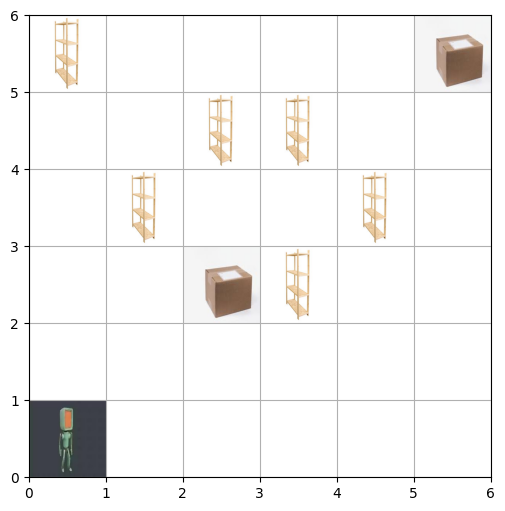

Step: 2
  Action Taken: Left
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



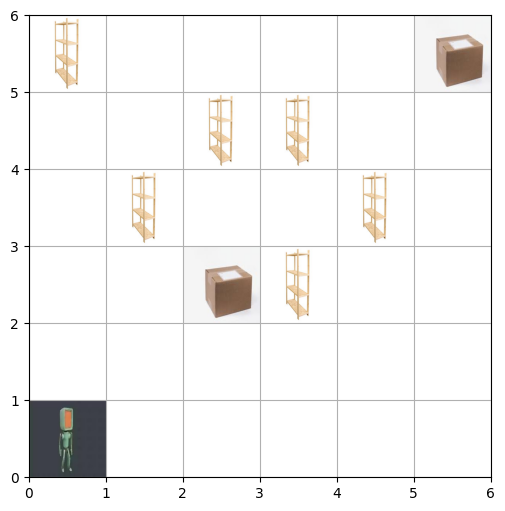

Step: 3
  Action Taken: Right
  Current State: Position=[1 0], Carrying Item=False
  Reward: -1
  Done: False



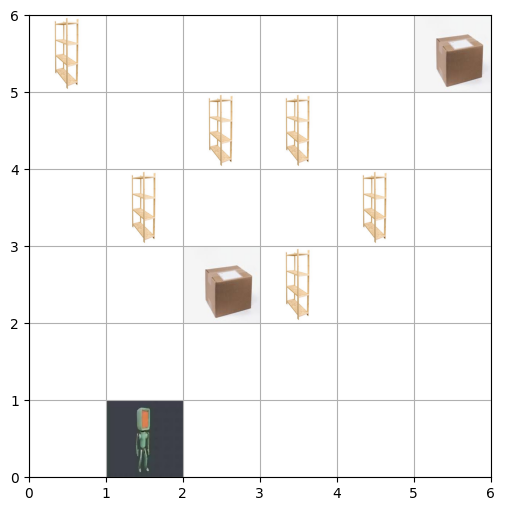

Step: 4
  Action Taken: Drop-off
  Current State: Position=[1 0], Carrying Item=False
  Reward: -1
  Done: False



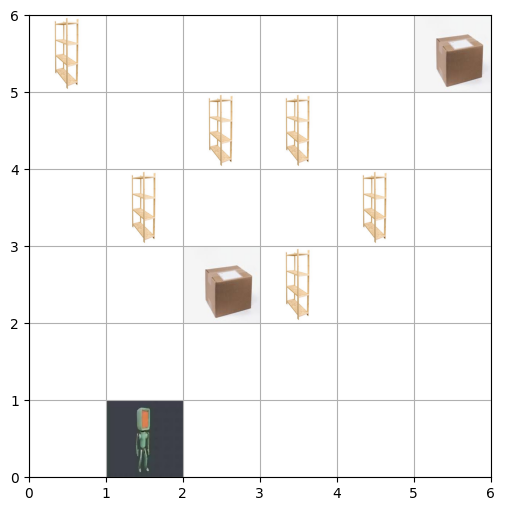

Step: 5
  Action Taken: Up
  Current State: Position=[1 1], Carrying Item=False
  Reward: -1
  Done: False



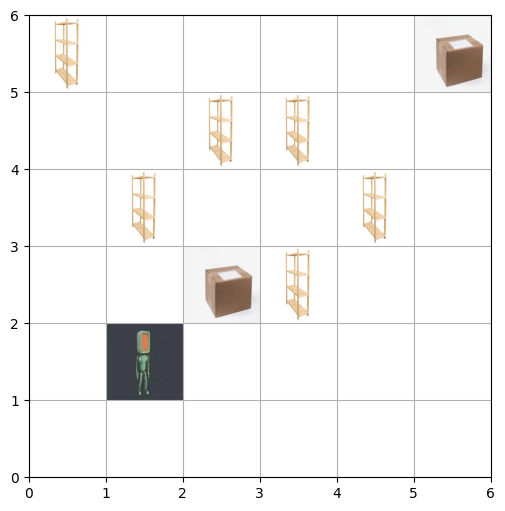

Step: 6
  Action Taken: Right
  Current State: Position=[1 1], Carrying Item=False
  Reward: -1
  Done: False



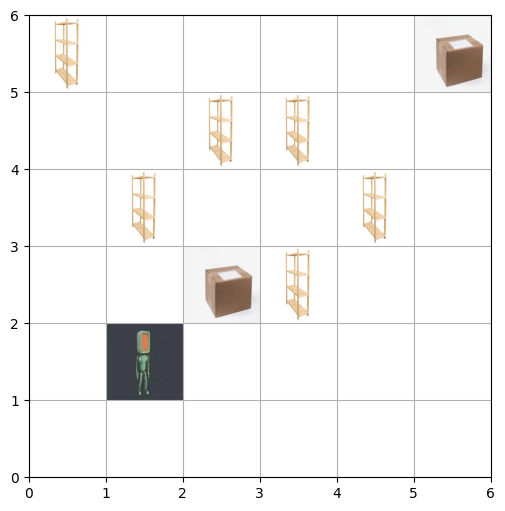

Step: 7
  Action Taken: Down
  Current State: Position=[1 0], Carrying Item=False
  Reward: -1
  Done: False



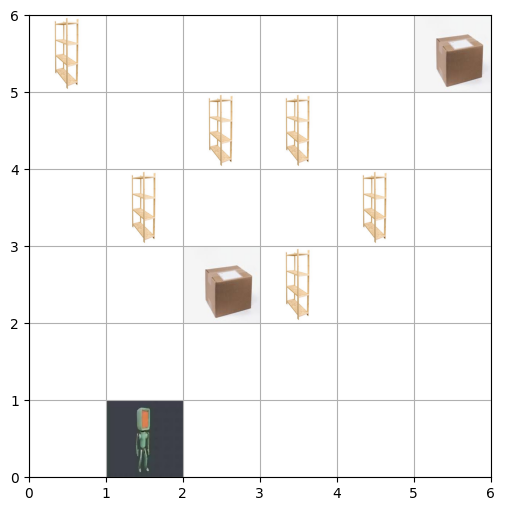

Step: 8
  Action Taken: Left
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



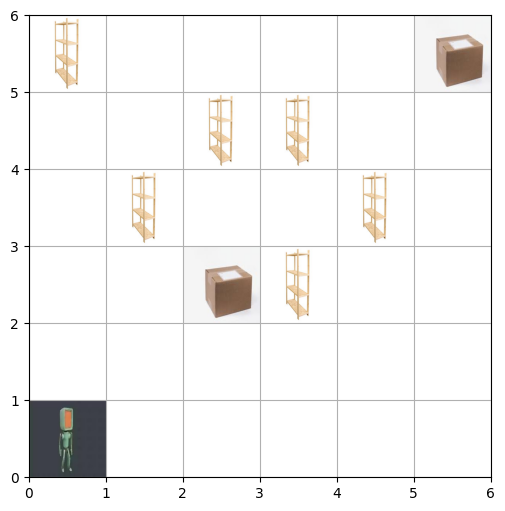

Step: 9
  Action Taken: Pick-up
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



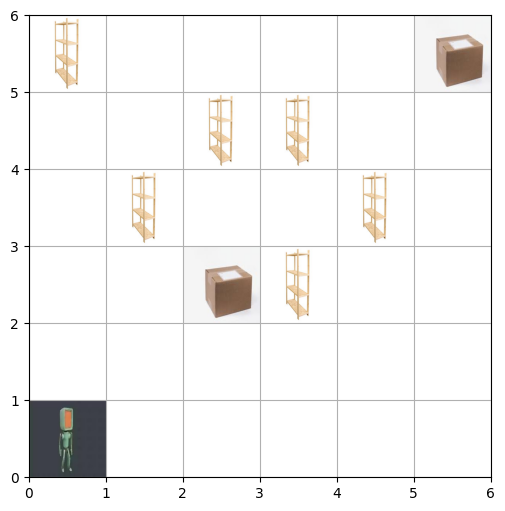

Step: 10
  Action Taken: Drop-off
  Current State: Position=[0 0], Carrying Item=False
  Reward: -1
  Done: False



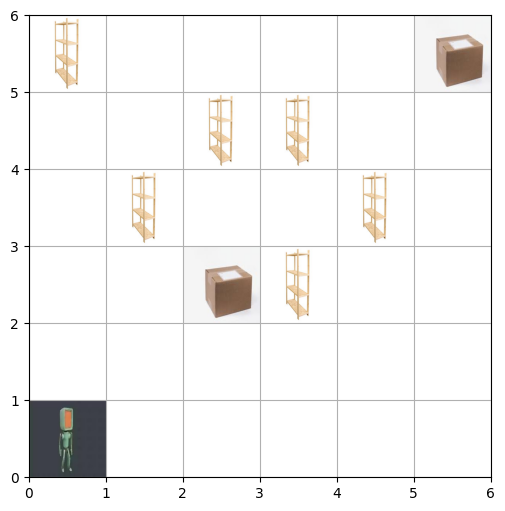

In [5]:
env = Stochastic_warehouse()
state = env.reset()
mapped_actions = {1: "Up", 0: "Down", 2: "Left", 3: "Right", 4: "Pick-up", 5: "Drop-off"}

for step in range(10):
    action = env.action_space.sample()
    next_state, r, finished, truncated, _ = env.step(action)  # step() now returns 5 values
    print(f"Step: {step + 1}")
    print(f"  Action Taken: {mapped_actions[action]}")
    print(f"  Current State: Position={next_state[:2]}, Carrying Item={bool(next_state[2])}")
    print(f"  Reward: {r}")
    print(f"  Done: {finished or truncated}\n")  # Consider termination due to truncation
    env.render()
    
    if finished or truncated:  # Ensure we stop if episode ends
        print("Task completed! The robot successfully delivered the item.")
        break

### Q Learning:

### Deterministic environment(Base model):

In [6]:
environment = Warehouse_robot()
gamma = 0.9
alpha = 0.1
epsilon = 0.1
num_episodes = 500

def initialize_q_table():
    return defaultdict(lambda: np.zeros(environment.action_space.n))

Q = initialize_q_table()

print("Initial Q-table:")
print(dict(Q))

def epsilon_greedy_policy(state, epsilon):
    if random.uniform(0, 1) < epsilon:
        return environment.action_space.sample()
    else:
        return np.argmax(Q[state])
    
def train_q_learning():
    rewards_per_episode = []
    epsilon_values = []
    
    for episode in range(num_episodes):
        state, _ = environment.reset()
        state = tuple(state)  # Convert to tuple
        total_reward = 0
        done = False
        
        while not done:
            action = epsilon_greedy_policy(state, epsilon)
            next_state, reward, done, _, _ = environment.step(action)  # Unpack correctly
            next_state = tuple(next_state)  # Convert to tuple
            
            best_next_action = np.argmax(Q[next_state])
            Q[state][action] += alpha * (reward + gamma * Q[next_state][best_next_action] - Q[state][action])
            
            state = next_state
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
        epsilon_values.append(epsilon)
        if (episode + 1) % 50 == 0:
            print(f"Episode {episode + 1}, Total Reward: {total_reward}")
    
    return rewards_per_episode, epsilon_values

rewards, epsilon_values = train_q_learning()

print("Trained Q-table:")
print(dict(Q))

# Save the Q-table as a pickle file
with open("q_table.pkl", "wb") as f:
    pickle.dump(dict(Q), f)

print("Q-table saved as q_table.pkl")

Initial Q-table:
{}
Episode 50, Total Reward: 95
Episode 100, Total Reward: 115
Episode 150, Total Reward: 115
Episode 200, Total Reward: 115
Episode 250, Total Reward: 115
Episode 300, Total Reward: 115
Episode 350, Total Reward: 114
Episode 400, Total Reward: 115
Episode 450, Total Reward: 111
Episode 500, Total Reward: 110
Trained Q-table:
{(0, 0, 0): array([ 77.8602535 ,  40.04175081,  69.70882664, 317.43132407,
        81.34655756, 108.75326182]), (0, 1, 0): array([ -0.54502527,  -0.58920049,  -0.57655314, 236.83188028,
        -0.58519851,  -0.58519851]), (1, 0, 0): array([145.46640892, 354.58297495, 147.06717401, 136.26314303,
       118.41852899, 172.70038658]), (1, 1, 0): array([100.79706777,  51.41428799,  64.87885809, 395.82899208,
        85.62729514, 237.58482531]), (0, 2, 0): array([-0.4107114 , -0.28      , -0.29701   , -0.09563704, -0.29701   ,
       -0.29701   ]), (1, 2, 0): array([ 3.41685507e+01, -2.00000000e+00, -1.99000000e-01,  3.38846857e+02,
       -1.00000000e

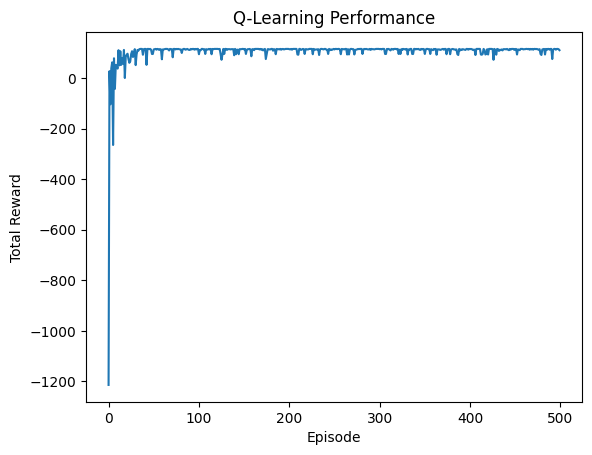

In [7]:
# Plot the total reward per episode
plt.figure()
plt.plot(rewards)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Q-Learning Performance')
plt.show()

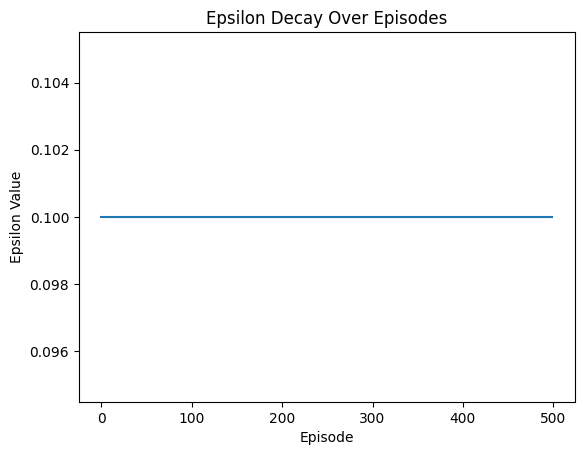

In [8]:
# Plot the epsilon decay
plt.figure()
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.title('Epsilon Decay Over Episodes')
plt.show()

Step 0: Action = Right, Position=(1, 0), Carrying=False, Reward=-1


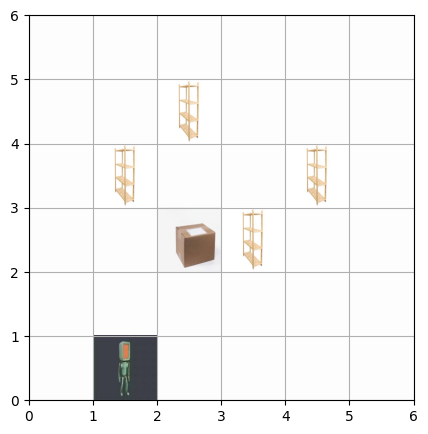

Step 1: Action = Up, Position=(1, 1), Carrying=False, Reward=-1


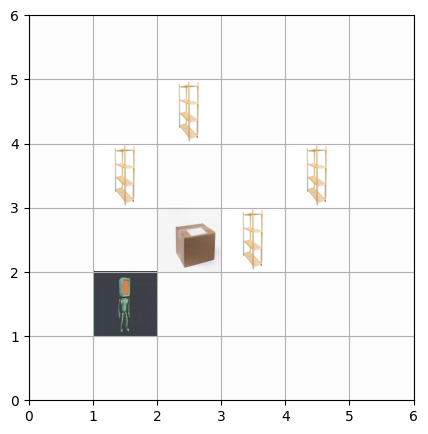

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


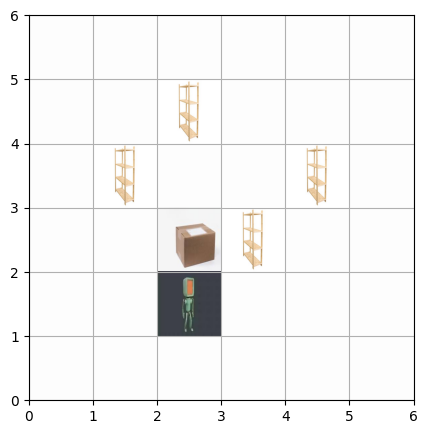

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


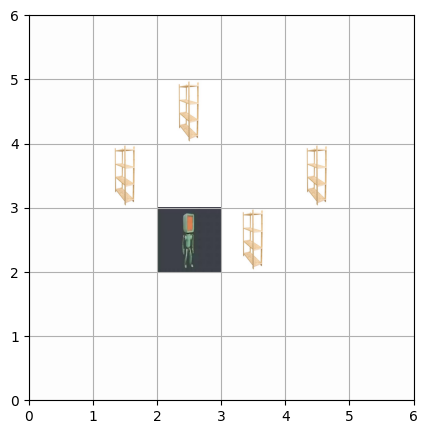

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


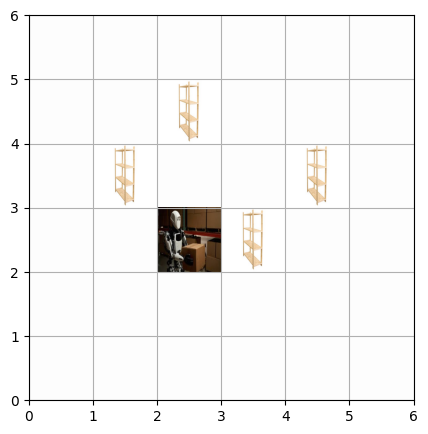

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


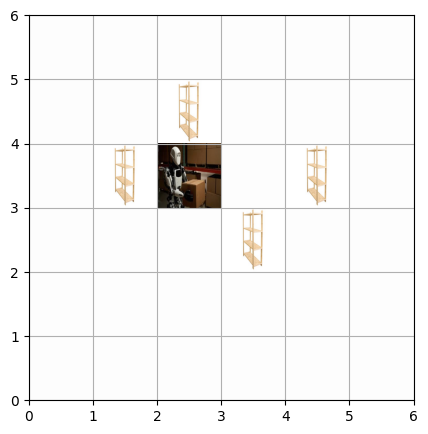

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


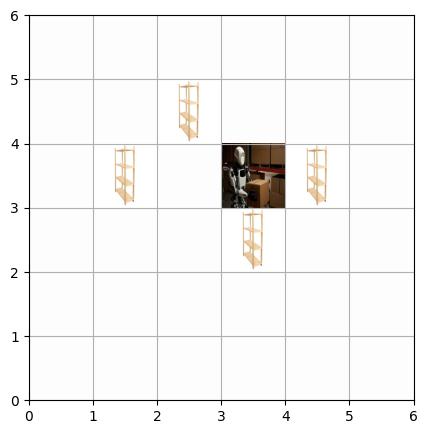

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


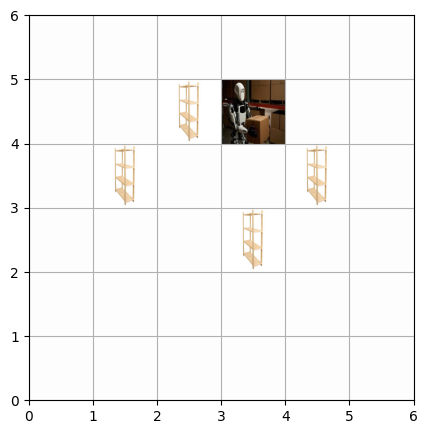

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


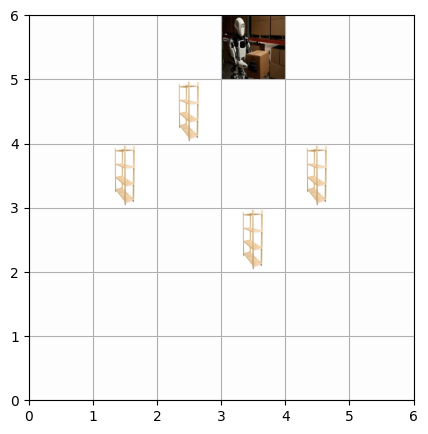

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


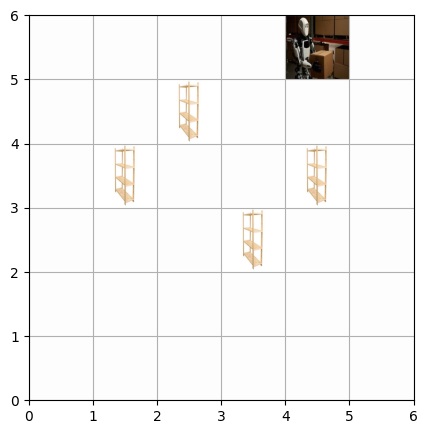

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


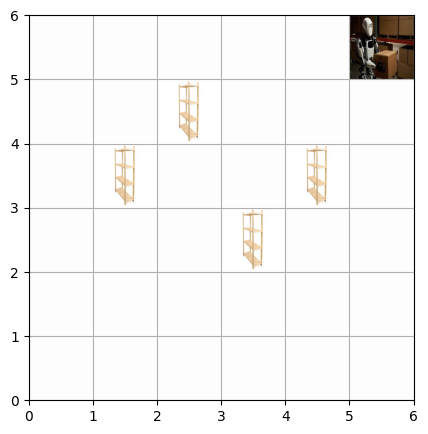

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


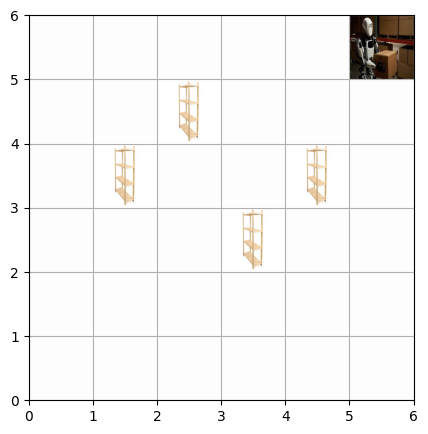

Episode 1: Task completed! Total Reward: 115
Step 0: Action = Right, Position=(1, 0), Carrying=False, Reward=-1


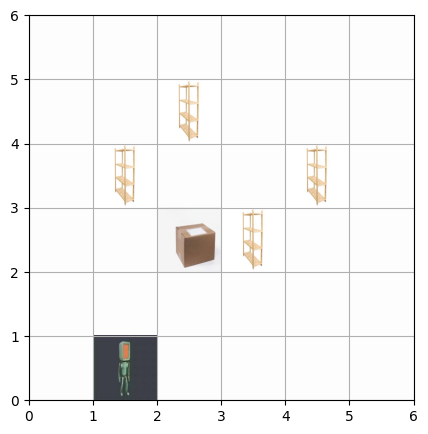

Step 1: Action = Up, Position=(1, 1), Carrying=False, Reward=-1


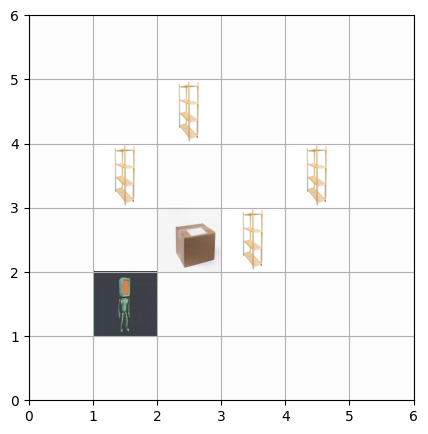

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


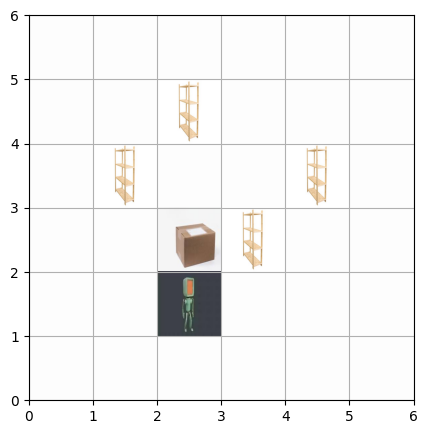

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


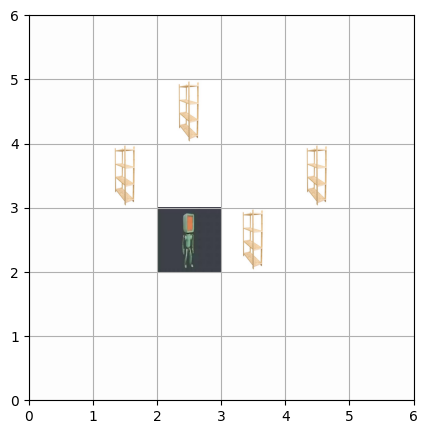

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


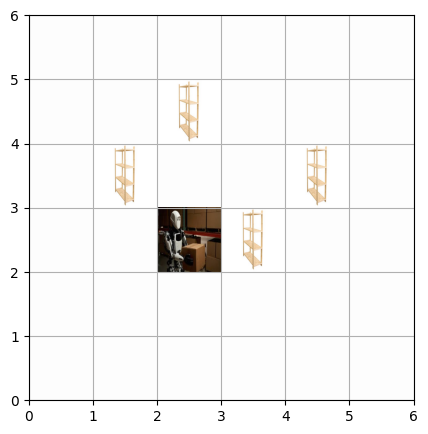

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


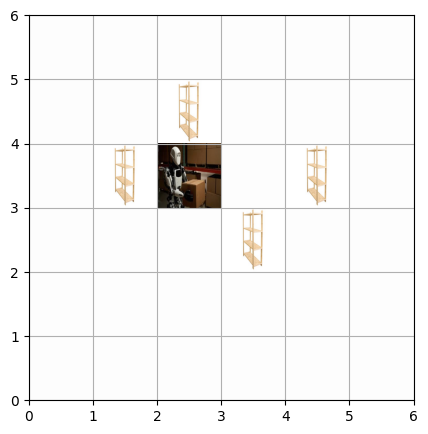

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


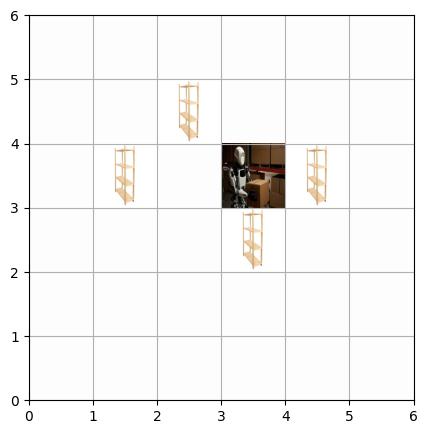

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


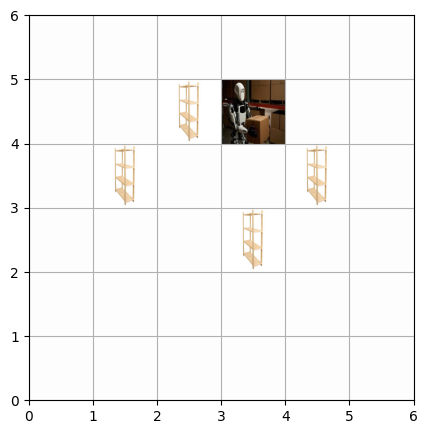

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


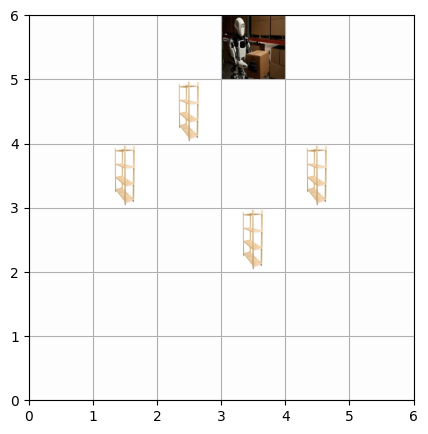

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


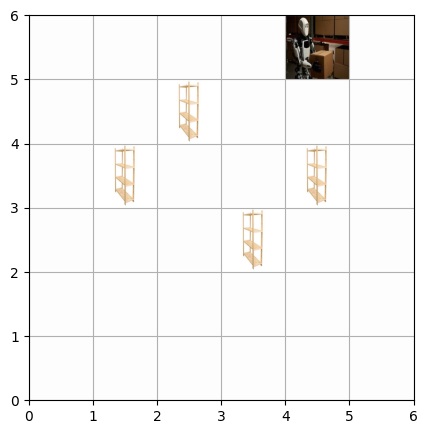

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


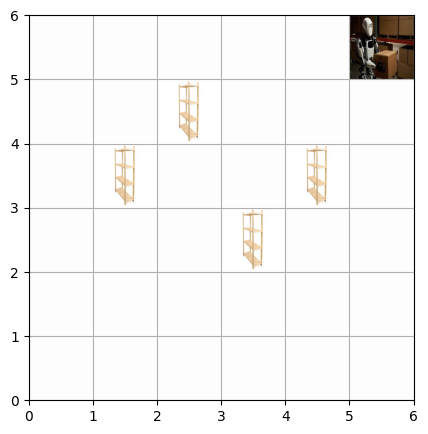

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


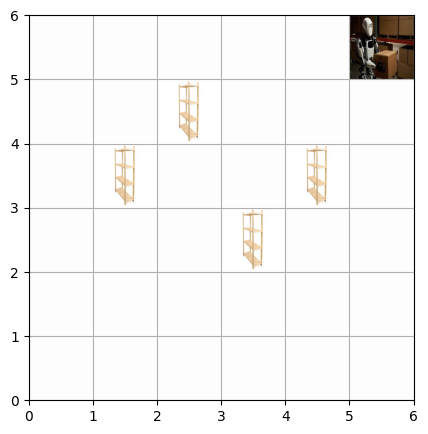

Episode 2: Task completed! Total Reward: 115
Step 0: Action = Right, Position=(1, 0), Carrying=False, Reward=-1


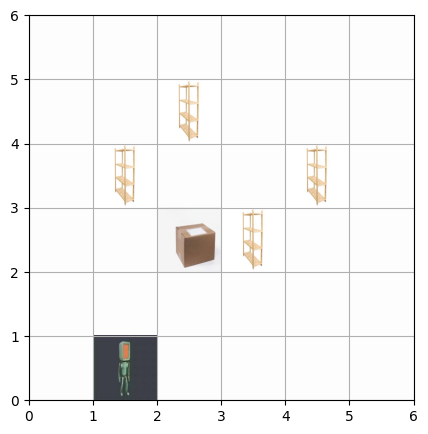

Step 1: Action = Up, Position=(1, 1), Carrying=False, Reward=-1


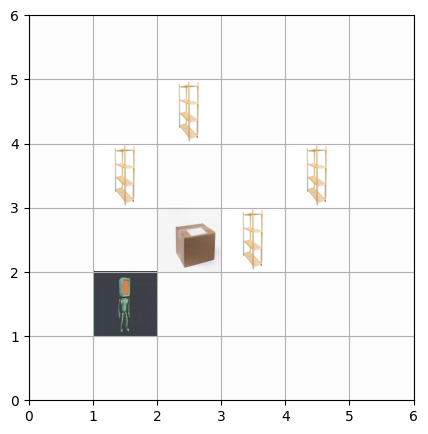

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


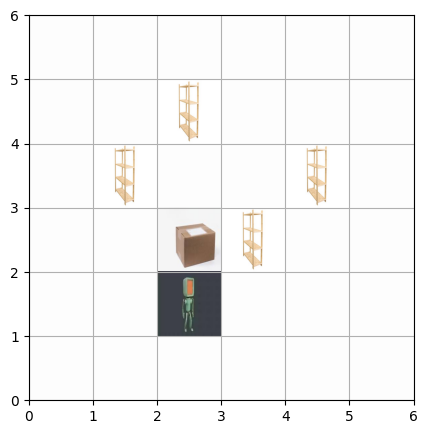

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


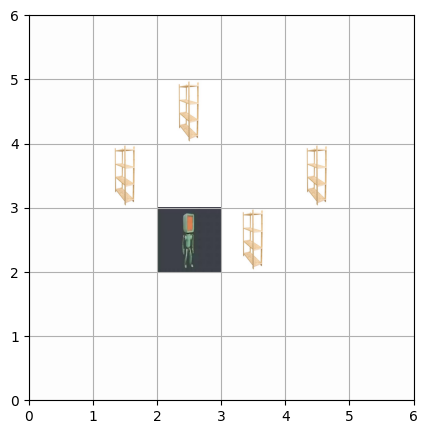

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


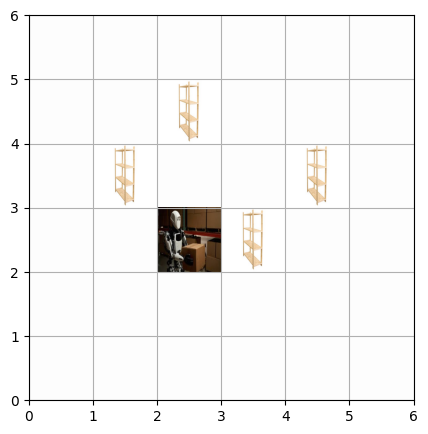

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


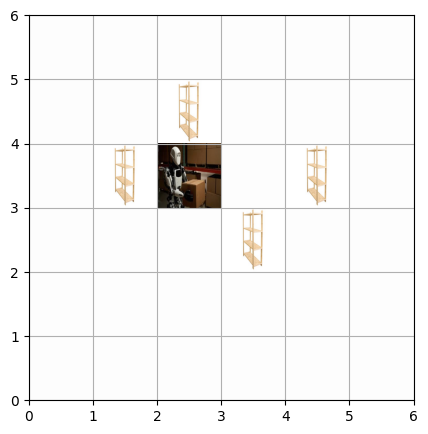

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


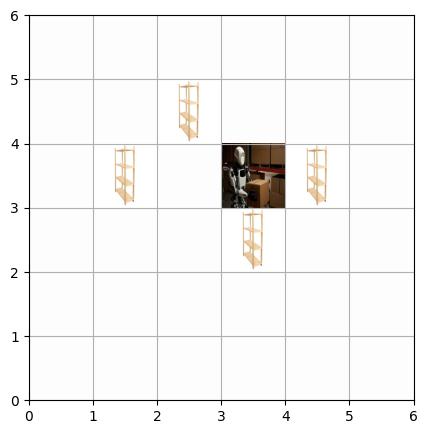

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


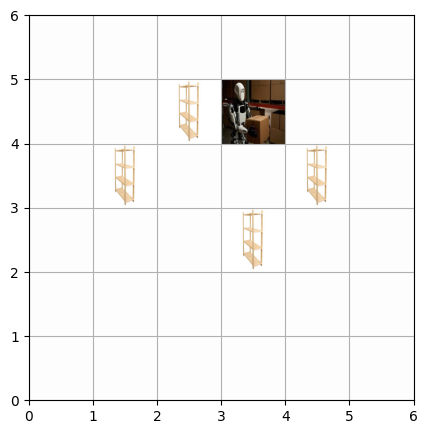

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


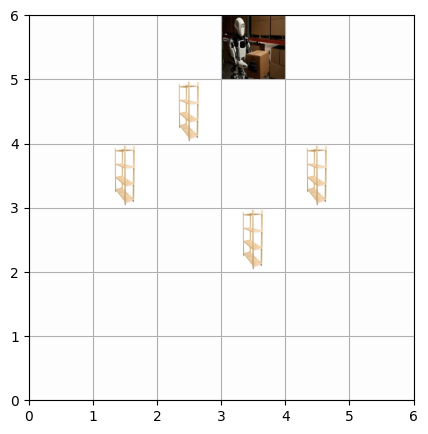

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


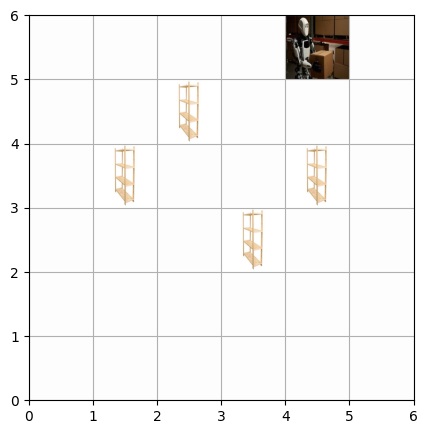

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


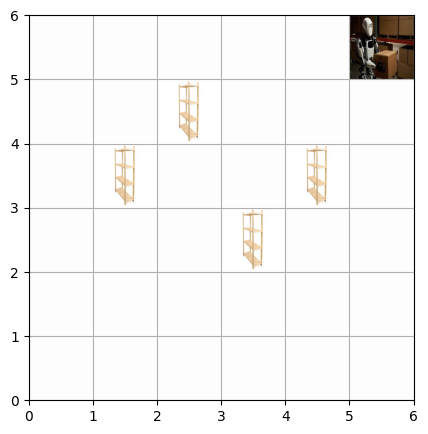

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


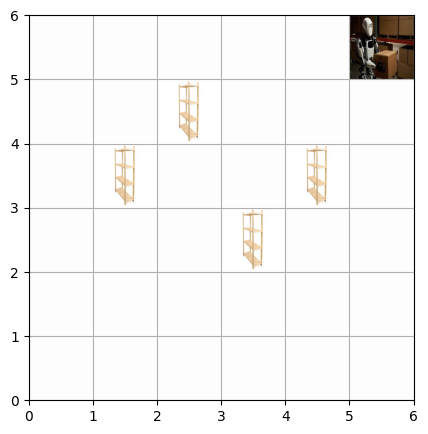

Episode 3: Task completed! Total Reward: 115
Step 0: Action = Right, Position=(1, 0), Carrying=False, Reward=-1


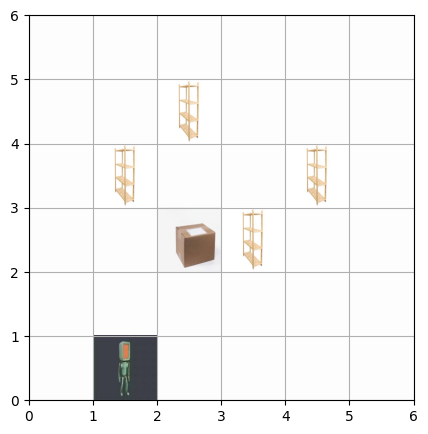

Step 1: Action = Up, Position=(1, 1), Carrying=False, Reward=-1


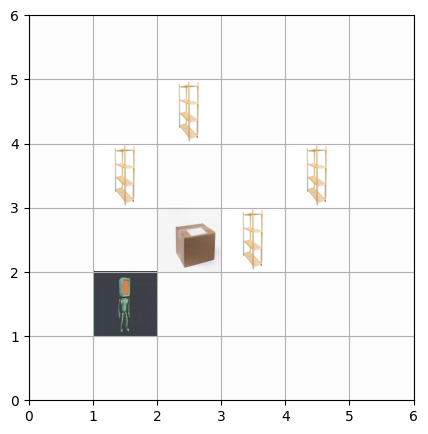

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


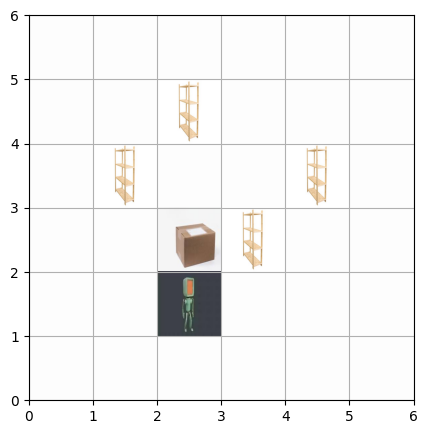

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


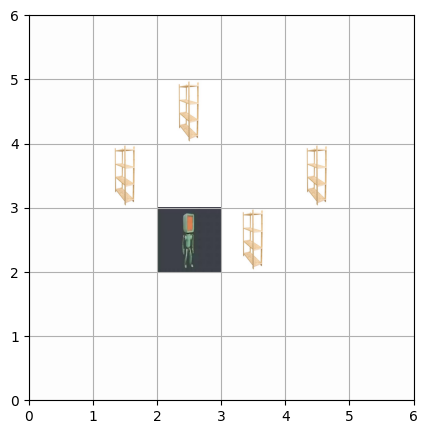

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


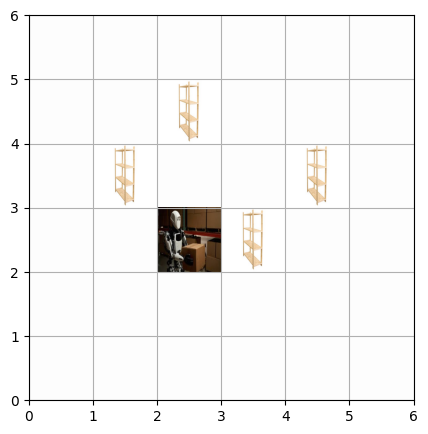

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


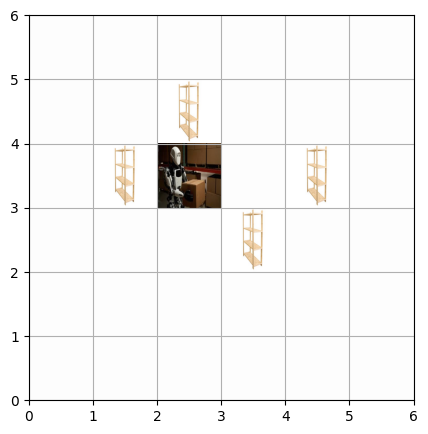

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


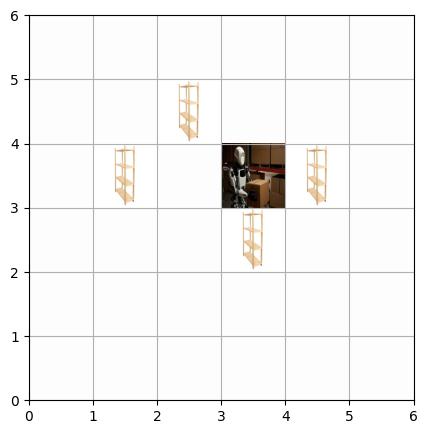

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


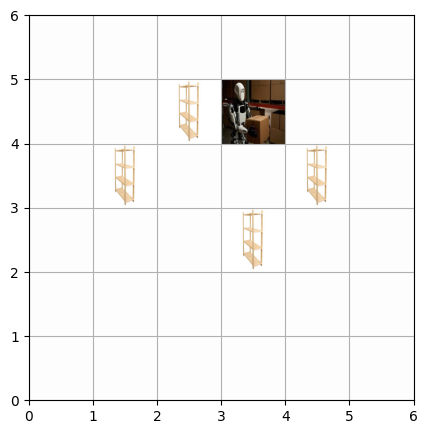

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


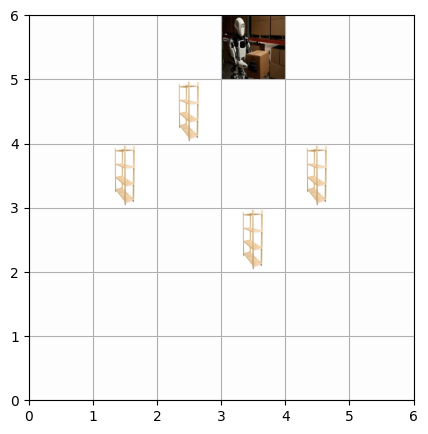

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


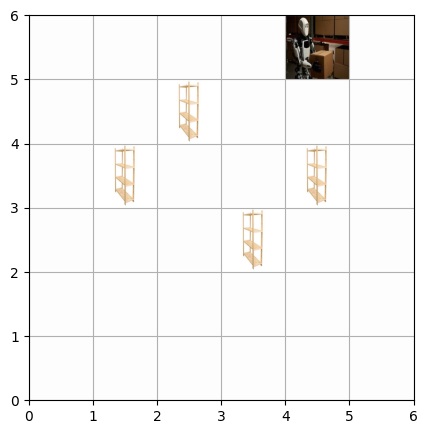

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


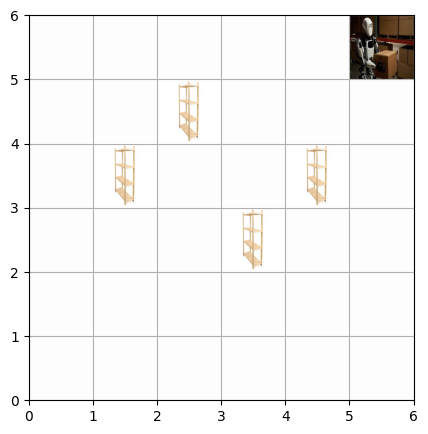

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


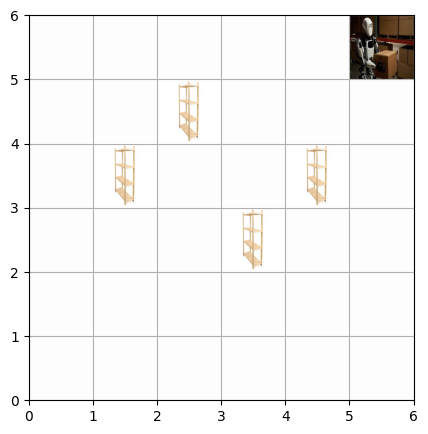

Episode 4: Task completed! Total Reward: 115
Step 0: Action = Right, Position=(1, 0), Carrying=False, Reward=-1


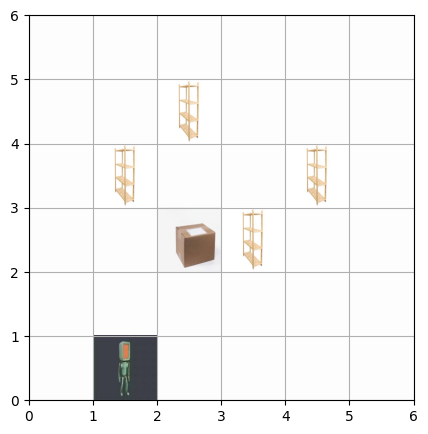

Step 1: Action = Up, Position=(1, 1), Carrying=False, Reward=-1


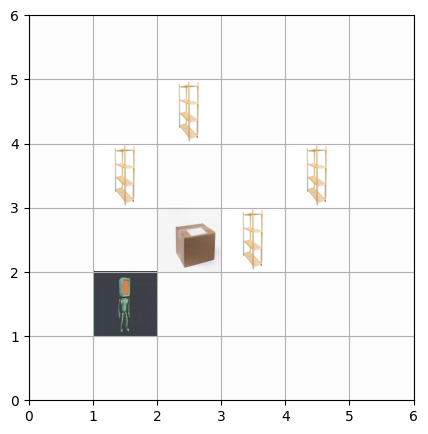

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


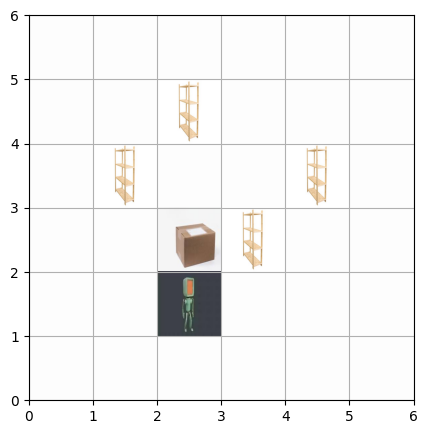

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


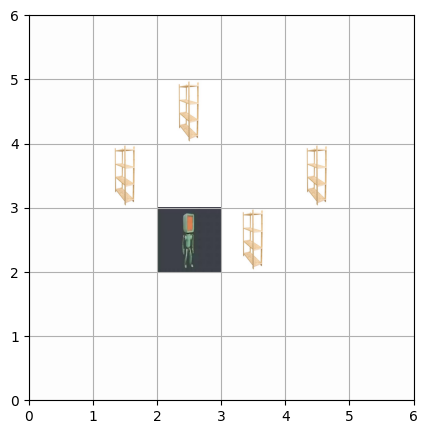

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


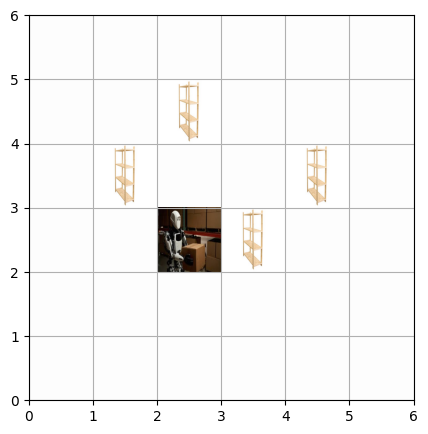

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


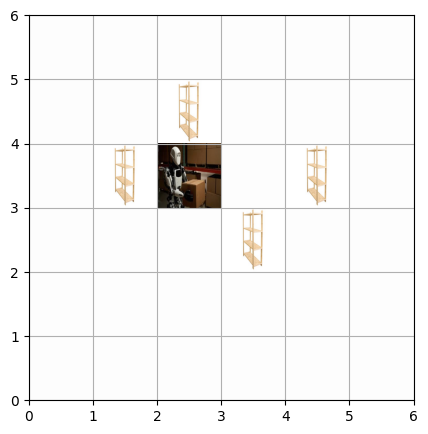

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


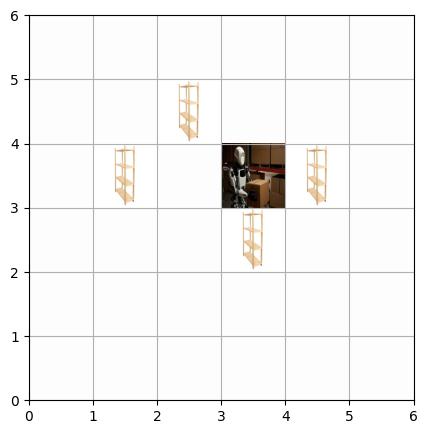

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


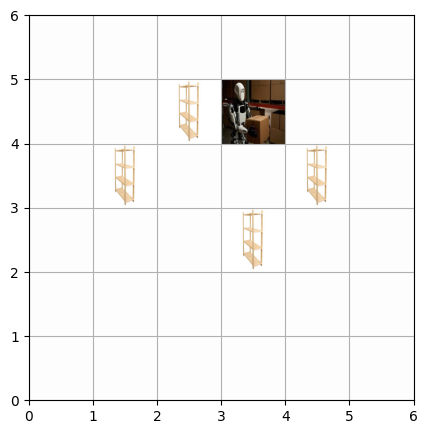

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


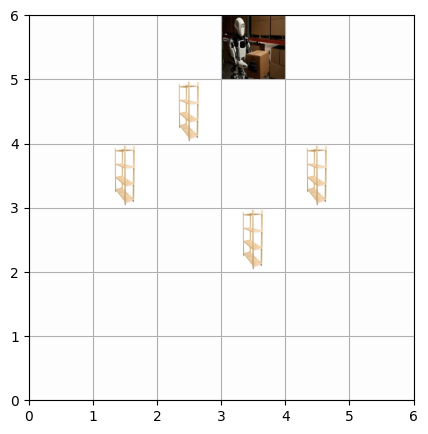

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


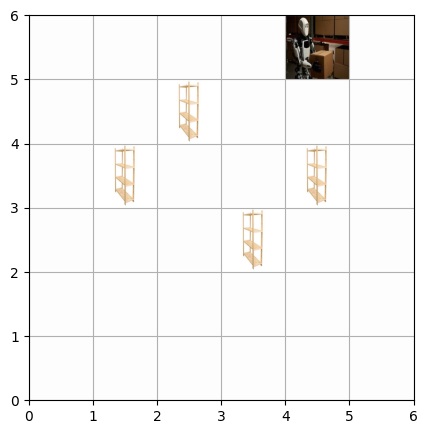

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


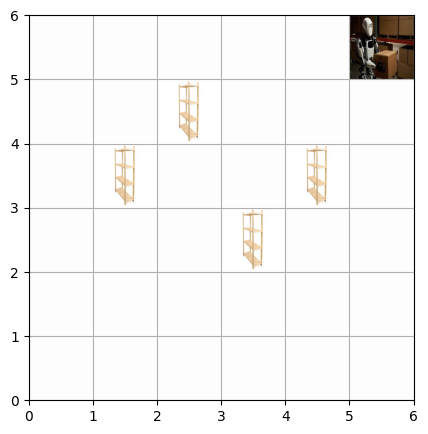

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


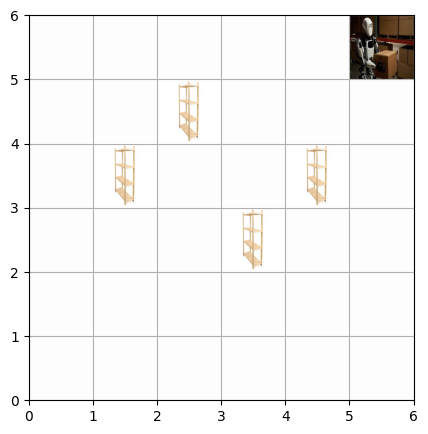

Episode 5: Task completed! Total Reward: 115
Step 0: Action = Right, Position=(1, 0), Carrying=False, Reward=-1


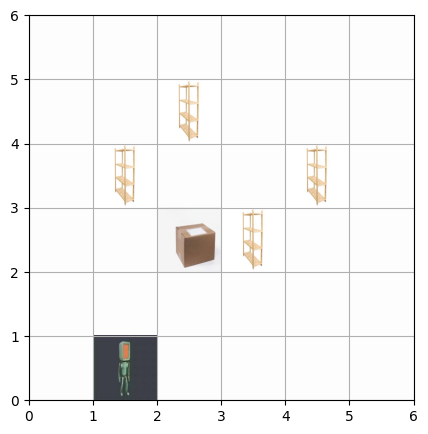

Step 1: Action = Up, Position=(1, 1), Carrying=False, Reward=-1


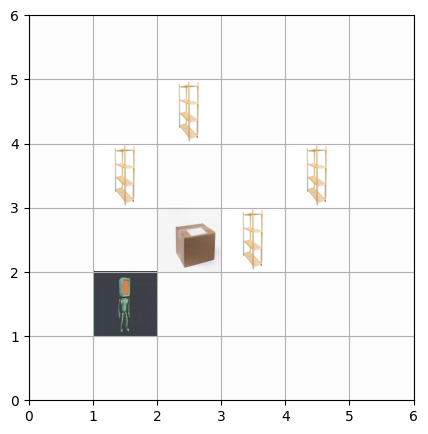

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


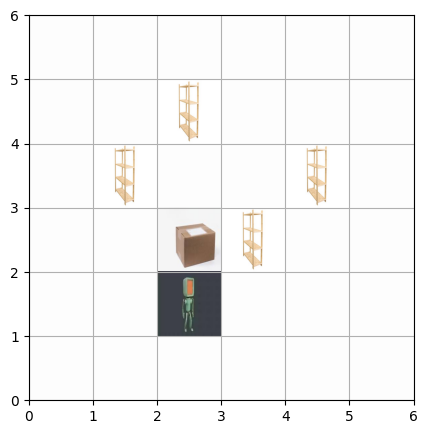

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


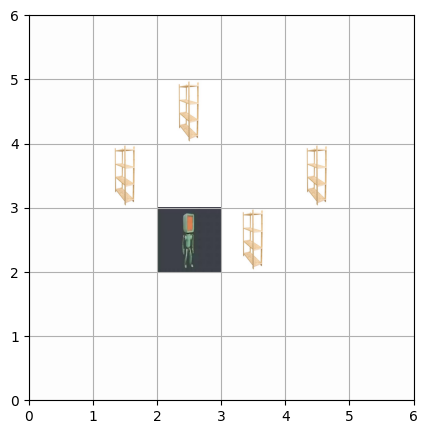

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


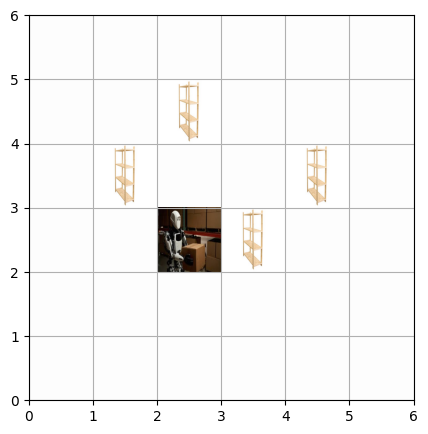

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


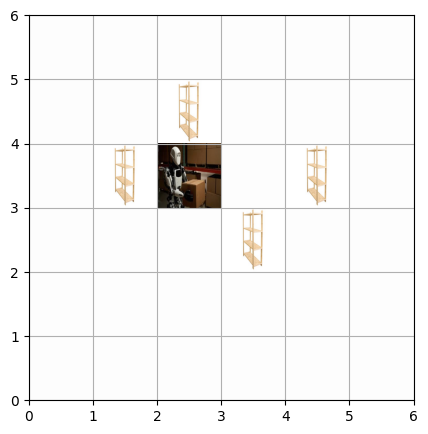

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


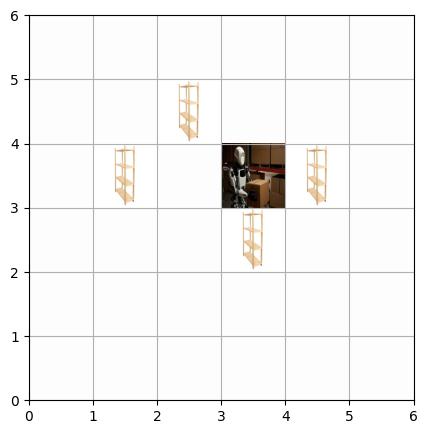

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


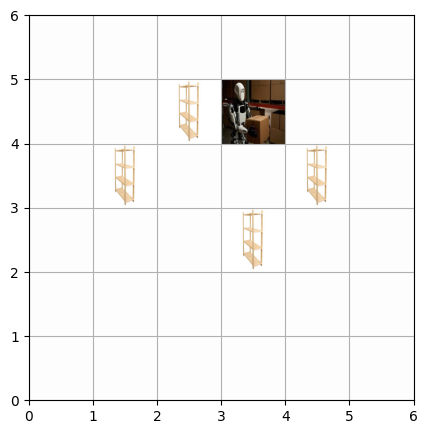

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


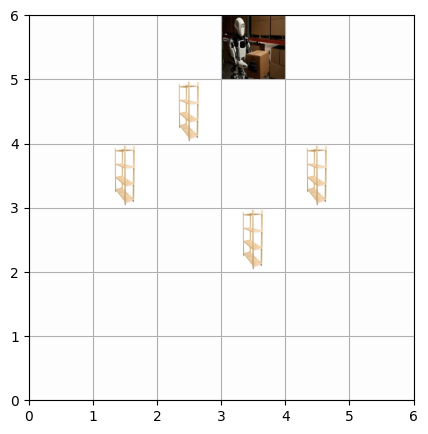

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


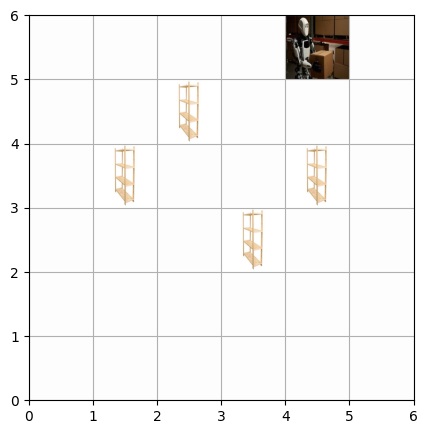

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


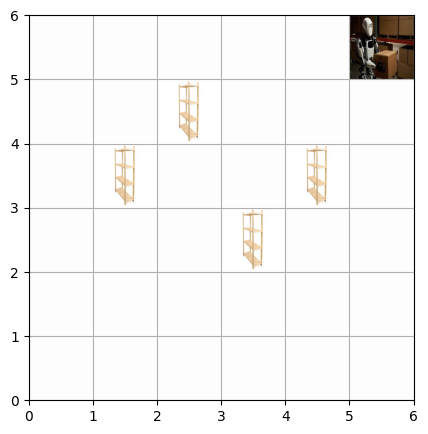

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


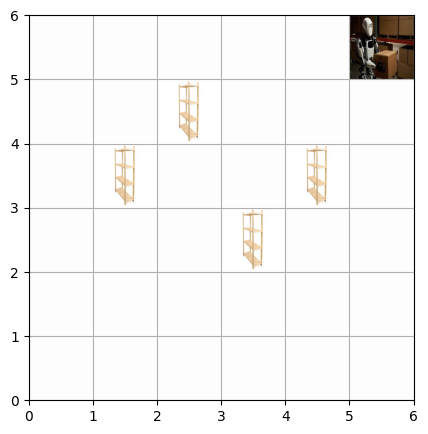

Episode 6: Task completed! Total Reward: 115
Step 0: Action = Right, Position=(1, 0), Carrying=False, Reward=-1


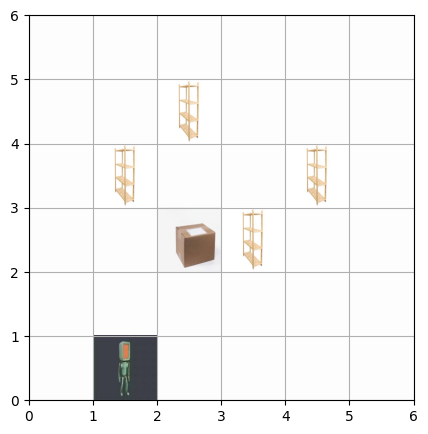

Step 1: Action = Up, Position=(1, 1), Carrying=False, Reward=-1


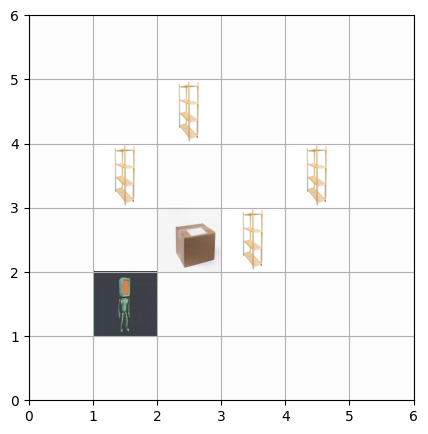

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


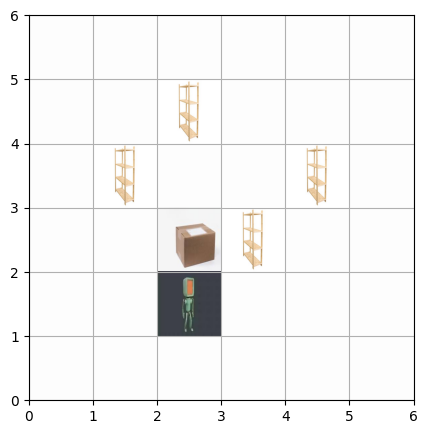

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


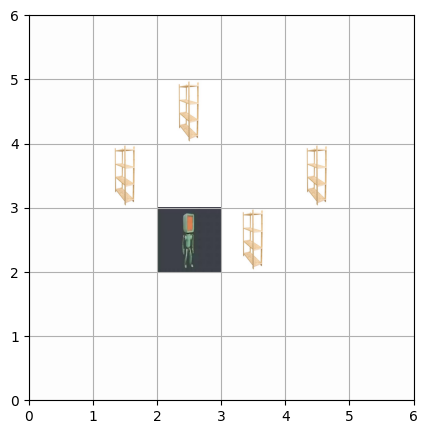

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


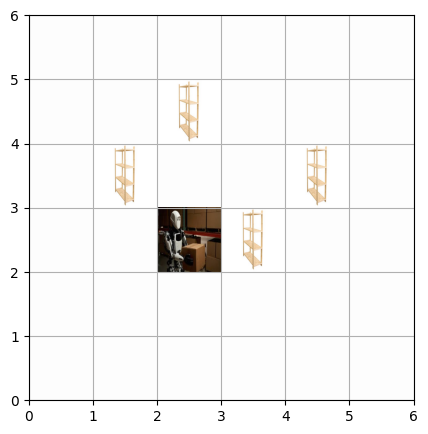

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


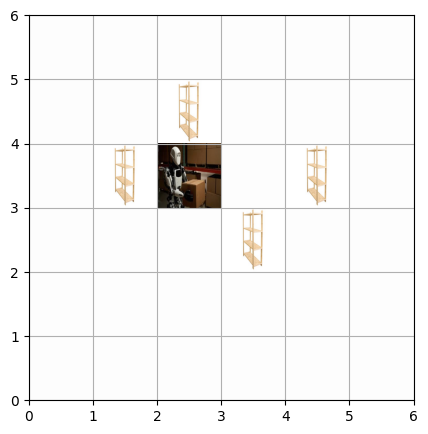

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


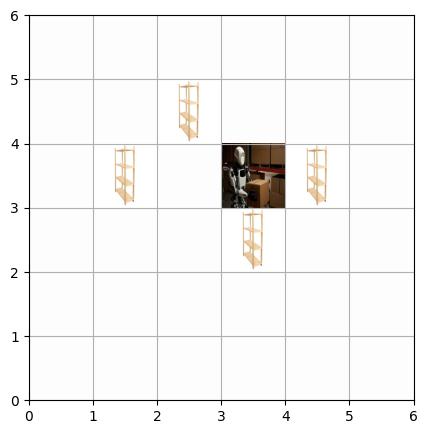

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


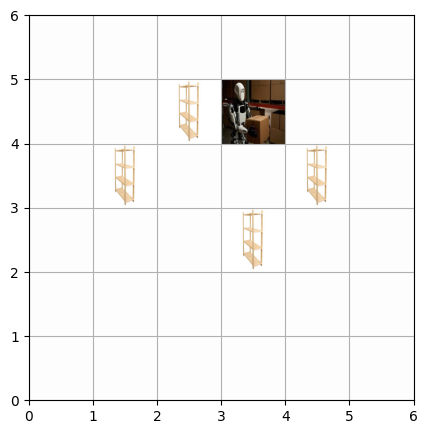

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


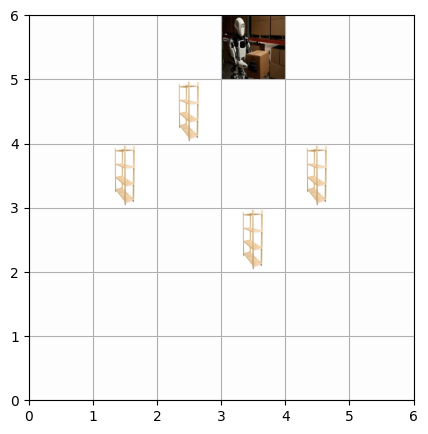

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


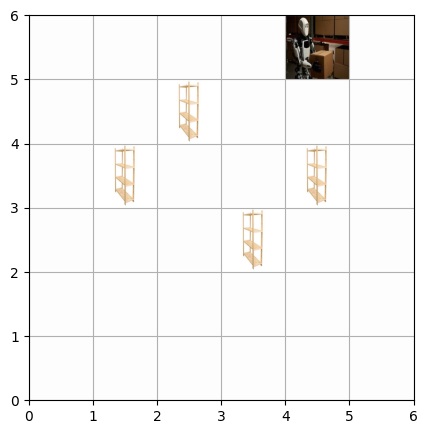

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


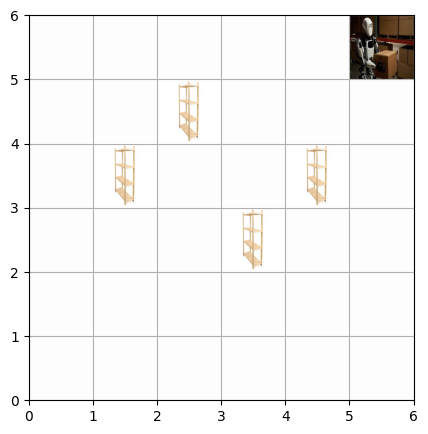

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


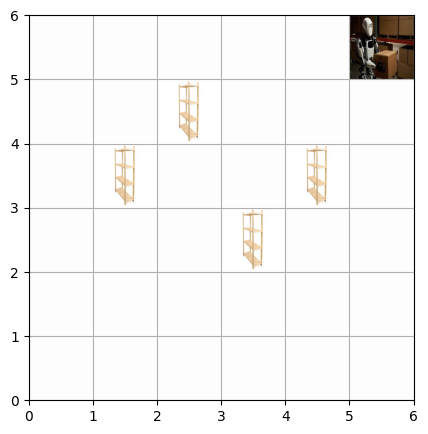

Episode 7: Task completed! Total Reward: 115
Step 0: Action = Right, Position=(1, 0), Carrying=False, Reward=-1


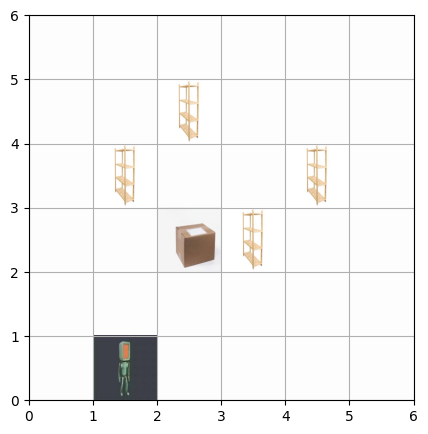

Step 1: Action = Up, Position=(1, 1), Carrying=False, Reward=-1


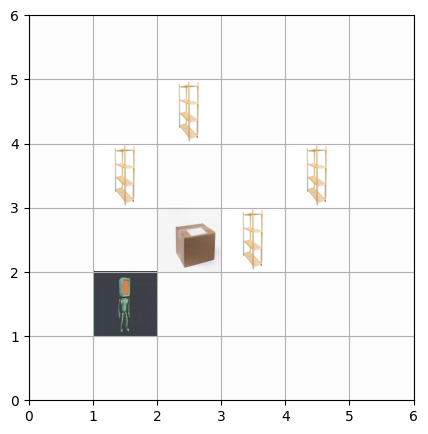

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


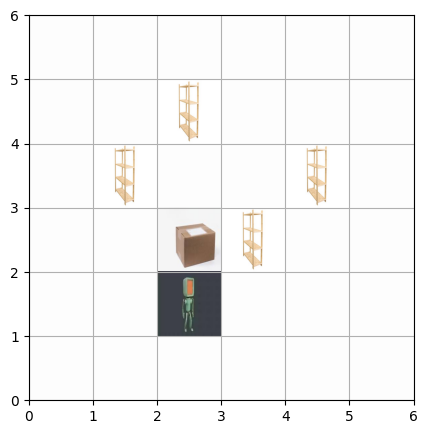

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


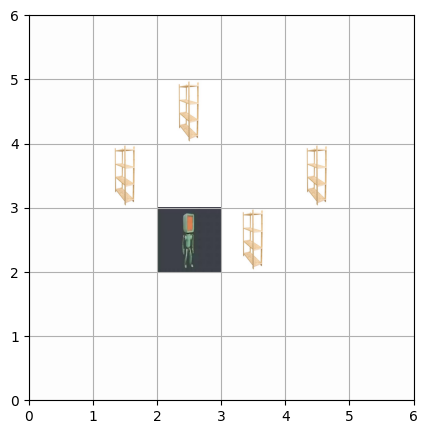

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


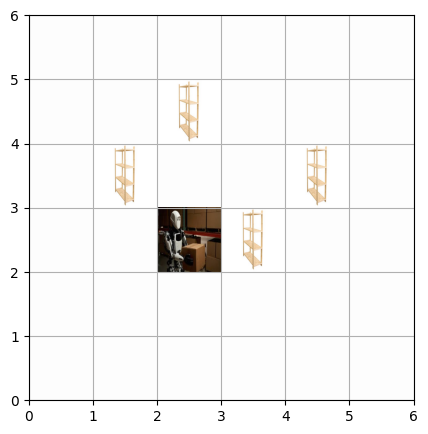

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


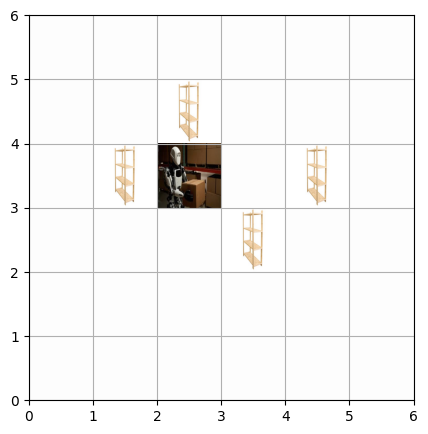

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


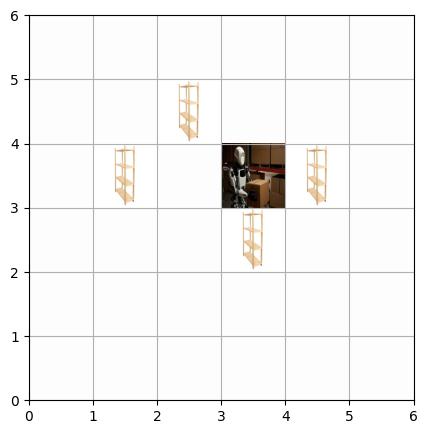

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


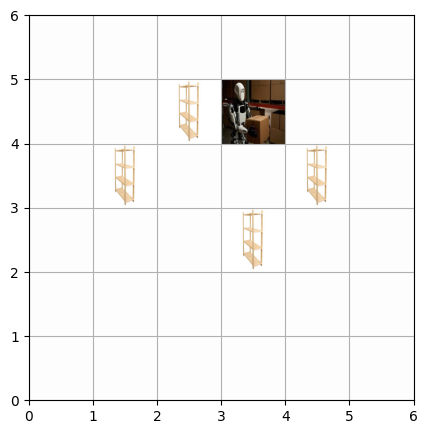

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


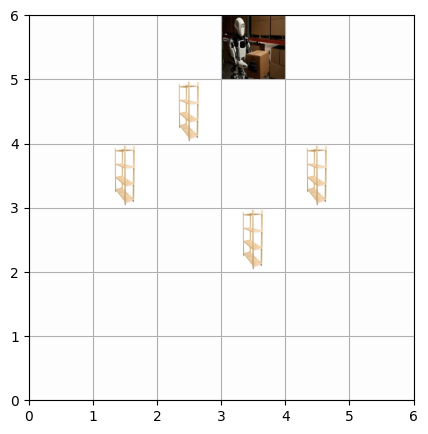

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


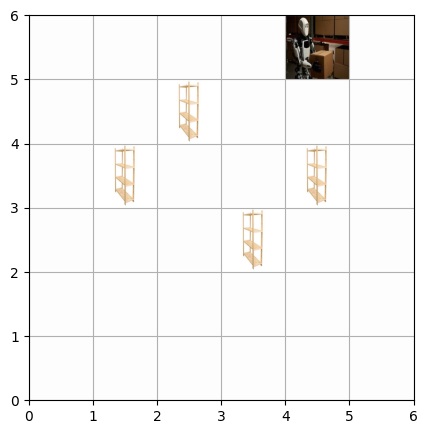

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


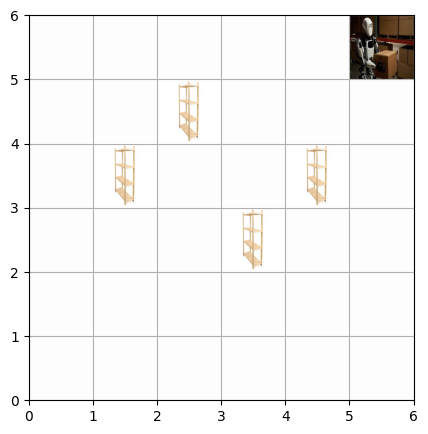

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


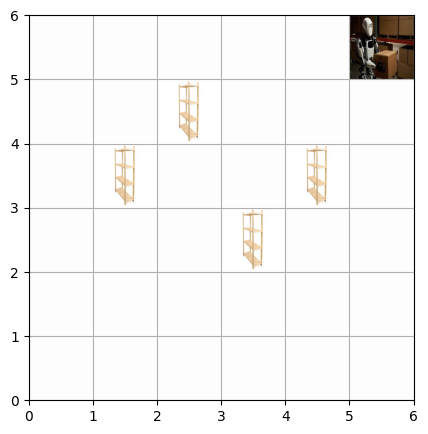

Episode 8: Task completed! Total Reward: 115
Step 0: Action = Right, Position=(1, 0), Carrying=False, Reward=-1


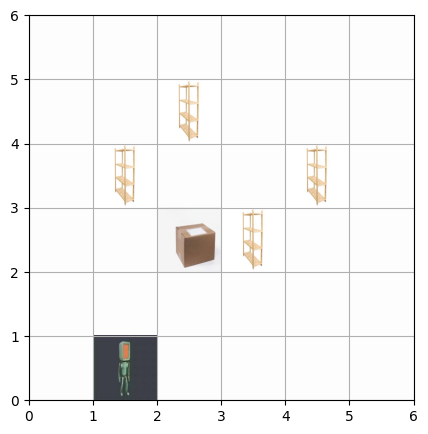

Step 1: Action = Up, Position=(1, 1), Carrying=False, Reward=-1


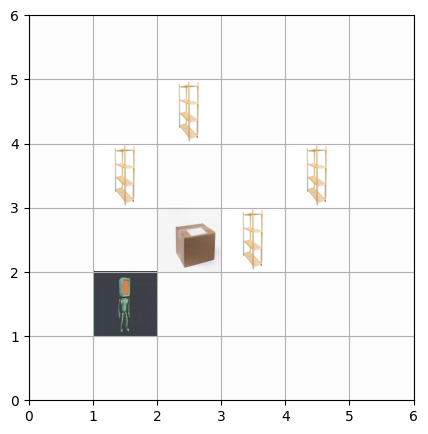

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


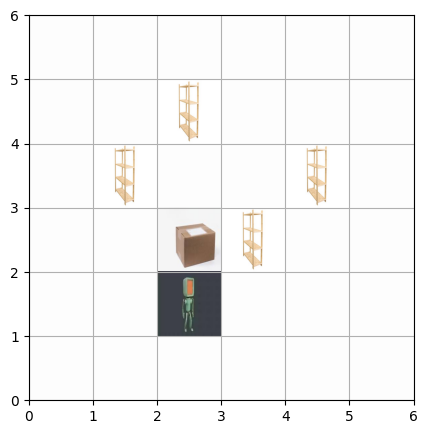

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


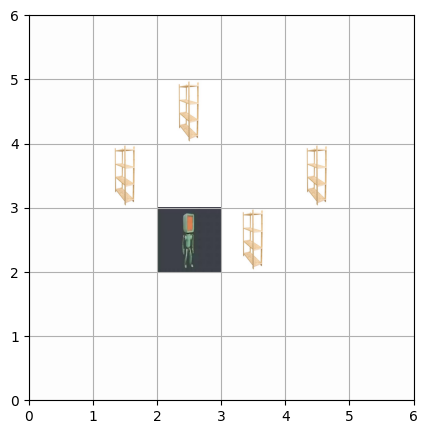

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


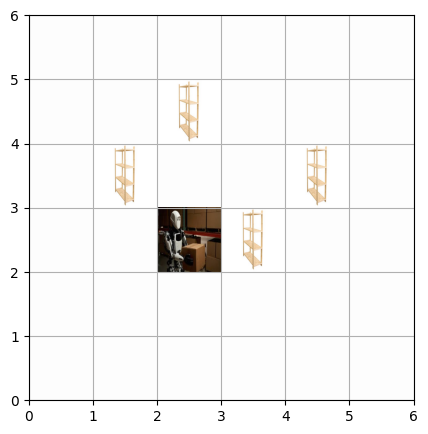

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


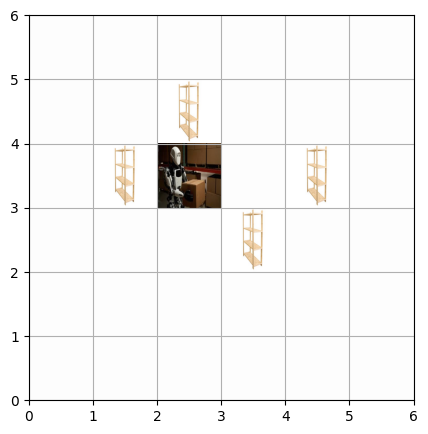

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


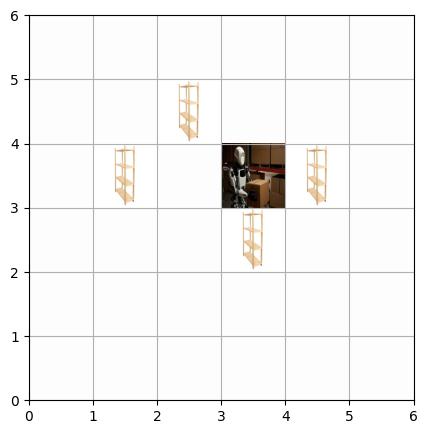

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


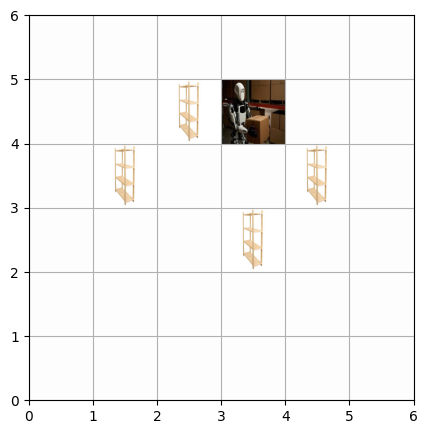

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


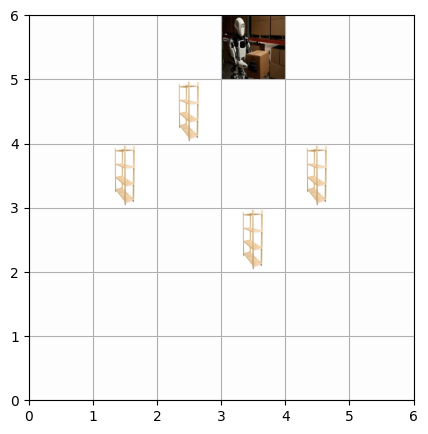

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


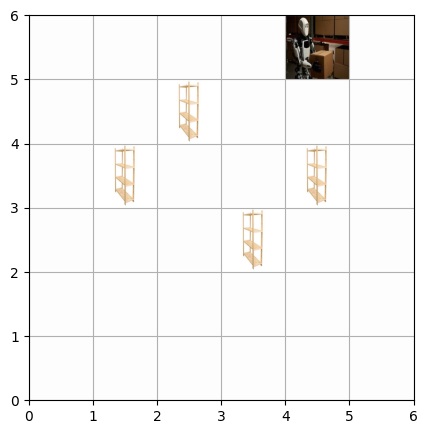

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


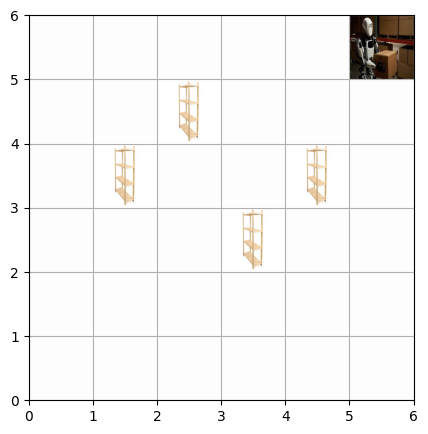

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


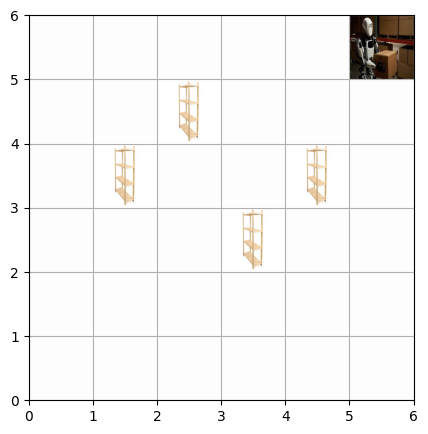

Episode 9: Task completed! Total Reward: 115
Step 0: Action = Right, Position=(1, 0), Carrying=False, Reward=-1


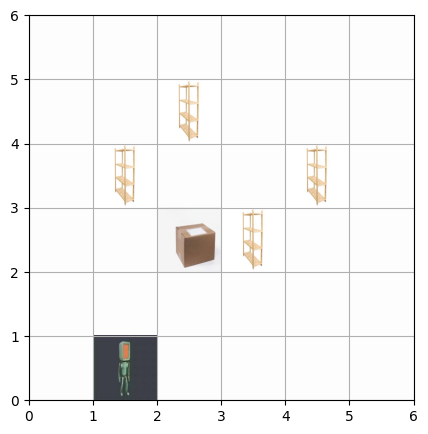

Step 1: Action = Up, Position=(1, 1), Carrying=False, Reward=-1


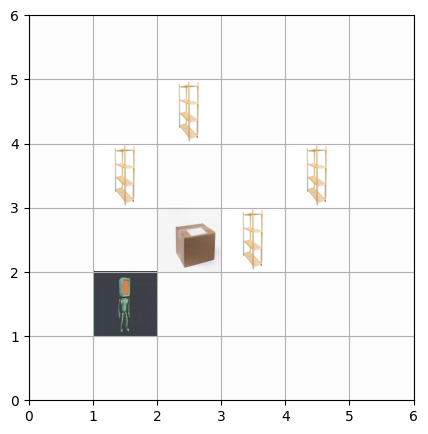

Step 2: Action = Right, Position=(2, 1), Carrying=False, Reward=-1


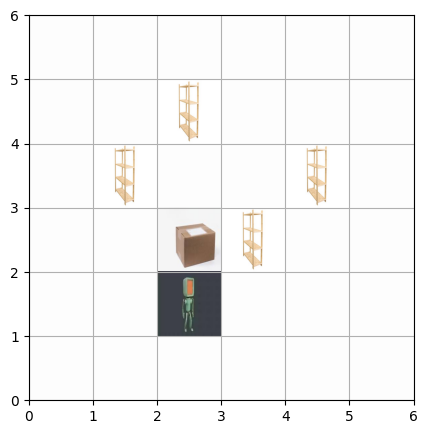

Step 3: Action = Up, Position=(2, 2), Carrying=False, Reward=-1


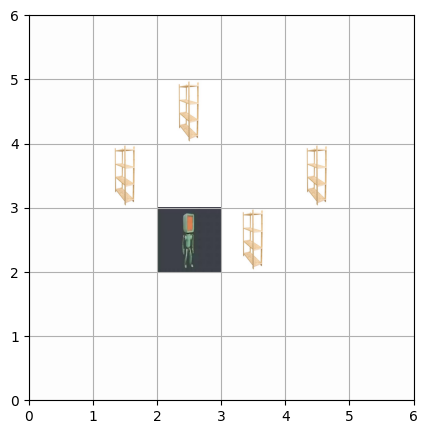

Step 4: Action = Pick-up, Position=(2, 2), Carrying=True, Reward=25


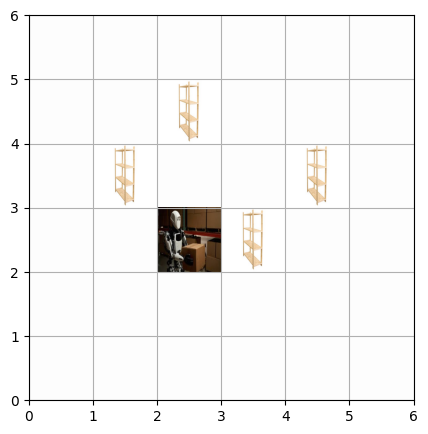

Step 5: Action = Up, Position=(2, 3), Carrying=True, Reward=-1


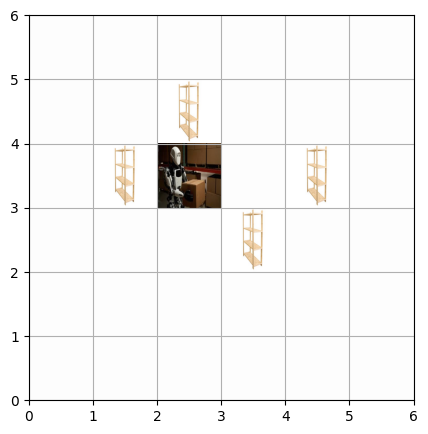

Step 6: Action = Right, Position=(3, 3), Carrying=True, Reward=-1


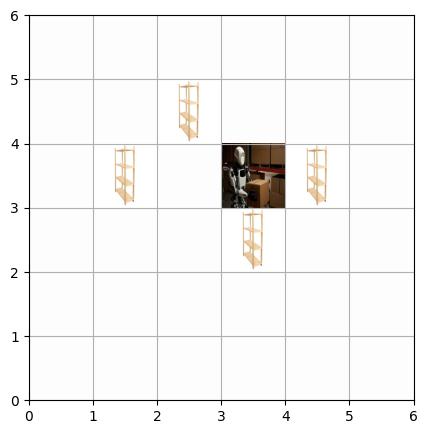

Step 7: Action = Up, Position=(3, 4), Carrying=True, Reward=-1


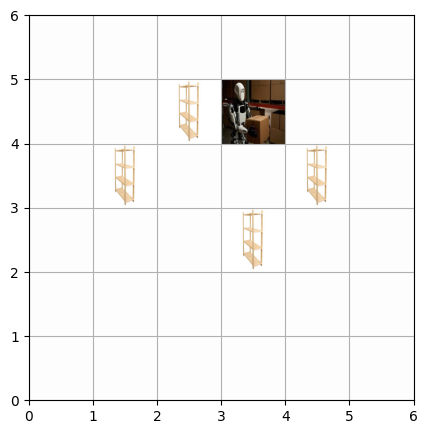

Step 8: Action = Up, Position=(3, 5), Carrying=True, Reward=-1


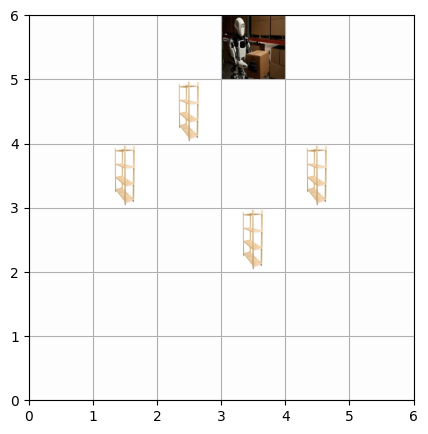

Step 9: Action = Right, Position=(4, 5), Carrying=True, Reward=-1


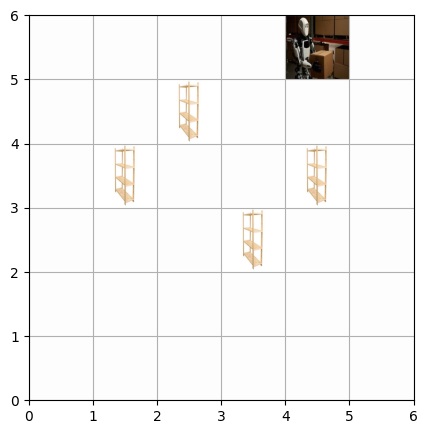

Step 10: Action = Right, Position=(5, 5), Carrying=True, Reward=-1


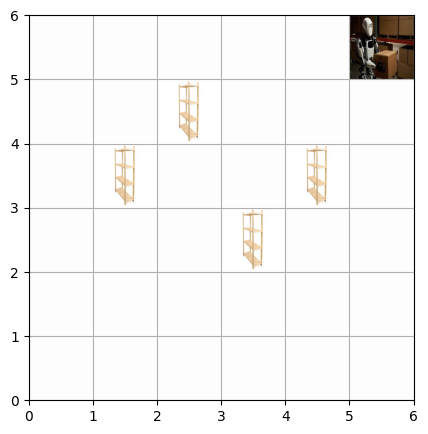

Step 11: Action = Drop-off, Position=(5, 5), Carrying=True, Reward=100


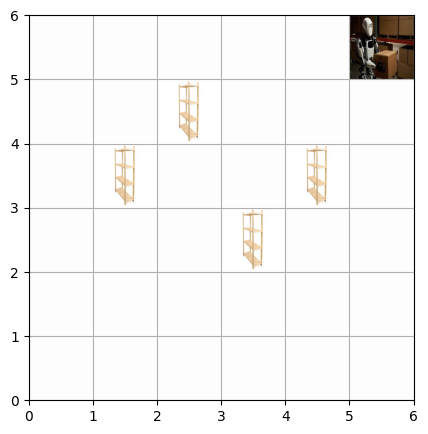

Episode 10: Task completed! Total Reward: 115


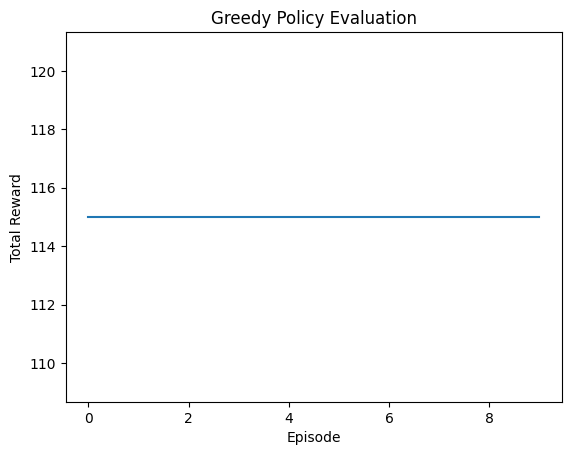

In [9]:
def test_agent(num_episodes=10):
    rewards_per_episode = []
    
    for episode in range(num_episodes):
        state, _ = environment.reset()
        state = tuple(state)  # Convert to tuple
        total_reward = 0
        done = False
        step = 0
        
        while not done:
            action = np.argmax(Q[state])
            next_state, reward, done, _, _ = environment.step(action)  # Unpack correctly
            next_state = tuple(next_state)  # Convert to tuple
            
            total_reward += reward
            print(f"Step {step}: Action = {mapped_actions[action]}, Position={next_state[:2]}, Carrying={bool(next_state[2])}, Reward={reward}")
            environment.render()
            
            state = next_state  # Update state
            step += 1
            
            if done:
                print(f"Episode {episode + 1}: Task completed! Total Reward: {total_reward}")
                break
        
        rewards_per_episode.append(total_reward)
    
    # Plot the total reward per episode during greedy evaluation
    plt.figure()
    plt.plot(rewards_per_episode)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Greedy Policy Evaluation')
    plt.show()

test_agent()


### Hyperparameter Tuning:

In [18]:
def initialize_q_table(environment):
    return defaultdict(lambda: np.zeros(environment.action_space.n))

def epsilon_greedy_policy(Q, state, epsilon, environment):
    if random.uniform(0, 1) < epsilon:
        return environment.action_space.sample()
    else:
        return np.argmax(Q[state])

def train_q_learning(environment, gamma, epsilon_decay, num_episodes=500, alpha=0.1, epsilon=1.0, epsilon_min=0.1):
    Q = initialize_q_table(environment)
    print("\nInitial Q-table (first 10 states):")
    for state in list(Q.keys())[:10]:
        print(f"{state}: {Q[state]}")

    rewards_per_episode = []
    epsilon_values = []
    
    for episode in range(num_episodes):
        state, _ = environment.reset()
        state = tuple(state)
        total_reward = 0
        done = False
        
        while not done:
            action = epsilon_greedy_policy(Q, state, epsilon, environment)
            next_state, reward, done, _, _ = environment.step(action)
            next_state = tuple(next_state)

            best_next_action = np.argmax(Q[next_state])
            Q[state][action] += alpha * (reward + gamma * Q[next_state][best_next_action] - Q[state][action])
            
            state = next_state
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
        epsilon_values.append(epsilon)
        epsilon = max(epsilon_min, epsilon * epsilon_decay)

    print("\nFinal Q-table (first 10 states):")
    for state in list(Q.keys())[:10]:
        print(f"{state}: {Q[state]}")
    
    return Q, rewards_per_episode, epsilon_values

In [19]:
def test_agent(environment, Q, num_episodes=10):
    rewards_per_episode = []
    
    for episode in range(num_episodes):
        state, _ = environment.reset()  # Fix: Unpacking reset() correctly
        state = tuple(state)  
        total_reward = 0
        done = False
        
        while not done:
            action = np.argmax(Q[state])
            next_state, reward, done, _, _ = environment.step(action)  # Fix: Handling step() correctly
            state = tuple(next_state)
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
    
    # Plot greedy evaluation results
    plt.figure()
    plt.plot(rewards_per_episode)
    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title("Greedy Policy Evaluation with Tuned Parameters")
    plt.show()

In [20]:
def evaluate_hyperparameters(trial):
    gamma = trial.suggest_float("gamma", 0.8, 0.99)
    epsilon_decay = trial.suggest_float("epsilon_decay", 0.95, 0.999)
    
    environment = Warehouse_robot()
    Q, rewards, epsilon_values = train_q_learning(environment, gamma, epsilon_decay)
    
    # Plot total reward per episode
    plt.figure()
    plt.plot(rewards)
    plt.xlabel("Episode")
    plt.ylabel("Total Reward")
    plt.title(f"Q-Learning Performance (gamma={gamma}, epsilon_decay={epsilon_decay})")
    plt.show()
    
    # Plot epsilon decay
    plt.figure()
    plt.plot(epsilon_values)
    plt.xlabel("Episode")
    plt.ylabel("Epsilon Value")
    plt.title(f"Epsilon Decay Over Episodes (gamma={gamma}, epsilon_decay={epsilon_decay})")
    plt.show()
    
    test_agent(environment, Q)
    
    return np.mean(rewards[-50:])  # Average reward over last 50 episodes

[I 2025-02-18 15:40:18,934] A new study created in memory with name: no-name-3e3cbc24-7963-4342-8a02-4609b8c8638d



Initial Q-table (first 10 states):

Final Q-table (first 10 states):
(0, 0, 0): [183.98126507  32.47072142  99.5514612  419.69517918 153.56066771
 206.03503671]
(0, 1, 0): [ -1.49480295  -0.98748572  18.03129589 254.5268194   -0.94407056
   8.84959175]
(0, 2, 0): [ -1.03538731  -1.25075365  -0.98696373 172.77506698  -1.08935424
  -1.1719557 ]
(0, 3, 0): [ -1.1086203   -1.11055681  -1.07633283 -17.53910355  -1.18718727
  -1.31185909]
(0, 4, 0): [-1.3123167  -0.66996751 -0.94012204 -0.98647706 -1.13413263 -0.67315717]
(1, 4, 0): [-17.41417248  -0.91415204  -0.80815538 -10.66231111  -1.21737933
  -0.75081872]
(1, 5, 0): [-0.94687304 -0.99794301 -0.99604616 -0.95488294 -0.96179806 -0.99041675]
(2, 5, 0): [-16.90901672  -0.88730526  -0.90063608  -0.93028894  -0.70741937
  -0.8167381 ]
(0, 5, 0): [-0.80471856 -1.05922044 -0.7444813  -0.93776022 -0.75944637 -1.12102479]
(1, 2, 0): [277.43705966 172.51540867  33.92825417 559.54296376 255.33004264
 245.20198689]


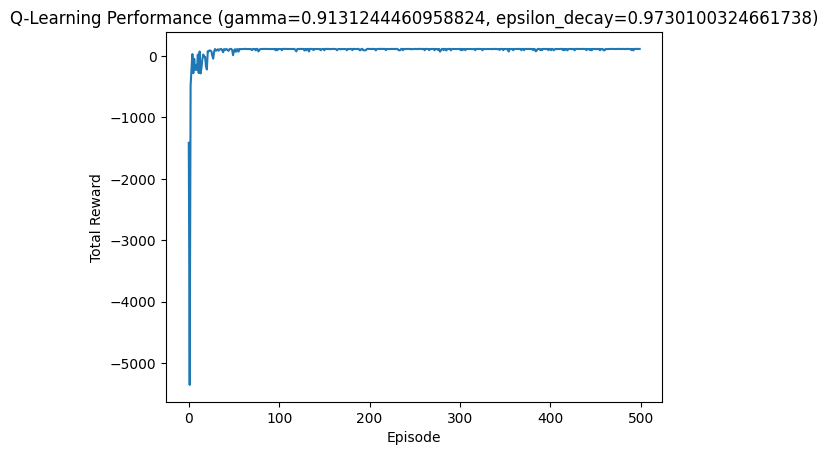

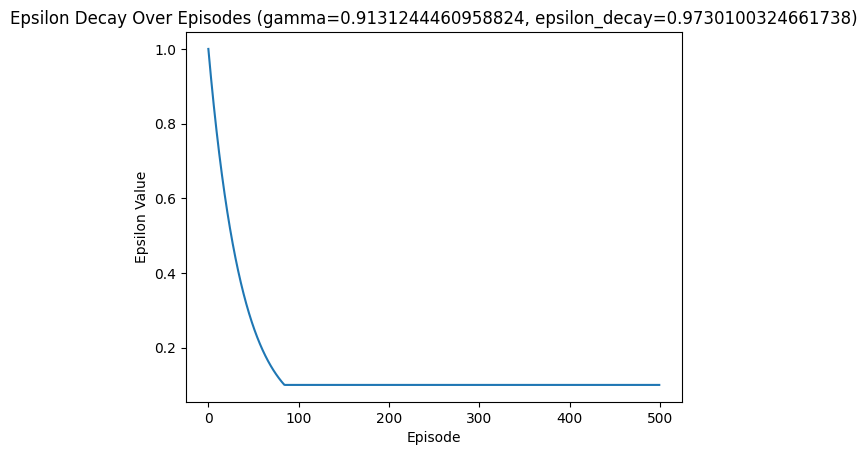

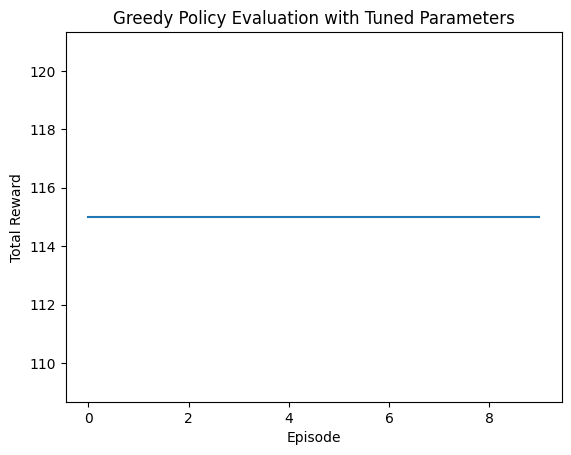

[I 2025-02-18 15:40:19,617] Trial 0 finished with value: 111.8 and parameters: {'gamma': 0.9131244460958824, 'epsilon_decay': 0.9730100324661738}. Best is trial 0 with value: 111.8.



Initial Q-table (first 10 states):

Final Q-table (first 10 states):
(0, 0, 0): [ 80.2309576   51.12834539  27.6666265  192.36057428  57.36305826
  76.93546451]
(1, 0, 0): [ 97.71087978 221.15942838  38.95301042  65.87399362  92.32455295
  79.98394746]
(2, 0, 0): [ -0.39472293 196.65959588  -0.63498898  -0.91956403  15.40810001
  -0.50733103]
(3, 0, 0): [-0.88187089 -0.5228964  -0.74582465 -1.05228052 -1.09994561 -1.01720851]
(3, 1, 0): [ -0.44849419  -3.56991738 128.30436071  -0.96861504  -0.2955046
  -0.28762812]
(4, 1, 0): [-1.10029255 -0.71693025  6.59401162 -0.92751949 -0.9031849  -0.65058182]
(4, 0, 0): [-1.00870117 -0.71941537 -0.93200036 -1.06849257 -1.0598076  -0.95729472]
(5, 1, 0): [-0.75113848 -1.20420078 -0.80378403 -0.99743193 -0.96973403 -1.08073016]
(5, 0, 0): [-0.91646253 -0.99474324 -0.99722657 -1.29737644 -0.85426699 -0.93309343]
(5, 2, 0): [-1.01223693 -1.20068125 -1.11020638 -1.30490289 -1.39452139 -1.34223778]


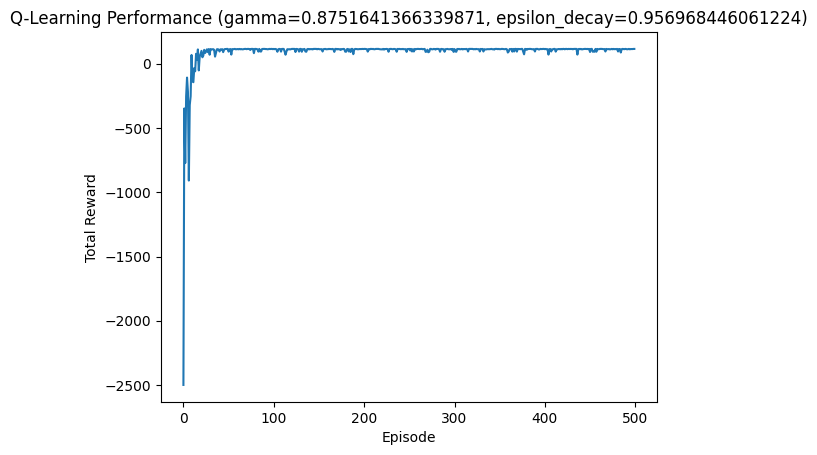

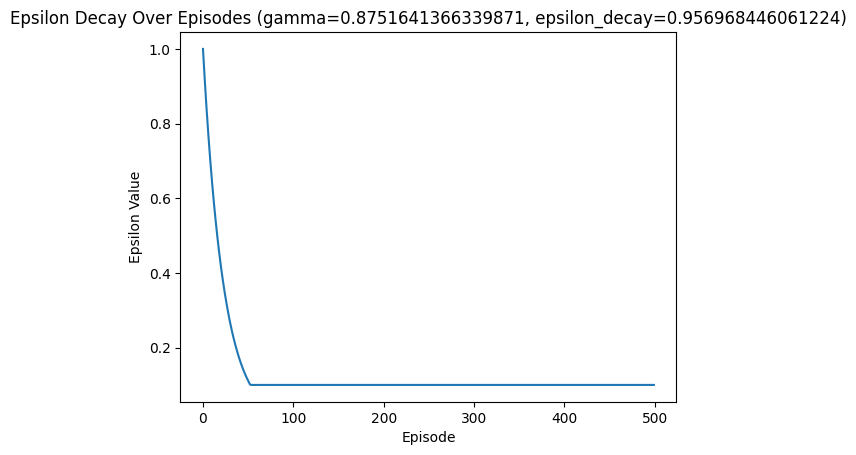

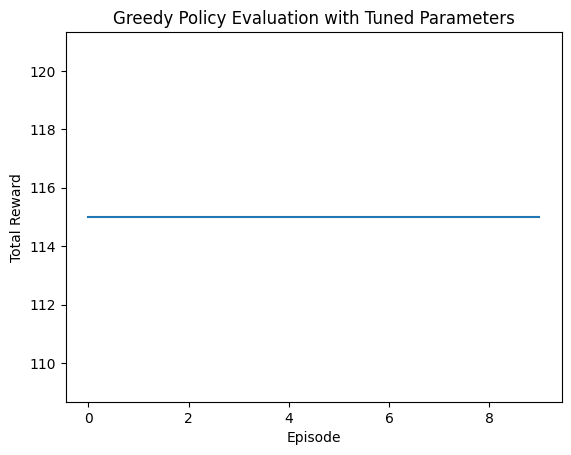

[I 2025-02-18 15:40:20,307] Trial 1 finished with value: 110.5 and parameters: {'gamma': 0.8751641366339871, 'epsilon_decay': 0.956968446061224}. Best is trial 0 with value: 111.8.



Initial Q-table (first 10 states):

Final Q-table (first 10 states):
(1, 0, 0): [-7.50652579e-01  1.72173570e+03 -1.25519898e+00 -8.10585290e-02
 -5.79103096e-01 -6.49705195e-01]
(0, 0, 0): [1548.0456546  2847.51127063 1070.83717     415.80640442  824.07983133
 1071.35246384]
(0, 1, 0): [ 984.19652538  150.85816099 1238.25416255 2944.89627666  837.90740625
 1214.94857659]
(0, 2, 0): [-3.06512856e-01 -6.12087697e-01  9.04477671e-02  7.31406400e+02
  2.08071916e+01 -5.20481435e-01]
(0, 3, 0): [ 0.10744876 -0.85401204 -0.42831009 -6.91372018 -0.49340263 -0.35379479]
(0, 4, 0): [-0.66450683 -0.60237774 -0.49797196 -0.62048104 -0.60160171 -0.67154254]
(0, 5, 0): [-0.67486154 -0.68257017 -0.74982961 -0.70717004 -0.66923044 -0.85410462]
(1, 4, 0): [-5.48248144 -0.82182264 -0.61808709 -9.48667993 -0.46045825 -0.5857382 ]
(1, 5, 0): [-0.72807944 -0.62372227 -0.69435815 -0.7049895  -0.64653589 -0.77326882]
(2, 5, 0): [-2.         -0.62048104 -0.82249429 -0.36270009 -0.28980009 -0.35379479]


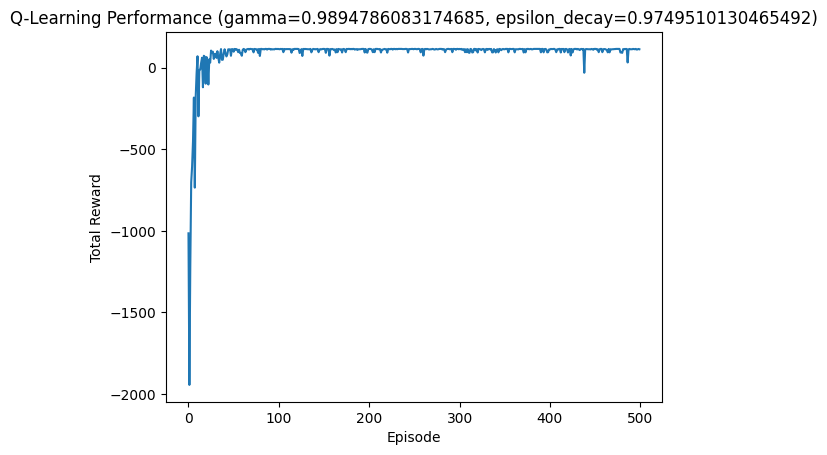

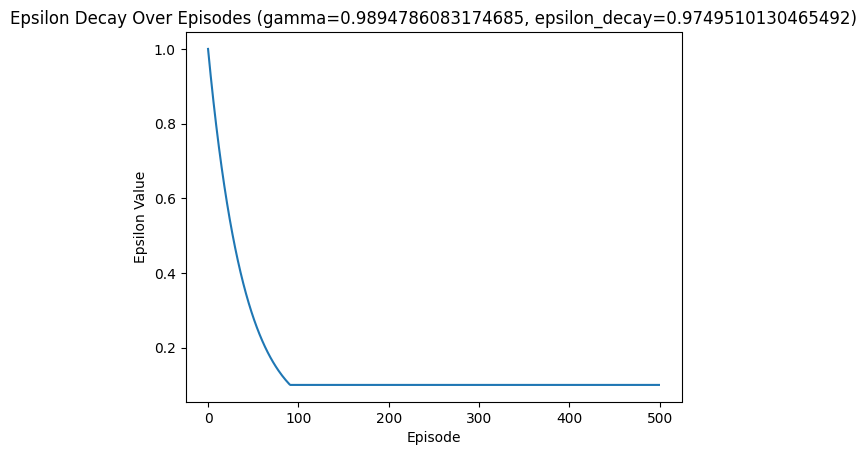

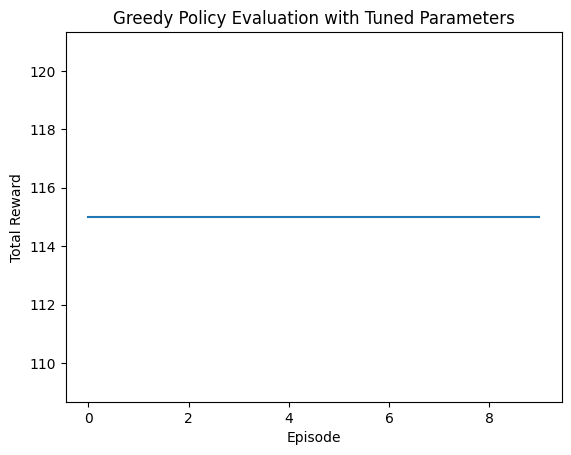

[I 2025-02-18 15:40:20,962] Trial 2 finished with value: 109.18 and parameters: {'gamma': 0.9894786083174685, 'epsilon_decay': 0.9749510130465492}. Best is trial 0 with value: 111.8.



Initial Q-table (first 10 states):

Final Q-table (first 10 states):
(0, 0, 0): [194.24065836  20.13720489 179.30249791 399.42071436 154.73254784
 219.95051365]
(0, 1, 0): [ -1.65892119  -1.18028204   0.7818934  110.57983458  -1.14874563
   6.30353427]
(1, 0, 0): [169.76778553  75.14419572 239.29650877 440.78224623 231.93982422
 227.45816126]
(1, 1, 0): [ 3.46840863e+01  1.58353559e+00 -1.15902748e+00  3.91029723e+02
  3.21352512e-02  2.66499040e+00]
(1, 2, 0): [  0.27347714 -10.7331654   -0.33233665 121.5660131    1.51980286
   2.52498195]
(2, 2, 0): [151.82998396  54.5203453   15.99291072 277.28567109 591.00029928
 249.56432199]
(2, 3, 0): [228.20577231 -14.49798427 -12.64217748  -0.89603273   1.62017328
  -0.79819682]
(3, 3, 0): [-11.46329683  -1.02720712  -0.12945597 -13.15436074  -0.57029925
  -0.71010045]
(3, 4, 0): [ -0.78693473  -0.80712797 -16.97061767  -0.93624753  -1.21807947
  -1.0374633 ]
(3, 5, 0): [-0.80196592 -0.86136565 -0.75050565 -0.81088632 -0.76480364 -0.73068683]

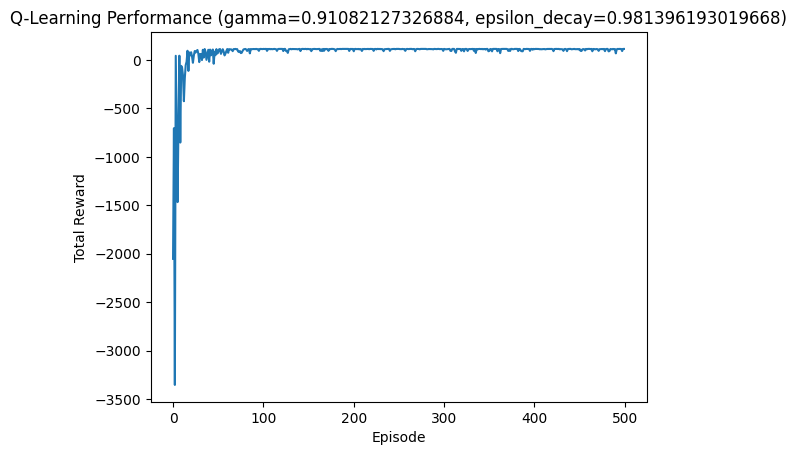

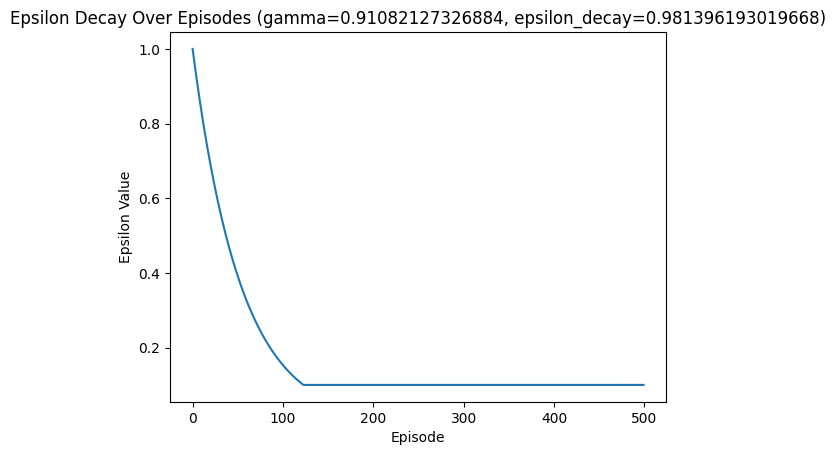

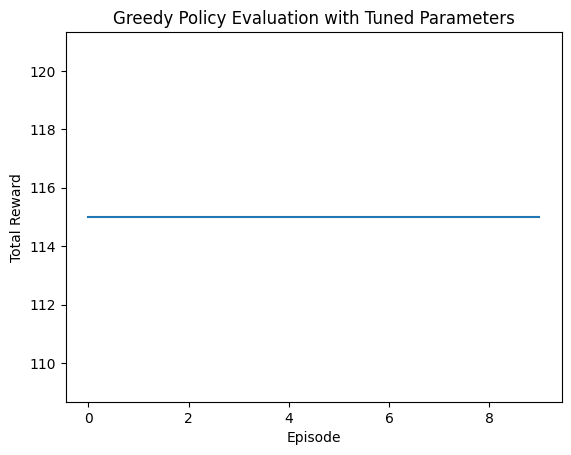

[I 2025-02-18 15:40:21,679] Trial 3 finished with value: 109.04 and parameters: {'gamma': 0.91082127326884, 'epsilon_decay': 0.981396193019668}. Best is trial 0 with value: 111.8.



Initial Q-table (first 10 states):

Final Q-table (first 10 states):
(1, 0, 0): [122.93513217  15.42100361  49.12150503 252.25314269  80.27254753
  65.21876522]
(0, 0, 0): [ 91.46215932  -0.57094036  83.72672241 221.28374284  45.04024166
  93.93545445]
(1, 1, 0): [ -0.86929048 129.05142015  -1.22426177  53.63649669  -1.1005578
  -0.46290815]
(0, 1, 0): [-1.37056301 -1.28187992 -1.46528481  9.73579052 -1.52658466 -1.56449539]
(1, 2, 0): [-9.47580043e-01 -1.44258720e+01 -8.92532013e-01  2.84878813e+02
  3.26489563e-02 -7.97112186e-01]
(0, 2, 0): [-1.15860998 -1.01360609 -1.11178592  1.02241564 -1.15556391 -1.27744661]
(2, 2, 0): [ 98.9256894   57.87243792 113.8467914  149.22046516 372.22647137
 130.72167812]
(2, 3, 0): [187.66688514 -17.68617373 -17.93760005  -0.93767063  -1.26704862
  -1.23312463]
(2, 1, 0): [132.88866347 327.11836489  35.50793035  34.60365567  18.89972697
  98.97916264]
(3, 3, 0): [-14.65353312  -1.03833565  -0.95008284 -10.6149839   -0.85407227
  -0.82036874]


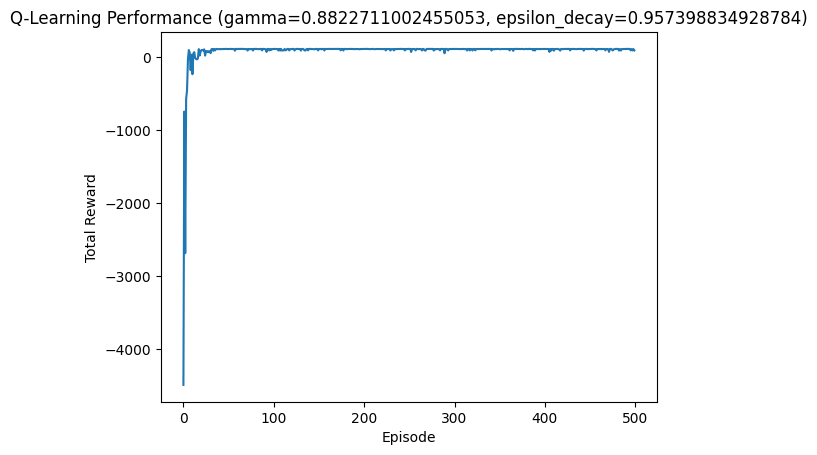

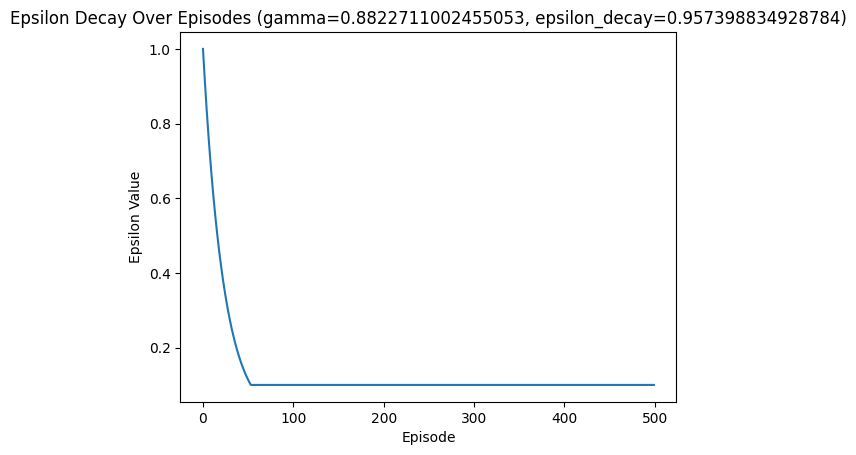

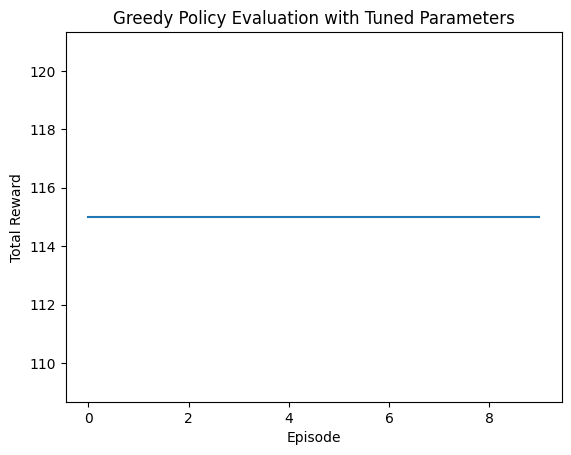

[I 2025-02-18 15:40:22,359] Trial 4 finished with value: 109.68 and parameters: {'gamma': 0.8822711002455053, 'epsilon_decay': 0.957398834928784}. Best is trial 0 with value: 111.8.



Initial Q-table (first 10 states):

Final Q-table (first 10 states):
(0, 0, 0): [353.21541367 521.60199403 324.79942923 307.75976365 365.08334865
 309.2370161 ]
(0, 1, 0): [394.36999312 306.66643256 389.6254513  568.40728046 379.61874282
 393.947513  ]
(1, 0, 0): [ 49.33049079 144.79051657 125.19064821 457.0974826  168.61830473
 123.57729046]
(1, 1, 0): [263.27934609 376.61853547 381.30438629 619.26983413 442.33479313
 433.38665055]
(1, 2, 0): [239.68986875 119.42326611 150.05440409 621.95014542 223.87531592
 228.27782963]
(2, 2, 0): [445.71780484 266.48397681 424.18901322 519.52670159 734.16856576
 503.55931822]
(2, 1, 0): [372.05177809 674.51114446 467.34595894 304.44642364 517.40894046
 522.94395147]
(3, 1, 0): [ 50.65834313  39.56899987 474.23735422  17.02778826  42.32665089
 113.41102959]
(3, 0, 0): [ 57.05365661  25.18764868 276.50682596   4.03781459  22.14962847
  20.67837997]
(2, 2, 1): [394.17979045 770.64280943 422.05100628 436.76135158 610.22648324
 603.27042119]


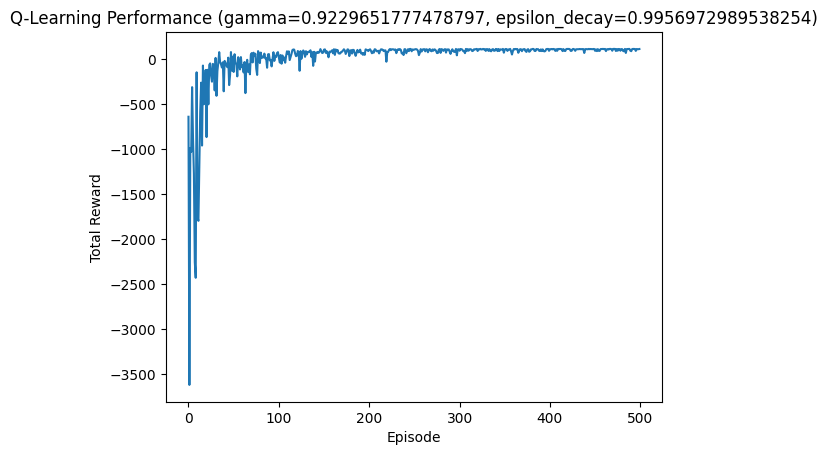

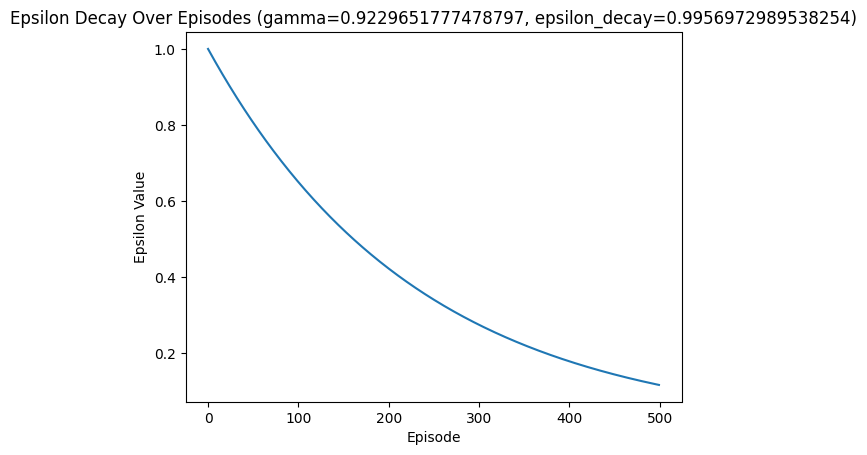

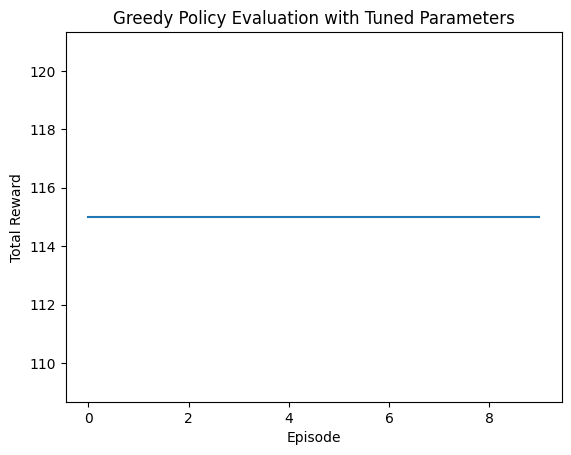

[I 2025-02-18 15:40:23,228] Trial 5 finished with value: 106.84 and parameters: {'gamma': 0.9229651777478797, 'epsilon_decay': 0.9956972989538254}. Best is trial 0 with value: 111.8.


Best hyperparameters: {'gamma': 0.9131244460958824, 'epsilon_decay': 0.9730100324661738}

Initial Q-table (first 10 states):

Final Q-table (first 10 states):
(0, 0, 0): [128.18212889  86.23043369 199.95695825 419.46812894 223.02771817
 157.59568461]
(0, 1, 0): [-8.15016897e-01 -2.11007588e-01 -3.52896811e-01  3.16431575e+02
 -7.53481565e-01 -6.97092792e-01]
(1, 1, 0): [246.49415167 508.51727496  79.71028132 135.80075102 234.57752695
 243.11453526]
(1, 2, 0): [213.65772383 317.41756541  15.83636315 559.53342099 256.10828339
 238.97825767]
(0, 2, 0): [ 11.8037982   -0.50901327  -0.40873154 132.99976353   3.55161876
  -0.61111714]
(1, 0, 0): [171.96478547 461.92903191 173.78204999  13.2470345  173.73772525
 169.68433233]
(2, 0, 0): [ -0.53211396 109.41993413  -0.69177583  -0.94305332  -0.50187932
  -0.43014966]
(2, 1, 0): [-6.01752760e-01  4.65536980e+02  5.69712435e-01  4.32328478e-01
  5.07127521e+00  4.03323910e+00]
(2, 2, 0): [167.74721055 129.5041089  259.99206884 259.98947183 615.1

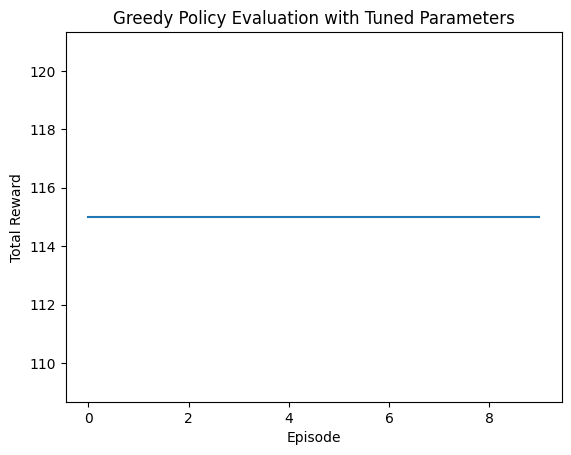

In [21]:
# Hyperparameter tuning with Optuna
study = optuna.create_study(direction="maximize")
study.optimize(evaluate_hyperparameters, n_trials=6)

# Best hyperparameters
best_params = study.best_params
print("Best hyperparameters:", best_params)

# Train with best hyperparameters
environment = Warehouse_robot()
Q, rewards, epsilon_values = train_q_learning(environment, best_params["gamma"], best_params["epsilon_decay"])

# Save the best Q-table
with open("q_table_tuned.pkl", "wb") as f:
    pickle.dump(dict(Q), f)
print("Tuned Q-table saved as q_table_tuned.pkl")

test_agent(environment, Q)

### Stochastic environment:

In [27]:
env = Stochastic_warehouse()
# Hyperparameters
gamma = 0.9  # Discount factor
alpha = 0.1  # Learning rate
epsilon = 0.1  # Exploration rate
num_episodes = 500  # Number of training episodes

# Initialize Q-table
Q = defaultdict(lambda: np.zeros(env.action_space.n))

print("Initial Q-table:")
print(dict(Q))

def epsilon_greedy_policy(state, epsilon):
    """Choose an action using epsilon-greedy policy."""
    if random.uniform(0, 1) < epsilon:
        return env.action_space.sample()  # Explore
    else:
        return np.argmax(Q[state])  # Exploit best-known action

def train_q_learning():
    """Train the agent using Q-learning."""
    rewards_per_episode = []
    epsilon_values = []
    
    for episode in range(num_episodes):
        state, _ = env.reset()  # ✅ Unpack properly
        state = tuple(state)  # Ensure state is a tuple
        
        total_reward = 0
        done = False
        truncated = False
        
        while not (done or truncated):  # ✅ Consider both termination and truncation
            action = epsilon_greedy_policy(state, epsilon)
            next_state, reward, done, truncated, _ = env.step(action)  # ✅ Correct unpacking
            next_state = tuple(next_state)  # Convert next_state to tuple
            
            # Update Q-table using the Bellman equation
            best_next_action = np.argmax(Q[next_state])
            Q[state][action] += alpha * (reward + gamma * Q[next_state][best_next_action] - Q[state][action])
            
            state = next_state
            total_reward += reward
        
        rewards_per_episode.append(total_reward)
        epsilon_values.append(epsilon)
        if (episode + 1) % 50 == 0:
            print(f"Episode {episode + 1}, Total Reward: {total_reward}")
    
    return rewards_per_episode, epsilon_values


rewards, epsilon_values = train_q_learning()

print("Trained Q-table:")
print(dict(Q))

# Save the Q-table as a pickle file
with open("q_table_stochastic.pkl", "wb") as f:
    pickle.dump(dict(Q), f)

print("Q-table saved as q_table_stochastic.pkl")

Initial Q-table:
{}
Episode 50, Total Reward: 108
Episode 100, Total Reward: 111
Episode 150, Total Reward: 111
Episode 200, Total Reward: 106
Episode 250, Total Reward: 108
Episode 300, Total Reward: 110
Episode 350, Total Reward: 111
Episode 400, Total Reward: 112
Episode 450, Total Reward: 111
Episode 500, Total Reward: 109
Trained Q-table:
{(0, 0, 0): array([ 90.53969866,  95.35448542,  24.11838117, 232.83008462,
        97.55909906,  33.23932231]), (0, 1, 0): array([ -0.80551213,  -0.70438124,  -0.76407973, 180.78576467,
        -0.77255306,  -0.77255306]), (1, 0, 0): array([109.82406275, 263.25741405,  26.39541579,  19.48656372,
       112.12592177,  84.13112951]), (2, 0, 0): array([-0.29701   , 66.75509855, -0.20791   , -0.28      , -0.29701   ,
       -0.29701   ]), (2, 1, 0): array([-1.90000000e-01,  2.32232226e+02, -1.09000000e-01,  8.56722214e-01,
       -1.57900025e-01,  2.81012868e+01]), (1, 1, 0): array([ 59.5797525 , 296.05259015,  39.23655731,  38.95439894,
       113.8

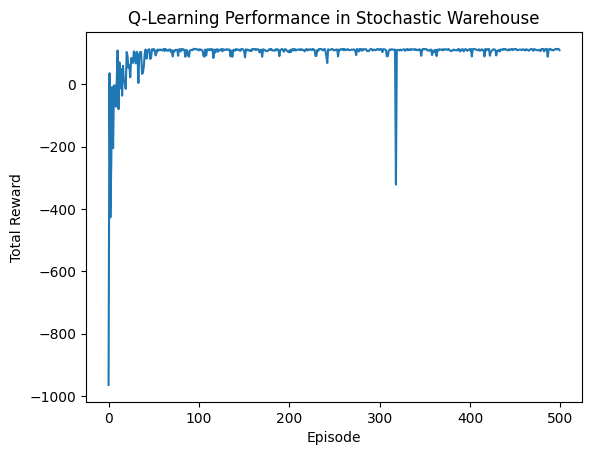

In [28]:
# Plot the total reward per episode
plt.figure()
plt.plot(rewards)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Q-Learning Performance in Stochastic Warehouse')
plt.show()

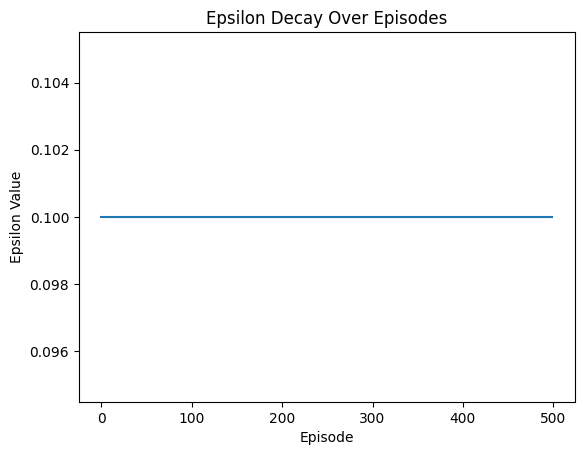

In [29]:
# Plot the epsilon decay
plt.figure()
plt.plot(epsilon_values)
plt.xlabel('Episode')
plt.ylabel('Epsilon Value')
plt.title('Epsilon Decay Over Episodes')
plt.show()

Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


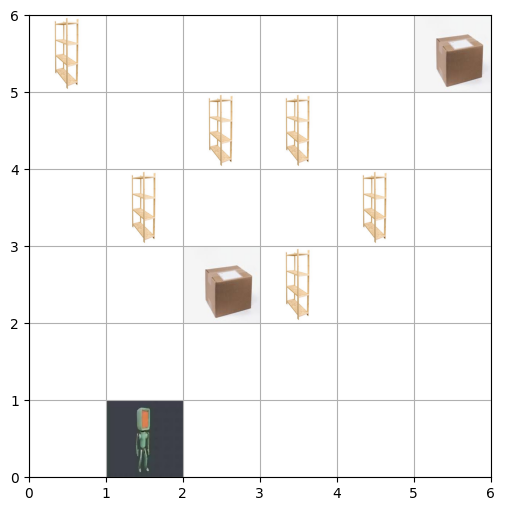

Step 1: Action=1, Position=(1, 1), Carrying=False, Reward=-1


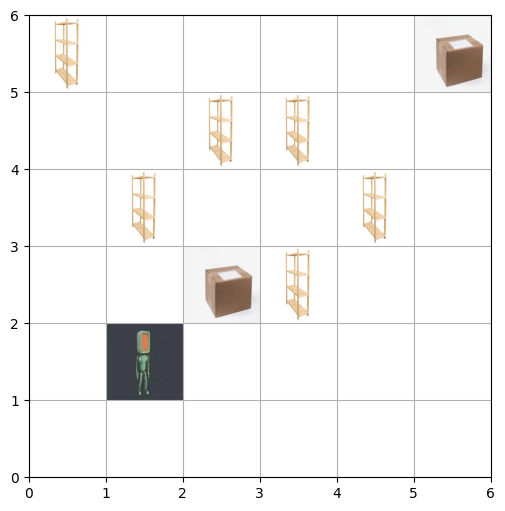

Step 2: Action=1, Position=(1, 2), Carrying=False, Reward=-1


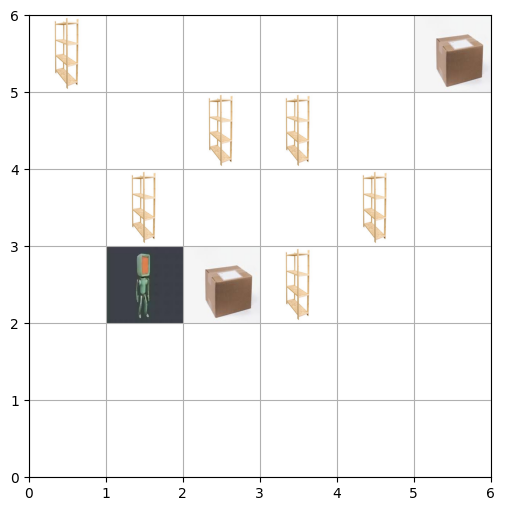

Step 3: Action=3, Position=(2, 2), Carrying=False, Reward=-1


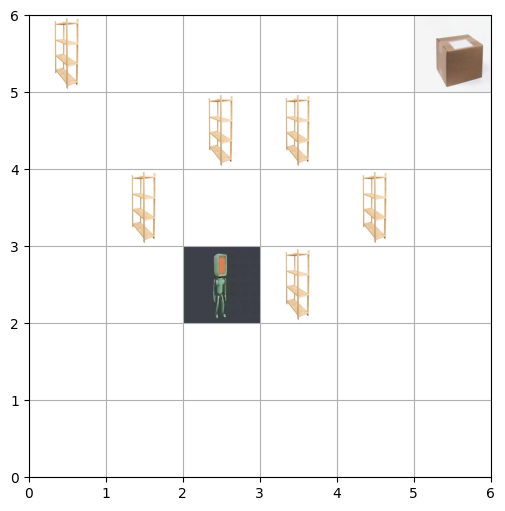

Step 4: Action=4, Position=(2, 2), Carrying=True, Reward=25


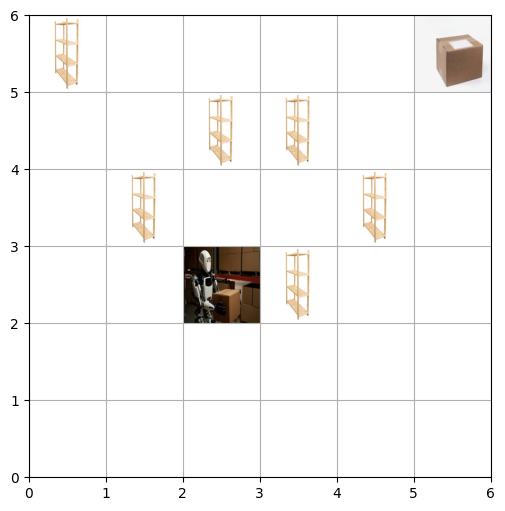

Step 5: Action=0, Position=(2, 1), Carrying=True, Reward=-1


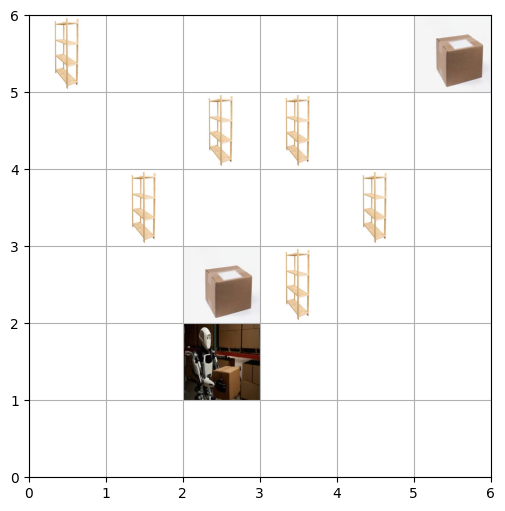

Step 6: Action=3, Position=(3, 1), Carrying=True, Reward=-1


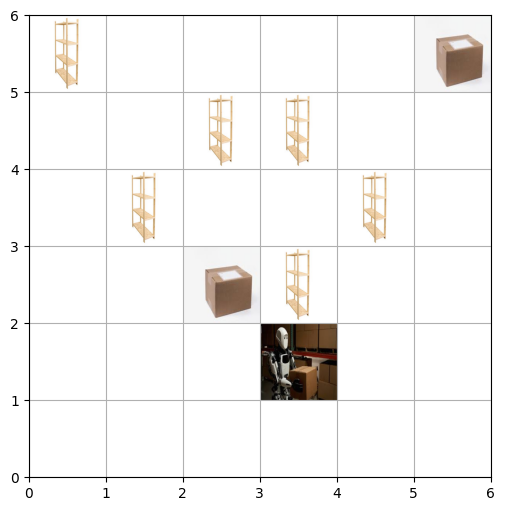

Step 7: Action=3, Position=(4, 1), Carrying=True, Reward=-1


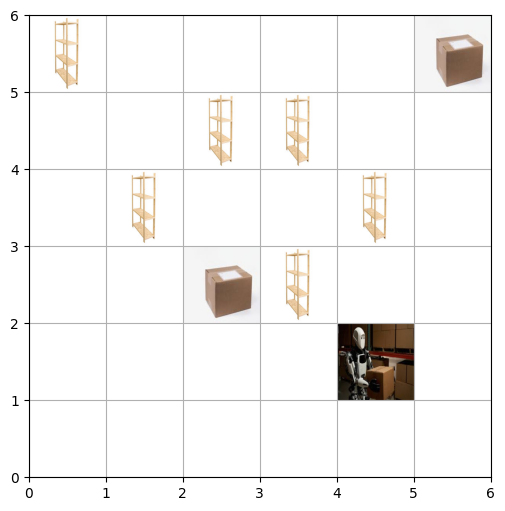

Step 8: Action=3, Position=(5, 1), Carrying=True, Reward=-1


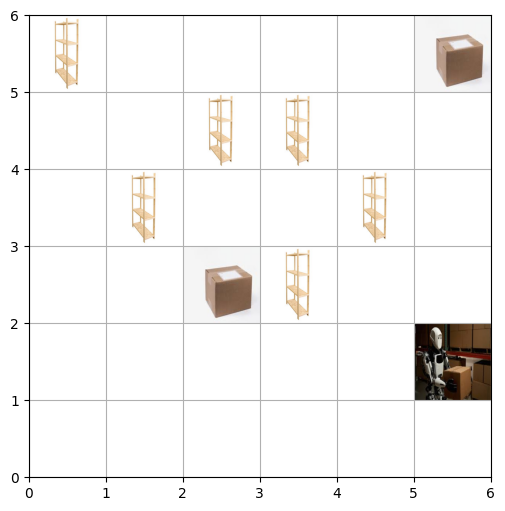

Step 9: Action=1, Position=(5, 2), Carrying=True, Reward=-1


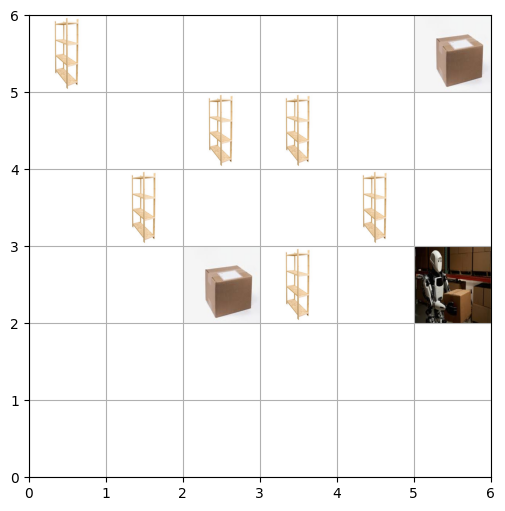

Step 10: Action=1, Position=(5, 3), Carrying=True, Reward=-1


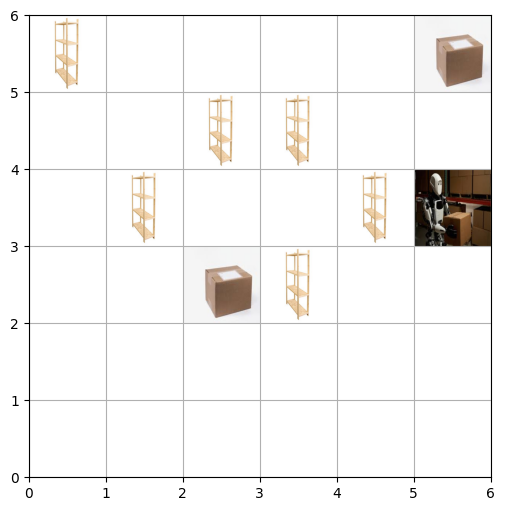

Step 11: Action=1, Position=(5, 4), Carrying=True, Reward=-1


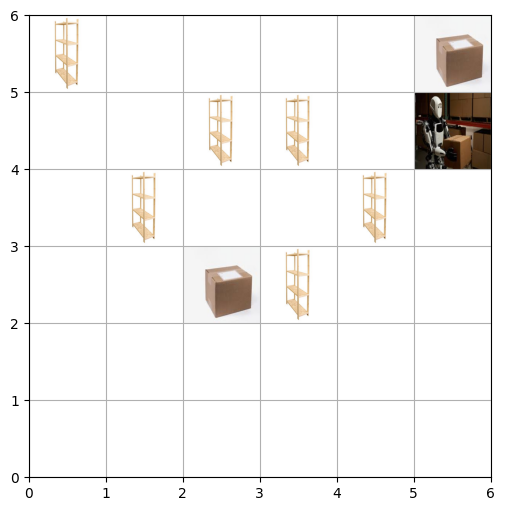

Step 12: Action=1, Position=(5, 5), Carrying=True, Reward=-1


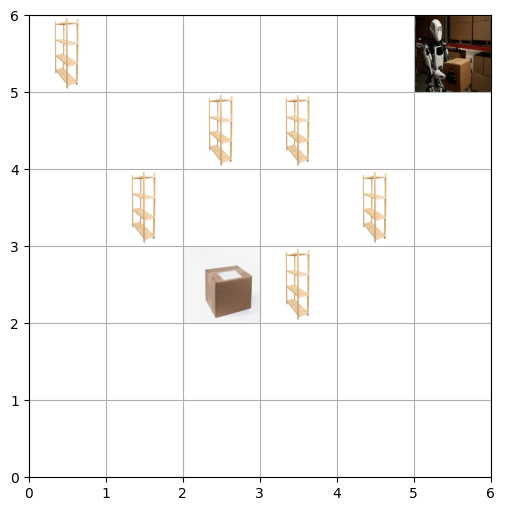

Step 13: Action=5, Position=(5, 5), Carrying=True, Reward=100


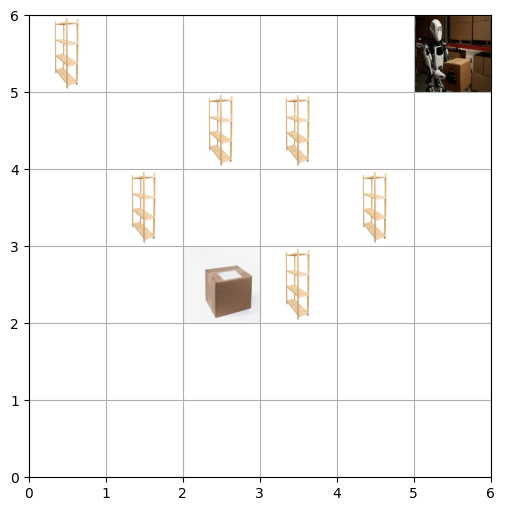

Episode 1: Task completed! Total Reward: 113
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


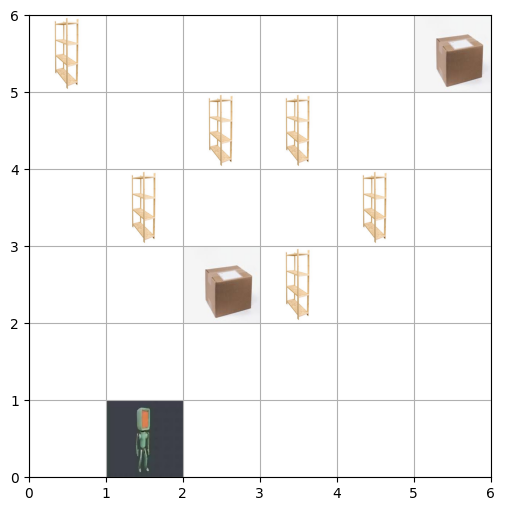

Step 1: Action=1, Position=(1, 1), Carrying=False, Reward=-1


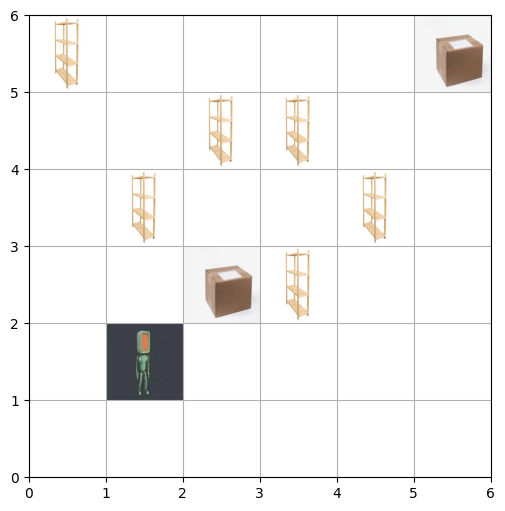

Step 2: Action=1, Position=(1, 2), Carrying=False, Reward=-1


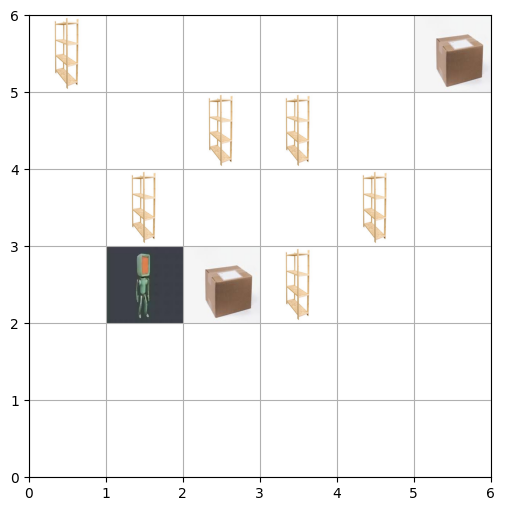

Step 3: Action=3, Position=(2, 2), Carrying=False, Reward=-1


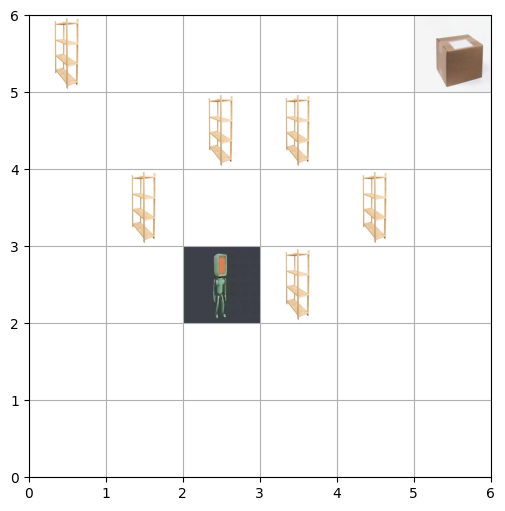

Step 4: Action=4, Position=(2, 2), Carrying=True, Reward=25


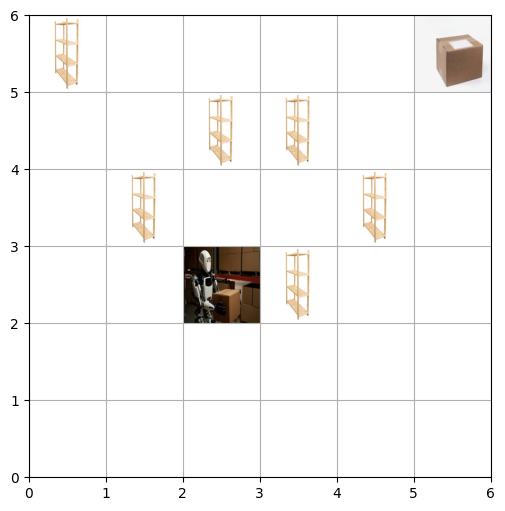

Step 5: Action=0, Position=(2, 1), Carrying=True, Reward=-1


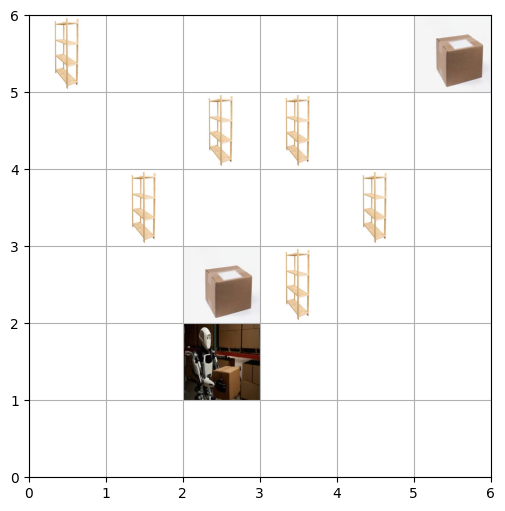

Step 6: Action=3, Position=(3, 1), Carrying=True, Reward=-1


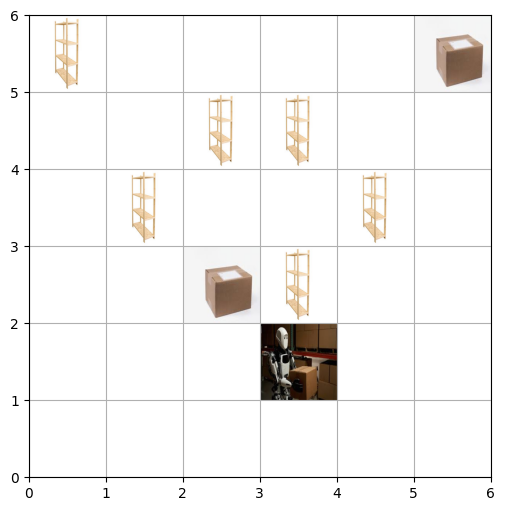

Step 7: Action=3, Position=(4, 1), Carrying=True, Reward=-1


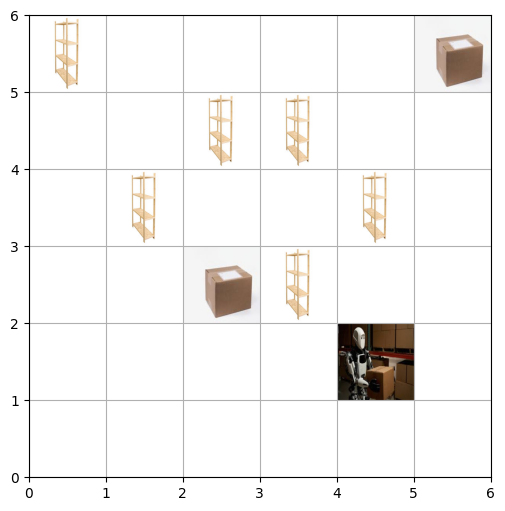

Step 8: Action=3, Position=(5, 1), Carrying=True, Reward=-1


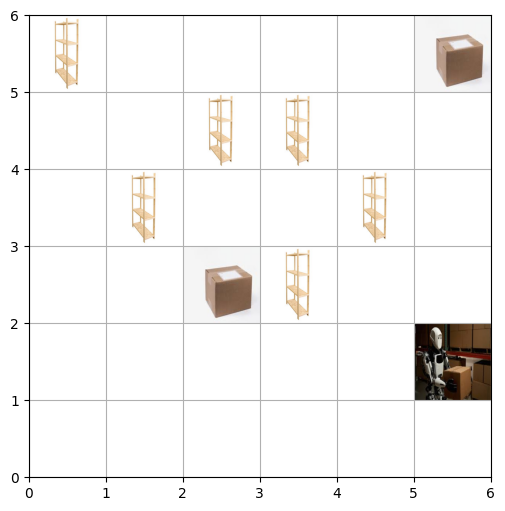

Step 9: Action=1, Position=(5, 2), Carrying=True, Reward=-1


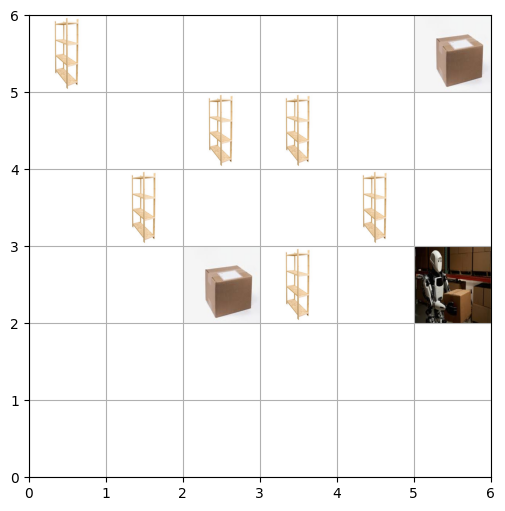

Step 10: Action=1, Position=(5, 3), Carrying=True, Reward=-1


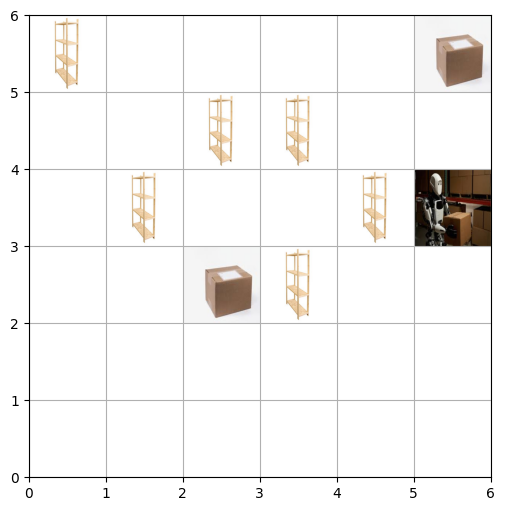

Step 11: Action=1, Position=(5, 4), Carrying=True, Reward=-1


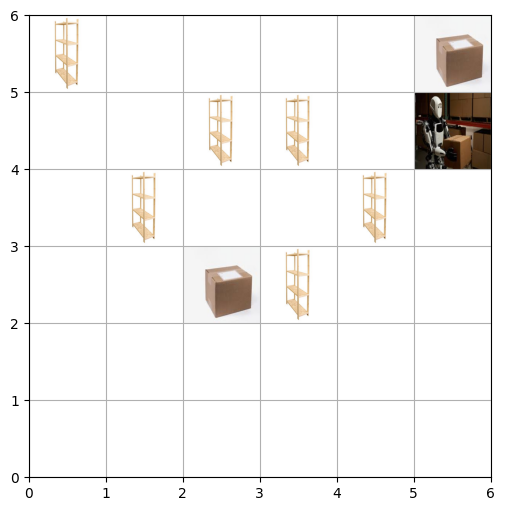

Step 12: Action=1, Position=(5, 5), Carrying=True, Reward=-1


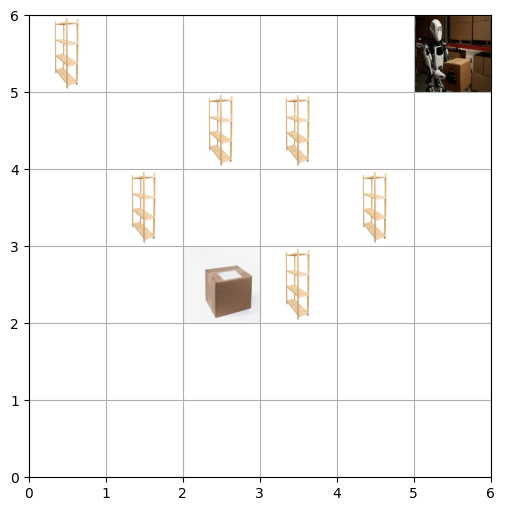

Step 13: Action=5, Position=(5, 5), Carrying=True, Reward=100


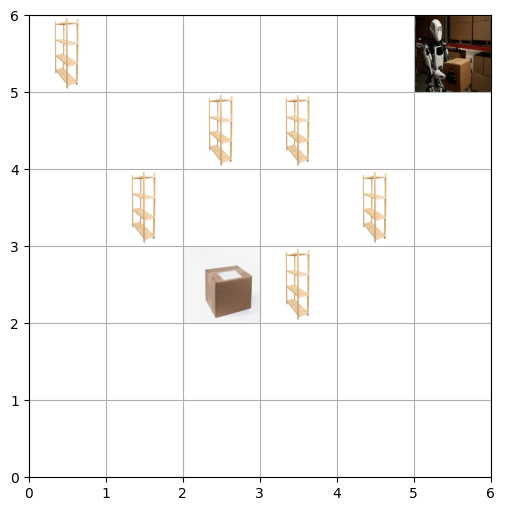

Episode 2: Task completed! Total Reward: 113
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


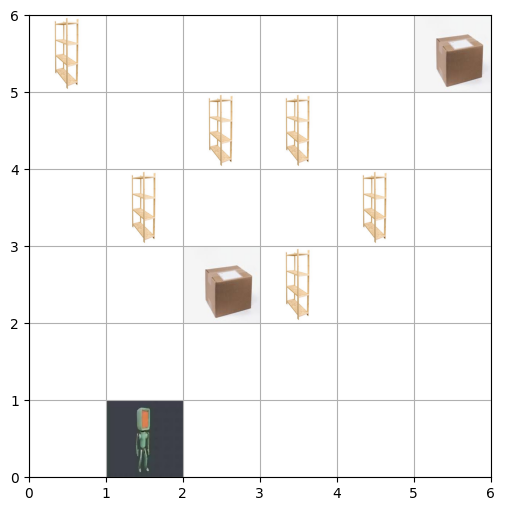

Step 1: Action=1, Position=(1, 1), Carrying=False, Reward=-1


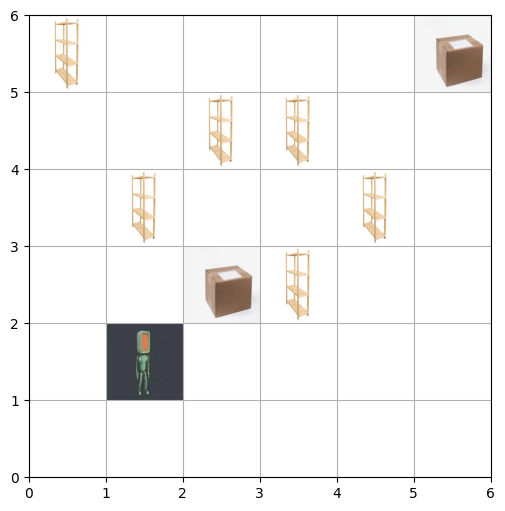

Step 2: Action=1, Position=(1, 2), Carrying=False, Reward=-1


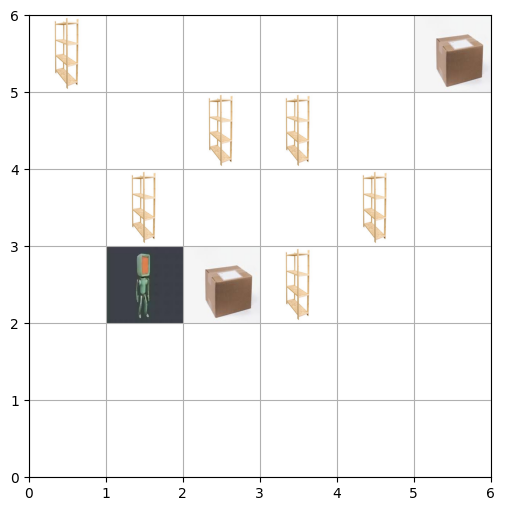

Step 3: Action=3, Position=(2, 2), Carrying=False, Reward=-1


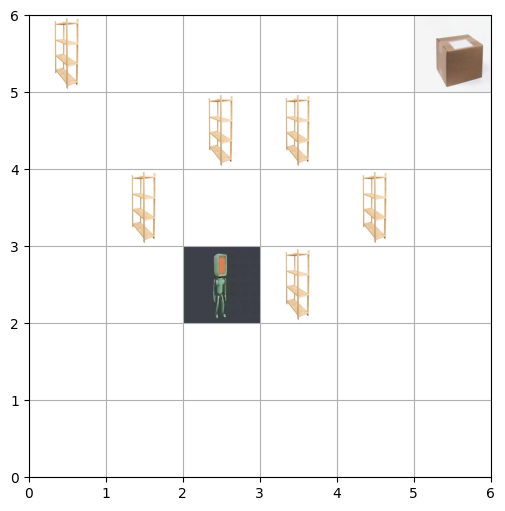

Step 4: Action=4, Position=(2, 2), Carrying=True, Reward=25


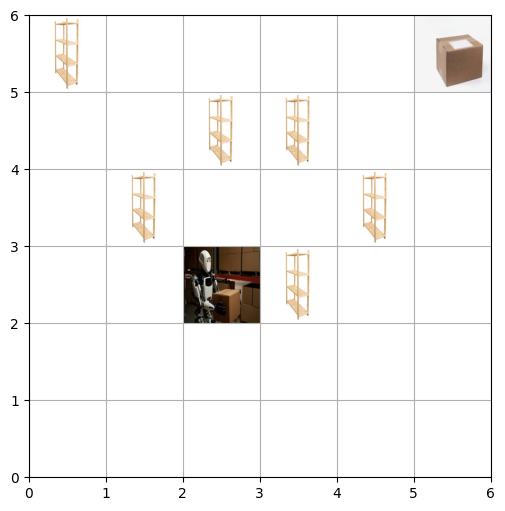

Step 5: Action=0, Position=(2, 1), Carrying=True, Reward=-1


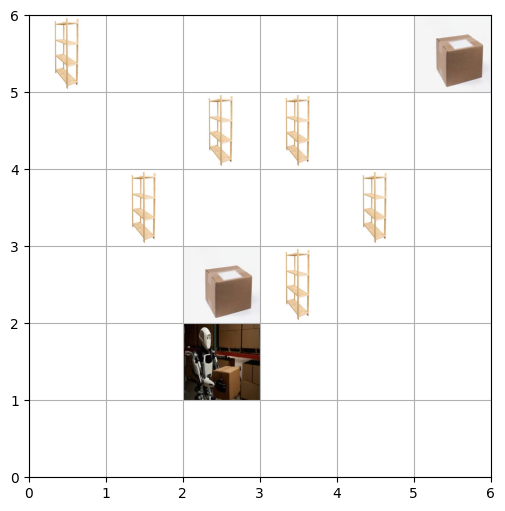

Step 6: Action=3, Position=(3, 1), Carrying=True, Reward=-1


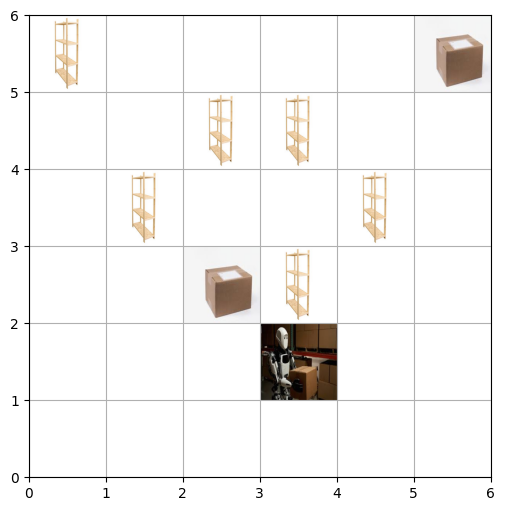

Step 7: Action=3, Position=(4, 1), Carrying=True, Reward=-1


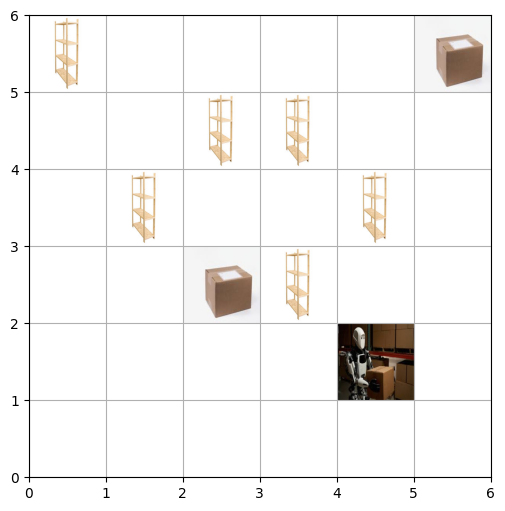

Step 8: Action=3, Position=(5, 1), Carrying=True, Reward=-1


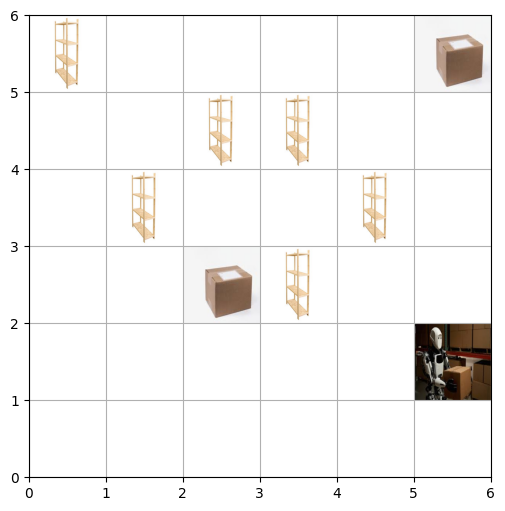

Step 9: Action=1, Position=(5, 2), Carrying=True, Reward=-1


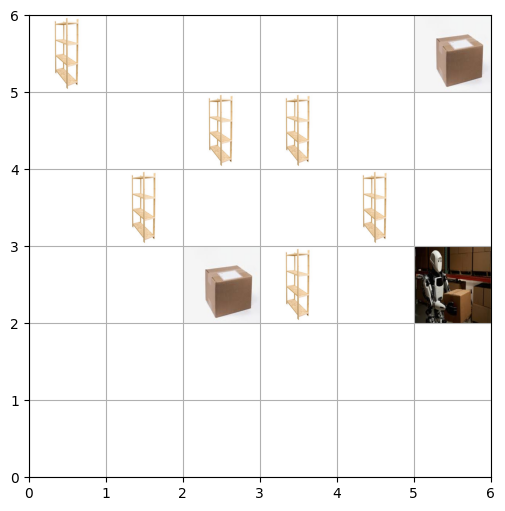

Step 10: Action=1, Position=(5, 2), Carrying=True, Reward=-1


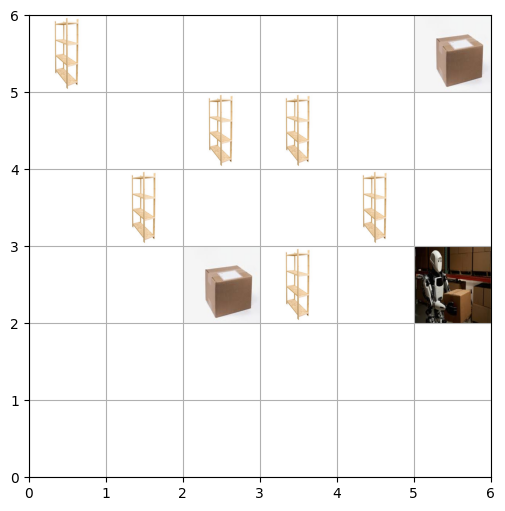

Step 11: Action=1, Position=(5, 3), Carrying=True, Reward=-1


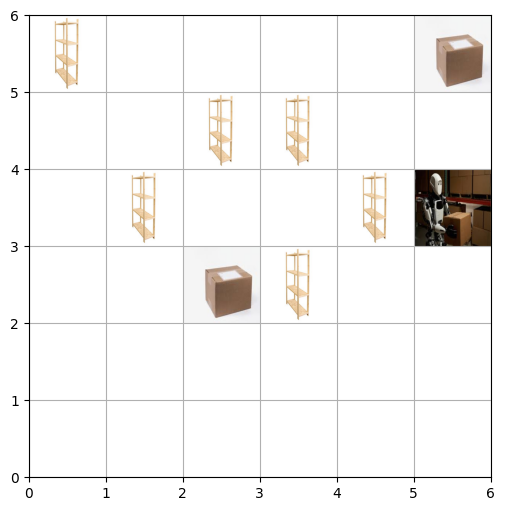

Step 12: Action=1, Position=(5, 4), Carrying=True, Reward=-1


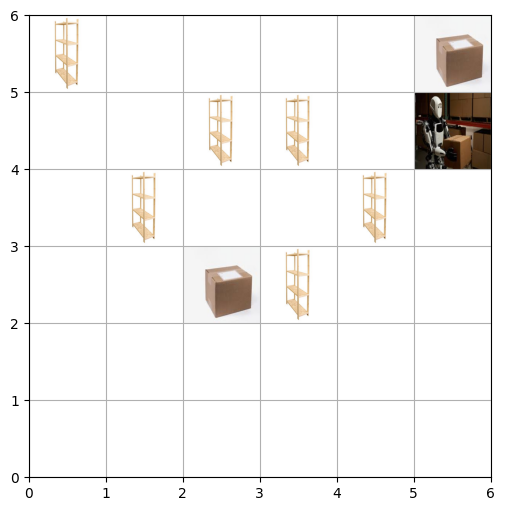

Step 13: Action=1, Position=(5, 5), Carrying=True, Reward=-1


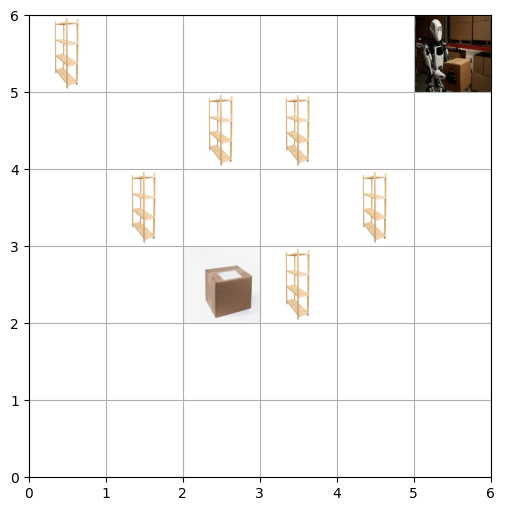

Step 14: Action=5, Position=(5, 5), Carrying=True, Reward=100


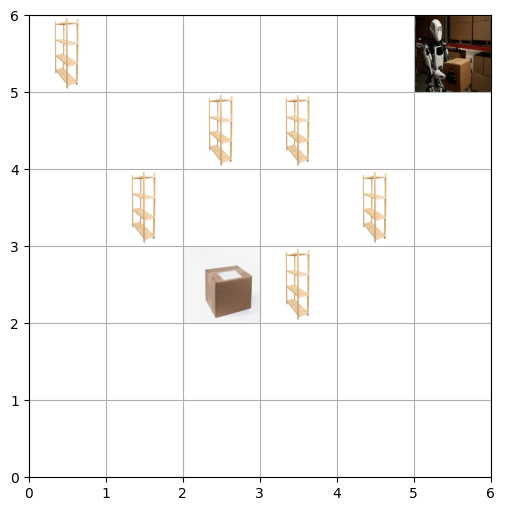

Episode 3: Task completed! Total Reward: 112
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


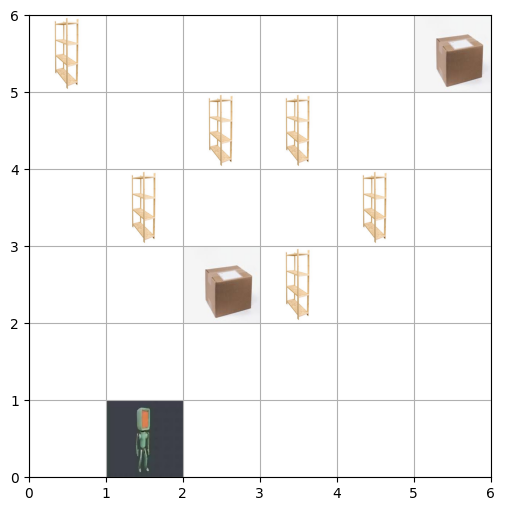

Step 1: Action=1, Position=(1, 1), Carrying=False, Reward=-1


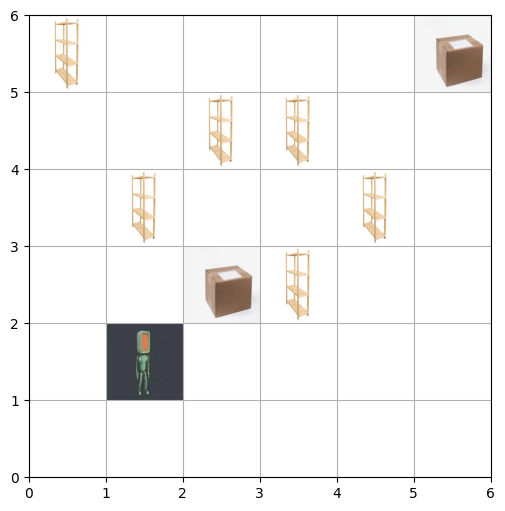

Step 2: Action=1, Position=(1, 1), Carrying=False, Reward=-1


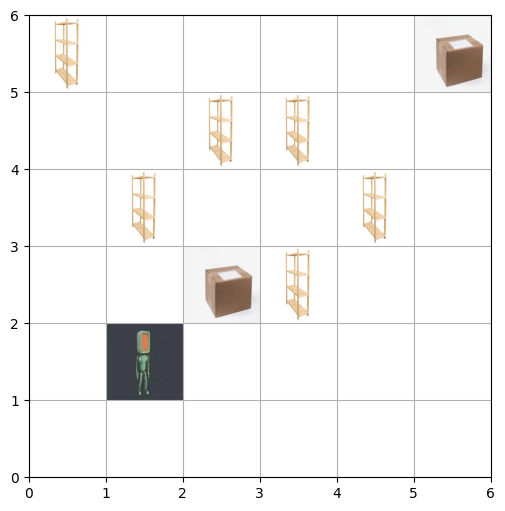

Step 3: Action=1, Position=(1, 2), Carrying=False, Reward=-1


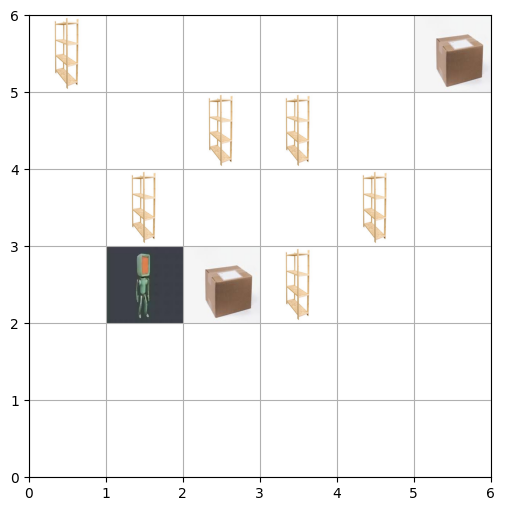

Step 4: Action=3, Position=(2, 2), Carrying=False, Reward=-1


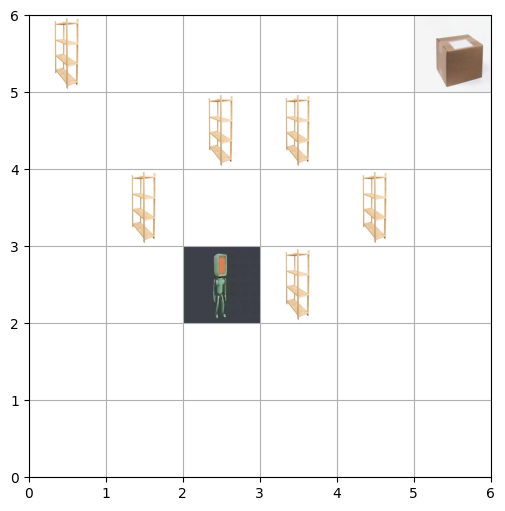

Step 5: Action=4, Position=(2, 2), Carrying=True, Reward=25


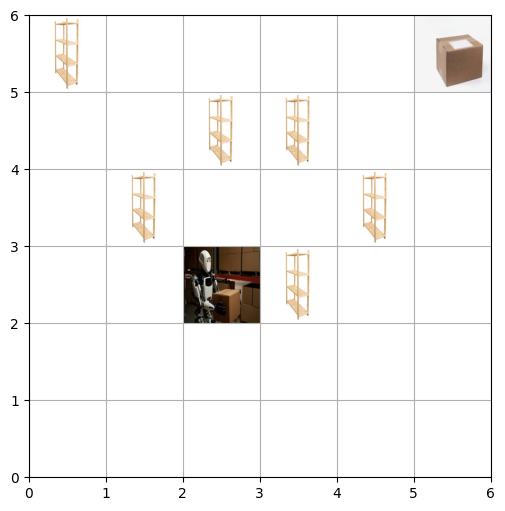

Step 6: Action=0, Position=(2, 1), Carrying=True, Reward=-1


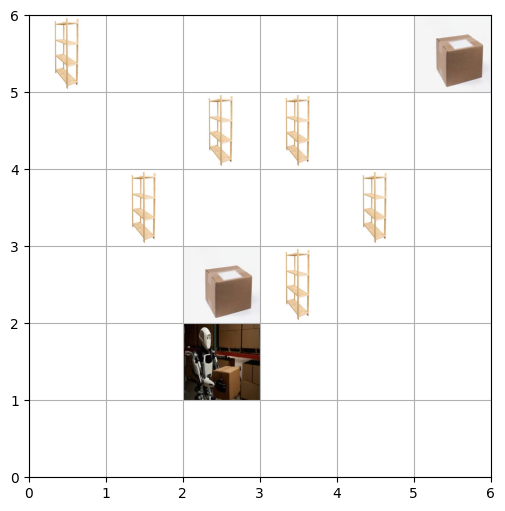

Step 7: Action=3, Position=(2, 1), Carrying=True, Reward=-1


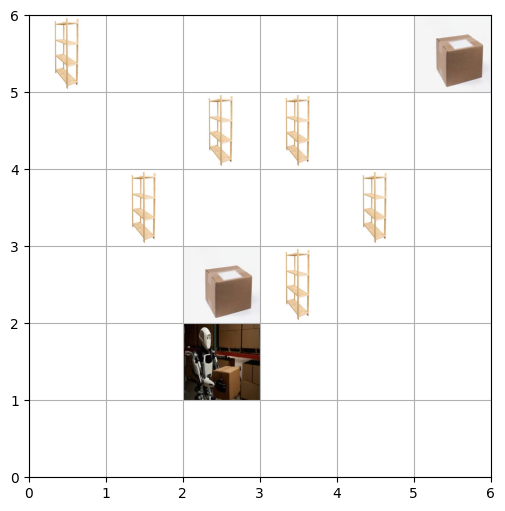

Step 8: Action=3, Position=(2, 1), Carrying=True, Reward=-1


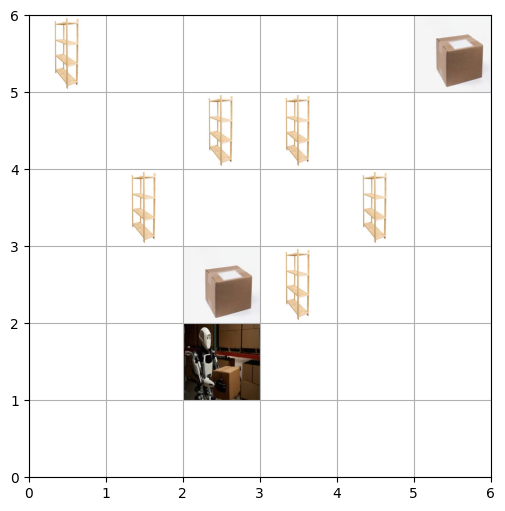

Step 9: Action=3, Position=(3, 1), Carrying=True, Reward=-1


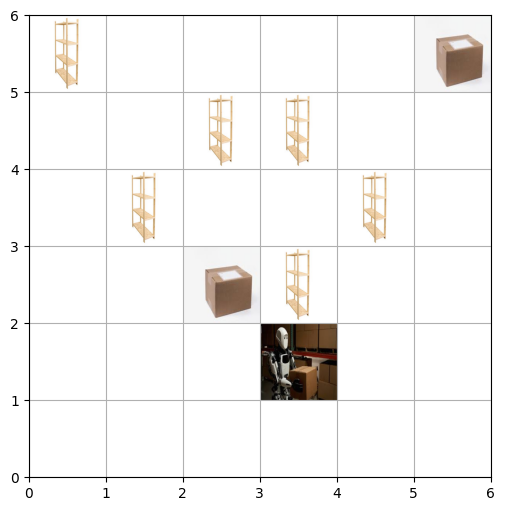

Step 10: Action=3, Position=(4, 1), Carrying=True, Reward=-1


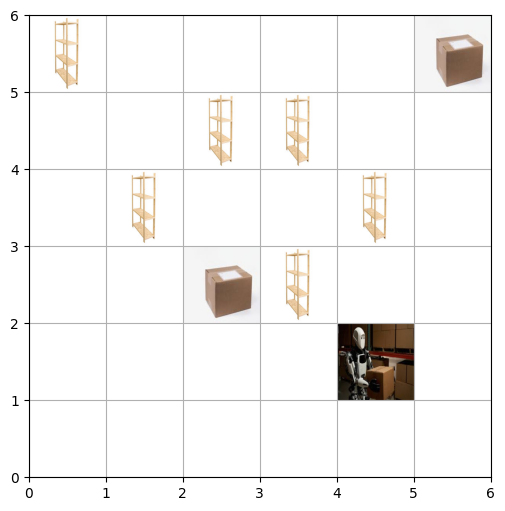

Step 11: Action=3, Position=(5, 1), Carrying=True, Reward=-1


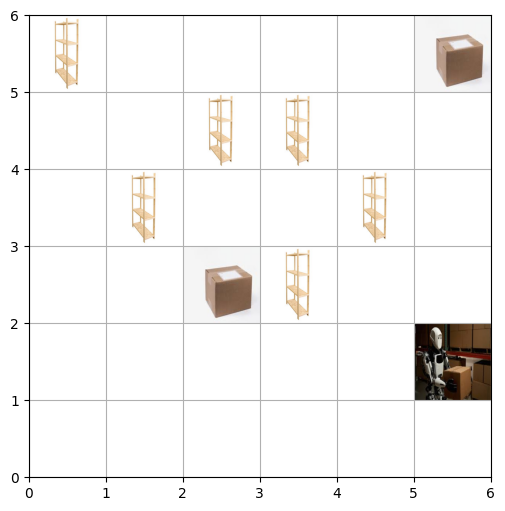

Step 12: Action=1, Position=(5, 2), Carrying=True, Reward=-1


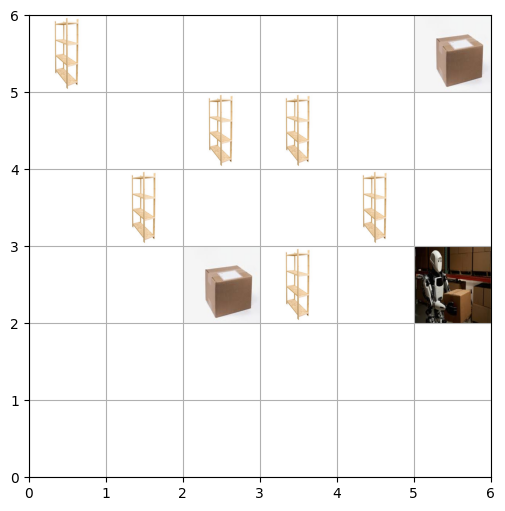

Step 13: Action=1, Position=(5, 3), Carrying=True, Reward=-1


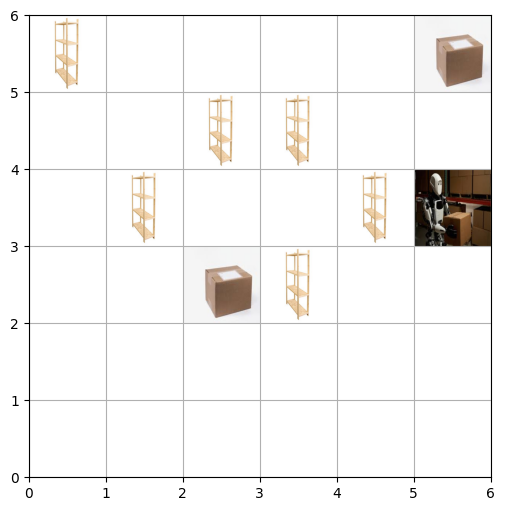

Step 14: Action=1, Position=(5, 4), Carrying=True, Reward=-1


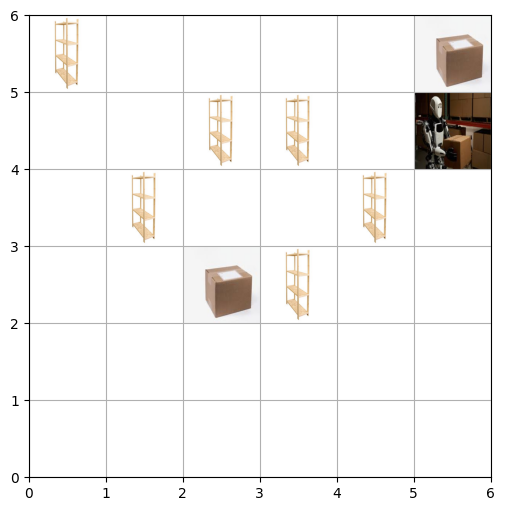

Step 15: Action=1, Position=(5, 5), Carrying=True, Reward=-1


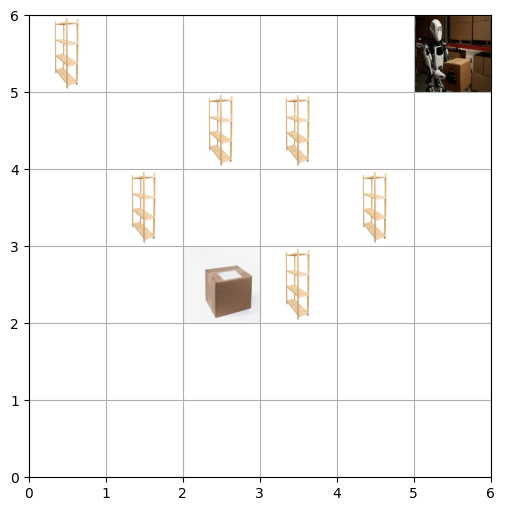

Step 16: Action=5, Position=(5, 5), Carrying=True, Reward=100


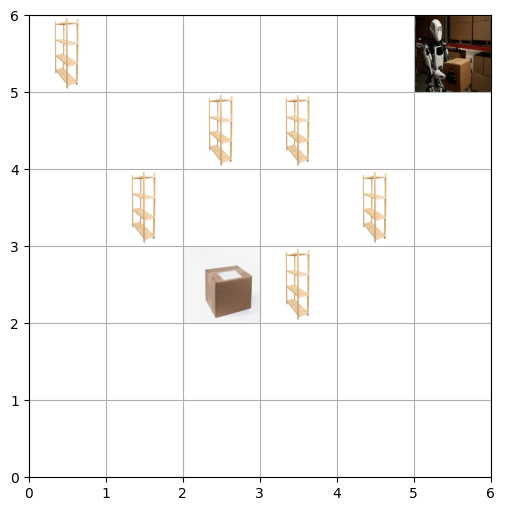

Episode 4: Task completed! Total Reward: 110
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


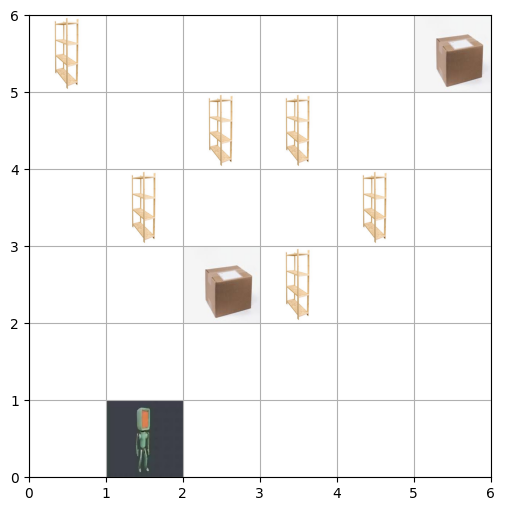

Step 1: Action=1, Position=(1, 0), Carrying=False, Reward=-1


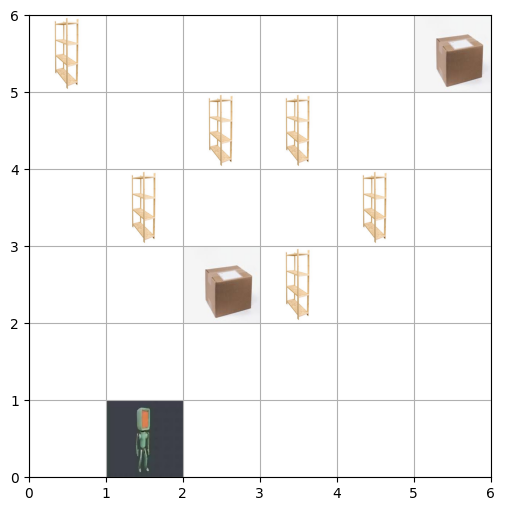

Step 2: Action=1, Position=(1, 1), Carrying=False, Reward=-1


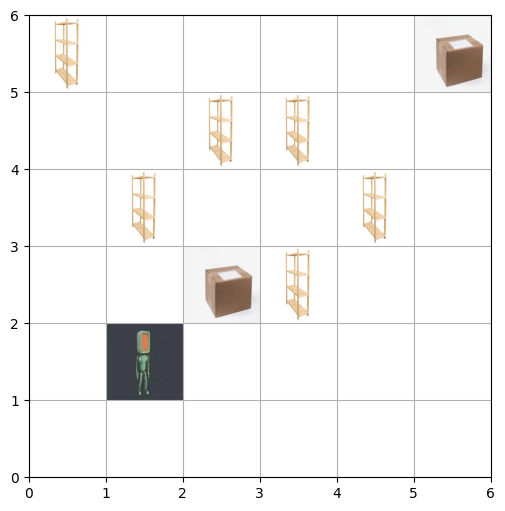

Step 3: Action=1, Position=(1, 2), Carrying=False, Reward=-1


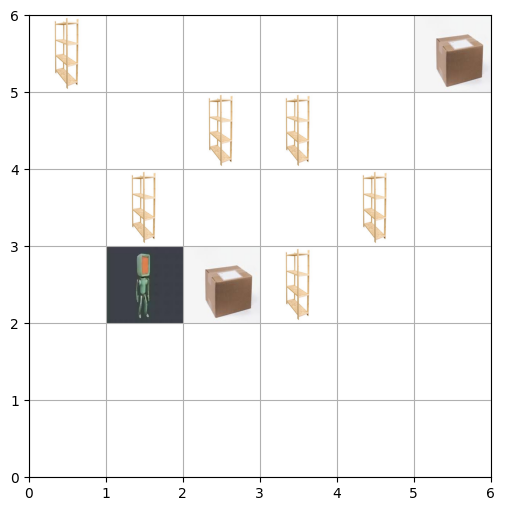

Step 4: Action=3, Position=(2, 2), Carrying=False, Reward=-1


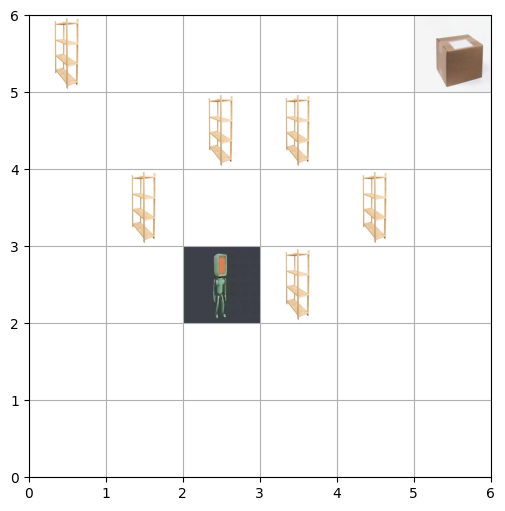

Step 5: Action=4, Position=(2, 2), Carrying=True, Reward=25


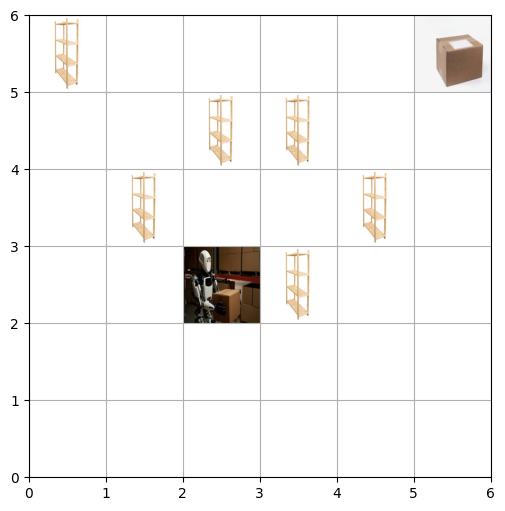

Step 6: Action=0, Position=(2, 1), Carrying=True, Reward=-1


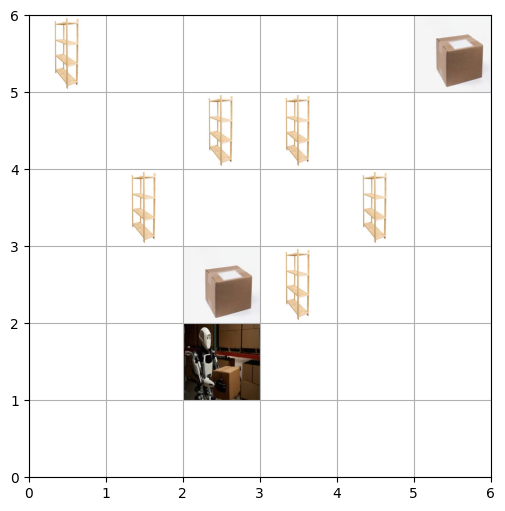

Step 7: Action=3, Position=(3, 1), Carrying=True, Reward=-1


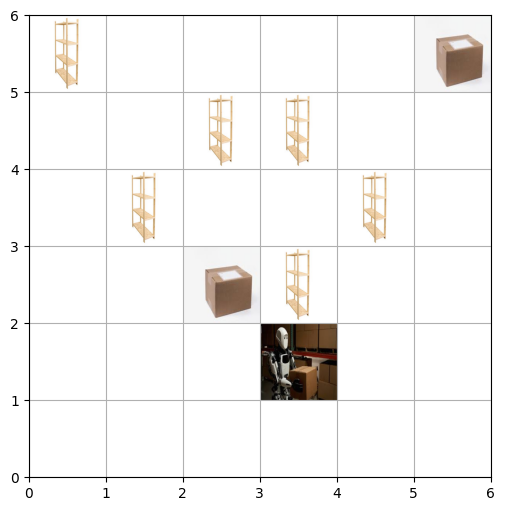

Step 8: Action=3, Position=(3, 1), Carrying=True, Reward=-1


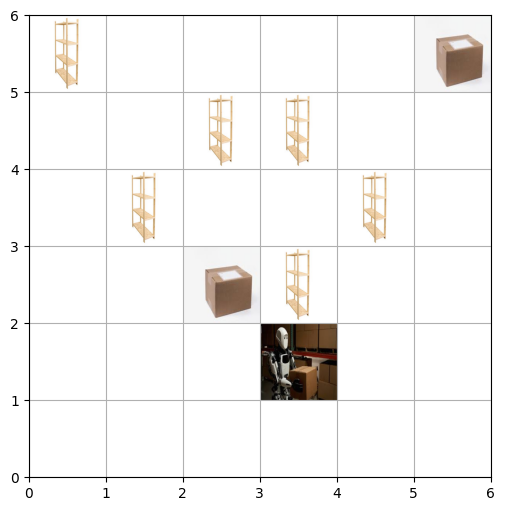

Step 9: Action=3, Position=(4, 1), Carrying=True, Reward=-1


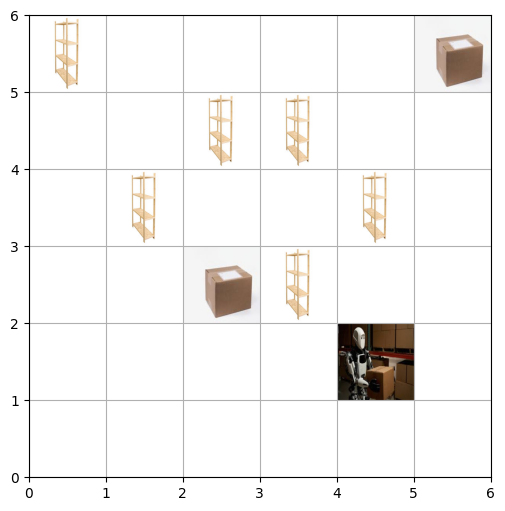

Step 10: Action=3, Position=(5, 1), Carrying=True, Reward=-1


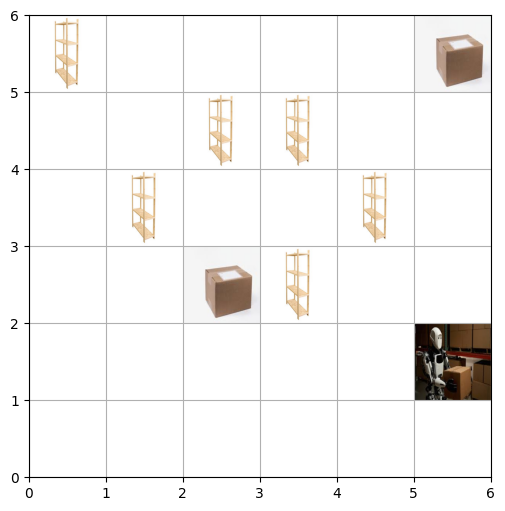

Step 11: Action=1, Position=(5, 2), Carrying=True, Reward=-1


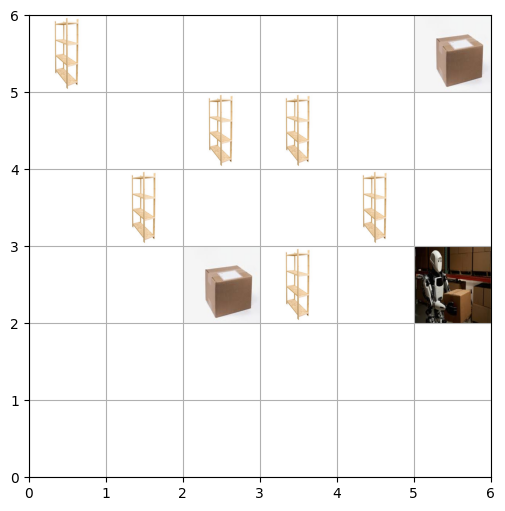

Step 12: Action=1, Position=(5, 3), Carrying=True, Reward=-1


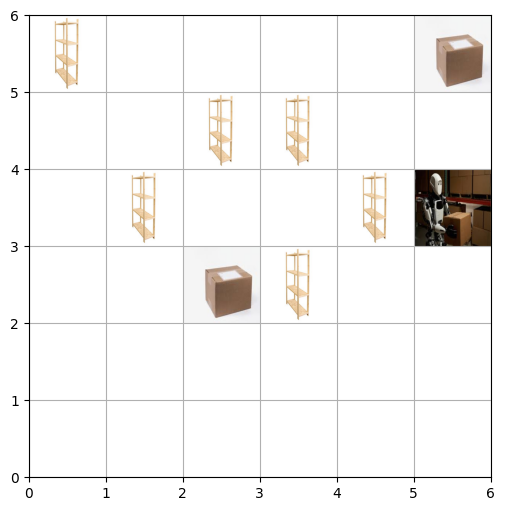

Step 13: Action=1, Position=(5, 4), Carrying=True, Reward=-1


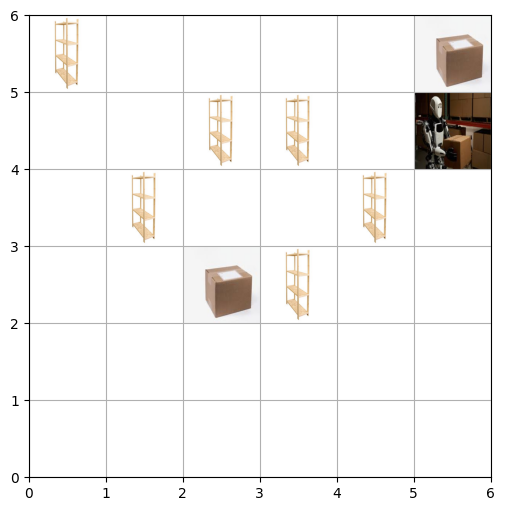

Step 14: Action=1, Position=(5, 5), Carrying=True, Reward=-1


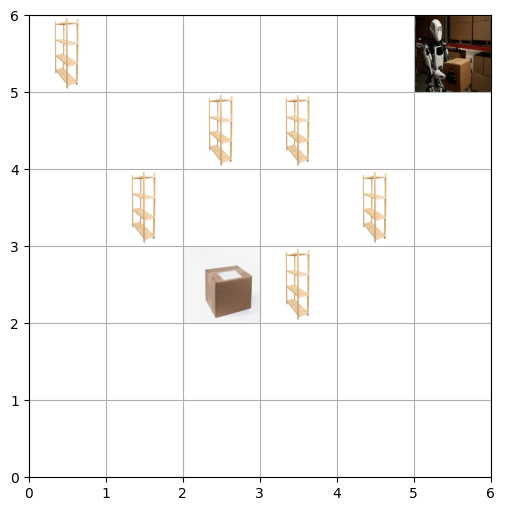

Step 15: Action=5, Position=(5, 5), Carrying=True, Reward=100


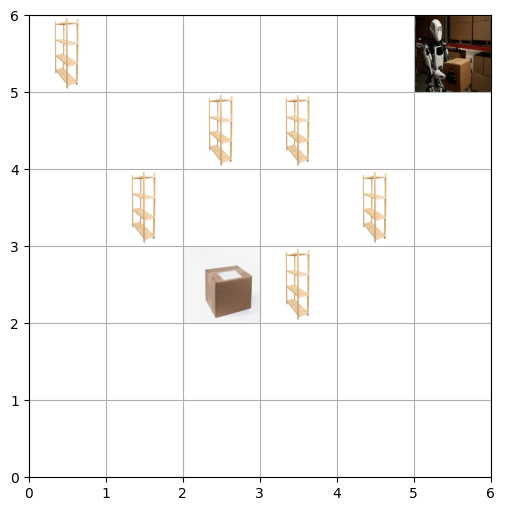

Episode 5: Task completed! Total Reward: 111
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


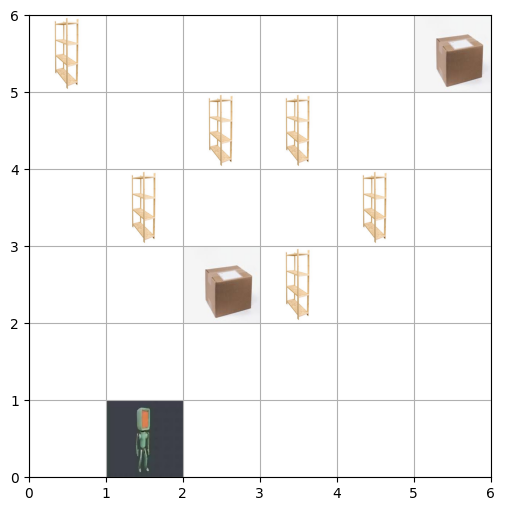

Step 1: Action=1, Position=(1, 1), Carrying=False, Reward=-1


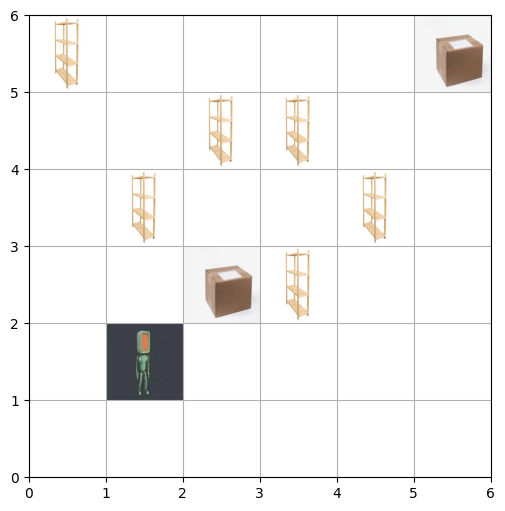

Step 2: Action=1, Position=(1, 2), Carrying=False, Reward=-1


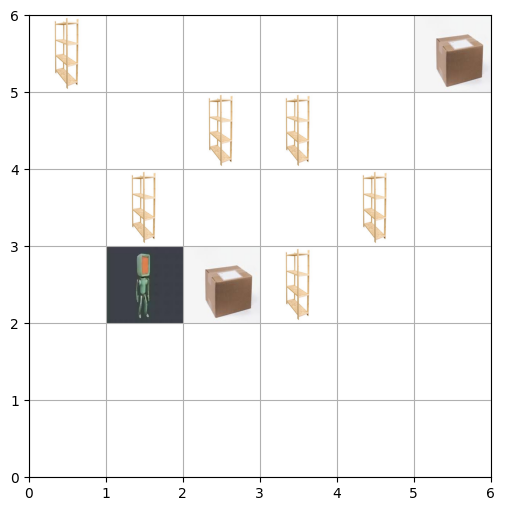

Step 3: Action=3, Position=(2, 2), Carrying=False, Reward=-1


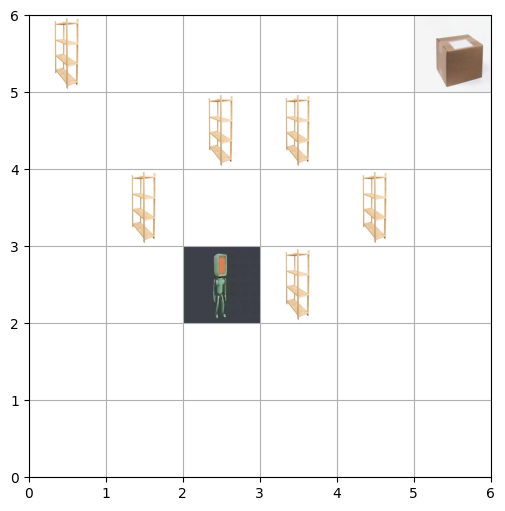

Step 4: Action=4, Position=(2, 2), Carrying=True, Reward=25


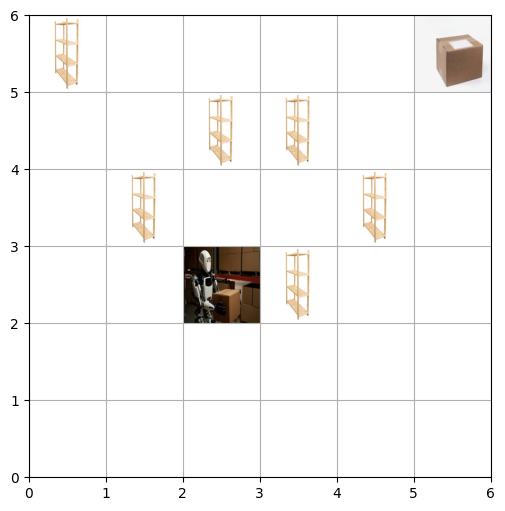

Step 5: Action=0, Position=(2, 2), Carrying=True, Reward=-1


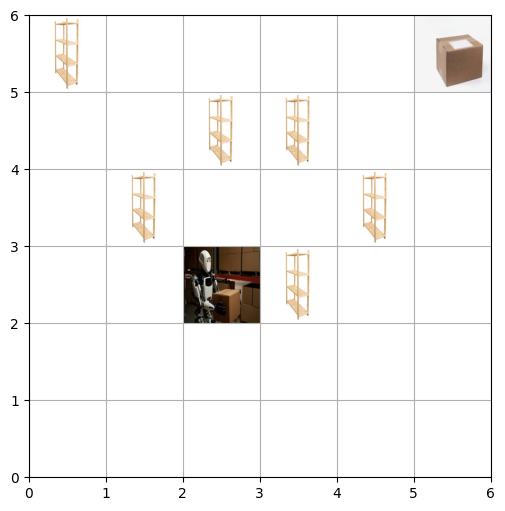

Step 6: Action=0, Position=(2, 1), Carrying=True, Reward=-1


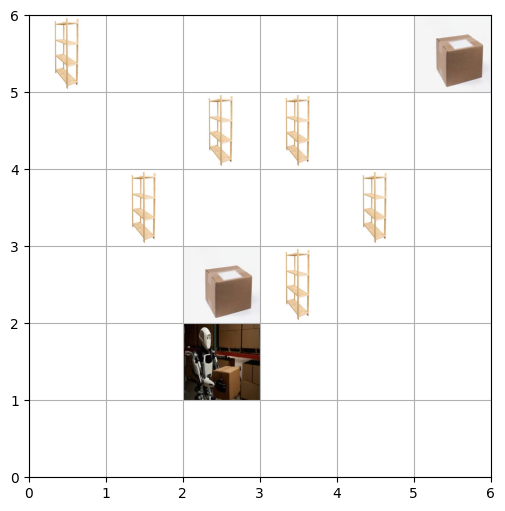

Step 7: Action=3, Position=(3, 1), Carrying=True, Reward=-1


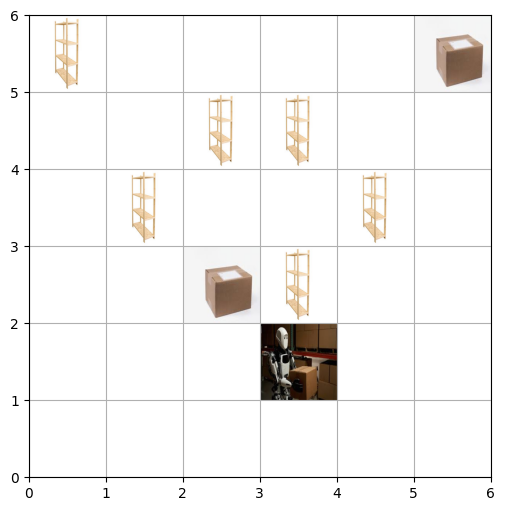

Step 8: Action=3, Position=(3, 1), Carrying=True, Reward=-1


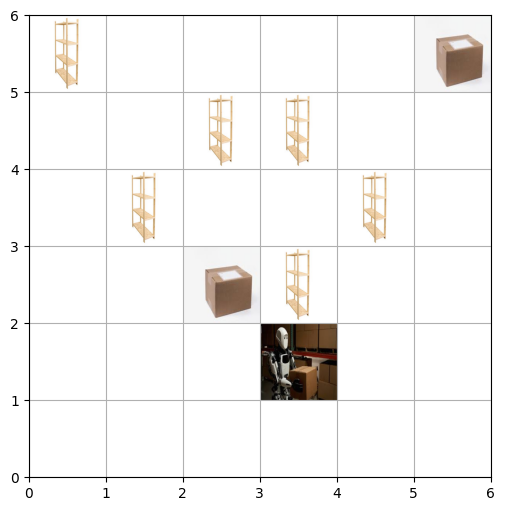

Step 9: Action=3, Position=(4, 1), Carrying=True, Reward=-1


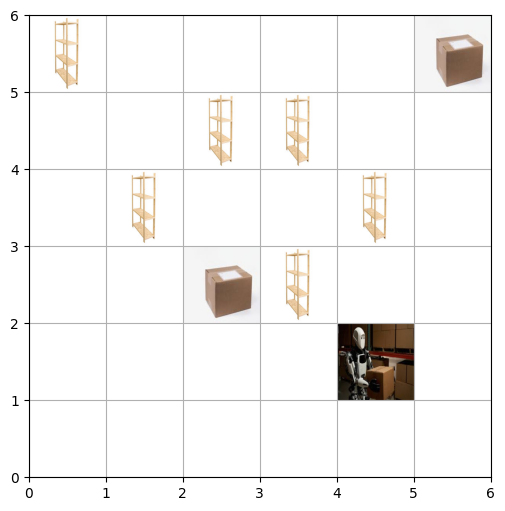

Step 10: Action=3, Position=(5, 1), Carrying=True, Reward=-1


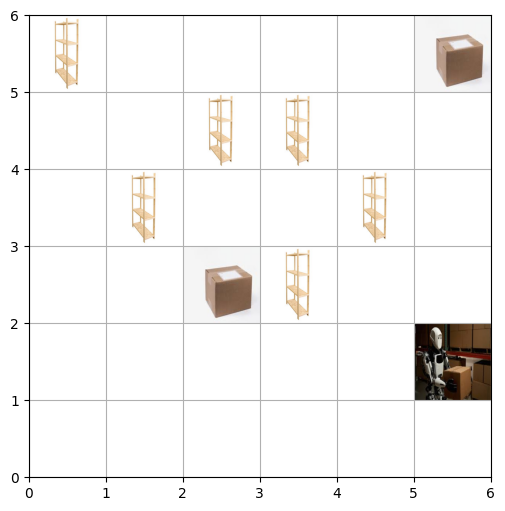

Step 11: Action=1, Position=(5, 2), Carrying=True, Reward=-1


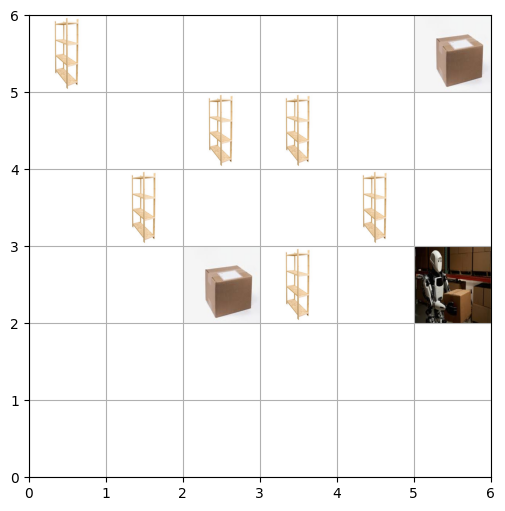

Step 12: Action=1, Position=(5, 3), Carrying=True, Reward=-1


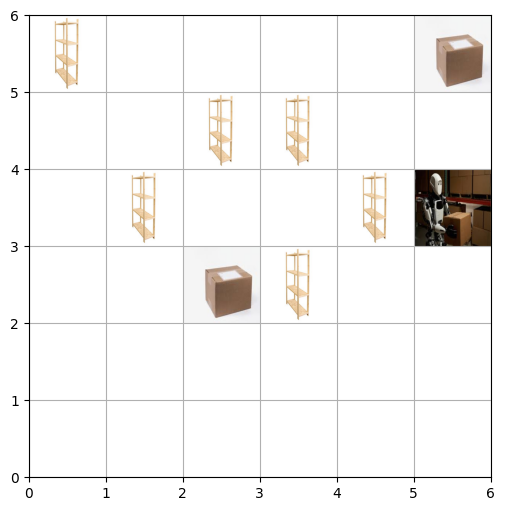

Step 13: Action=1, Position=(5, 4), Carrying=True, Reward=-1


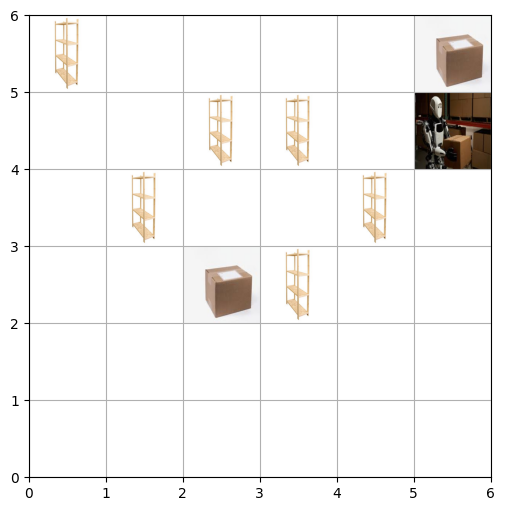

Step 14: Action=1, Position=(5, 5), Carrying=True, Reward=-1


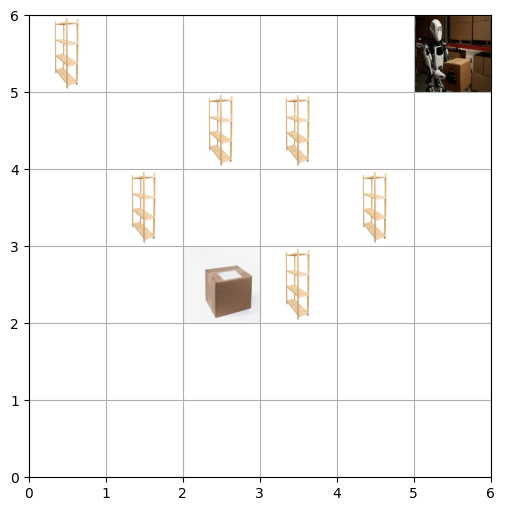

Step 15: Action=5, Position=(5, 5), Carrying=True, Reward=100


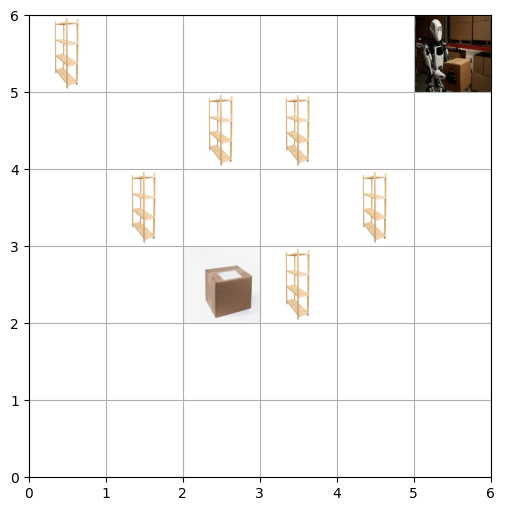

Episode 6: Task completed! Total Reward: 111
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


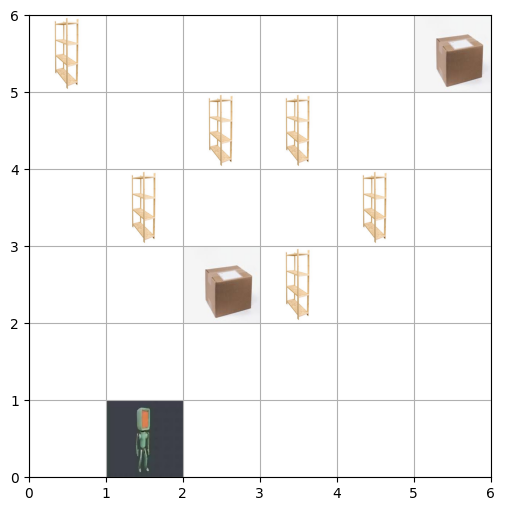

Step 1: Action=1, Position=(1, 0), Carrying=False, Reward=-1


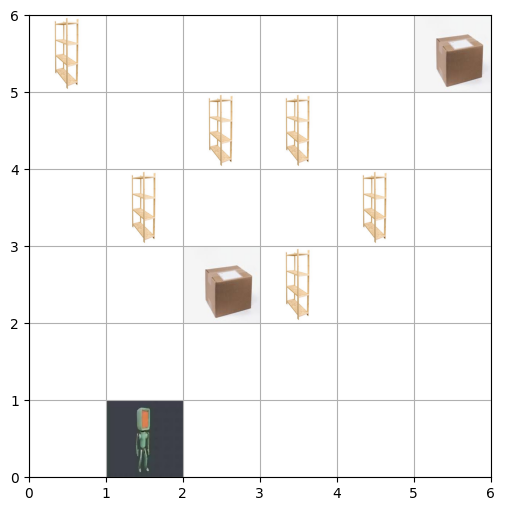

Step 2: Action=1, Position=(1, 1), Carrying=False, Reward=-1


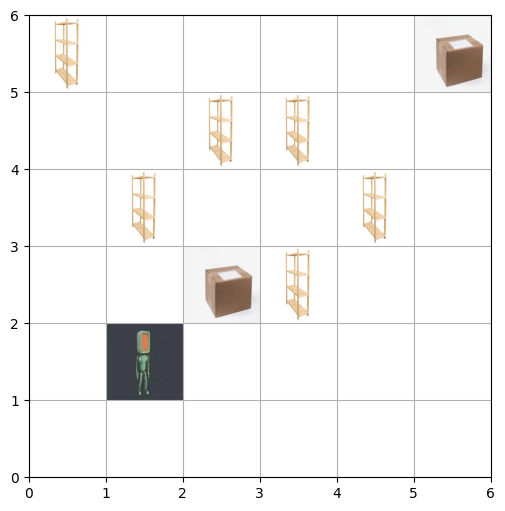

Step 3: Action=1, Position=(1, 2), Carrying=False, Reward=-1


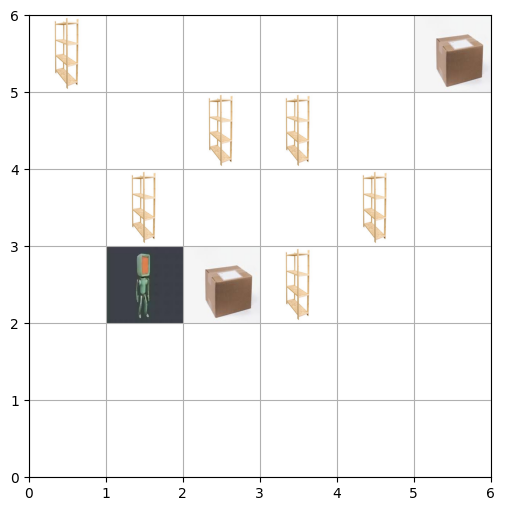

Step 4: Action=3, Position=(2, 2), Carrying=False, Reward=-1


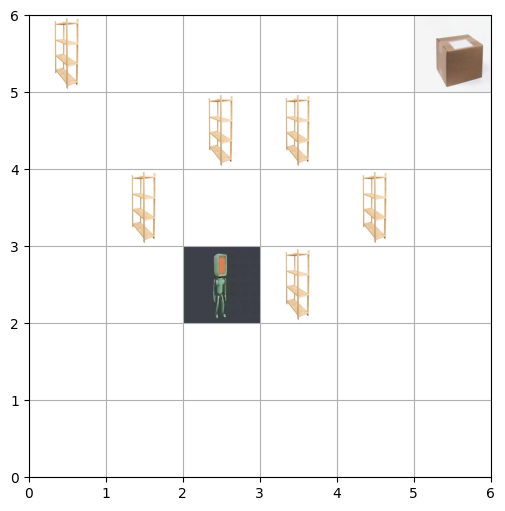

Step 5: Action=4, Position=(2, 2), Carrying=True, Reward=25


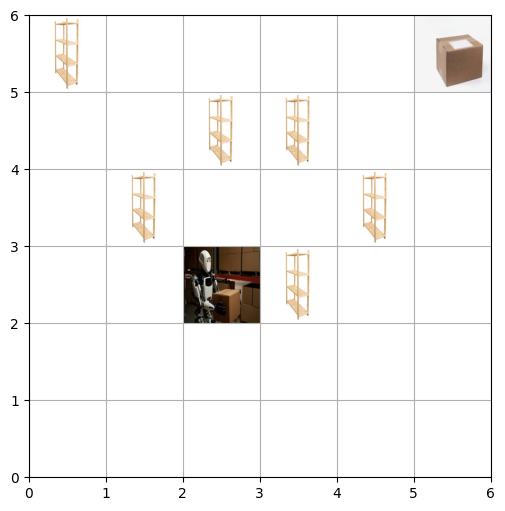

Step 6: Action=0, Position=(2, 1), Carrying=True, Reward=-1


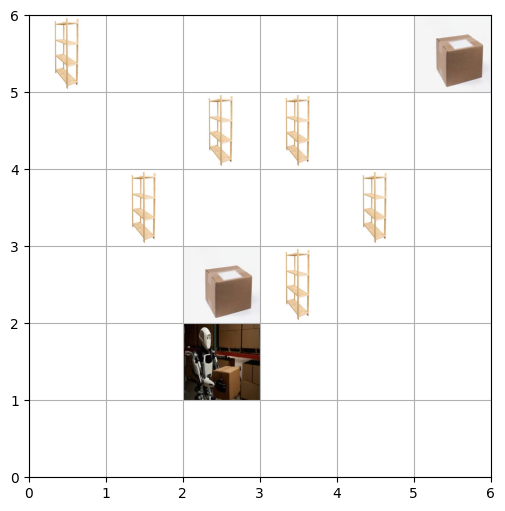

Step 7: Action=3, Position=(3, 1), Carrying=True, Reward=-1


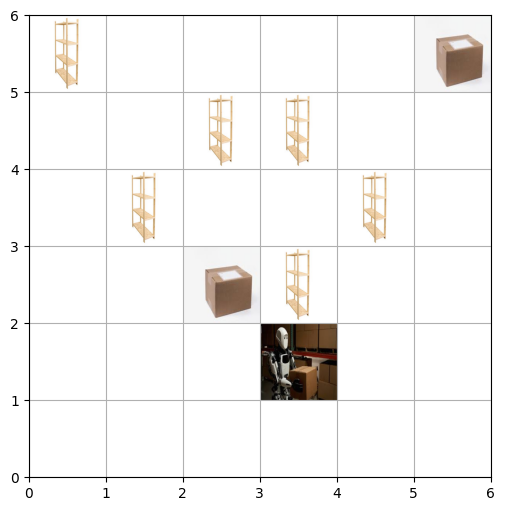

Step 8: Action=3, Position=(4, 1), Carrying=True, Reward=-1


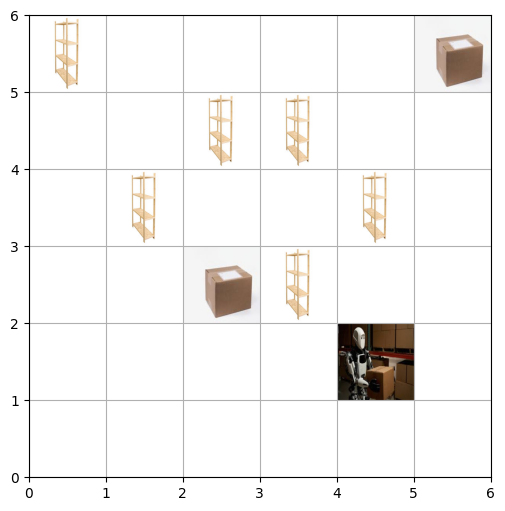

Step 9: Action=3, Position=(5, 1), Carrying=True, Reward=-1


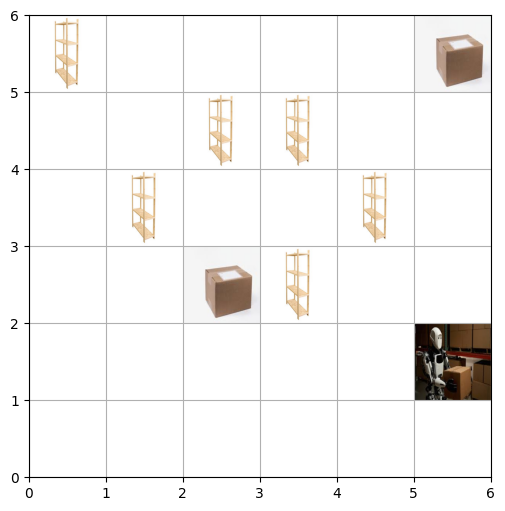

Step 10: Action=1, Position=(5, 2), Carrying=True, Reward=-1


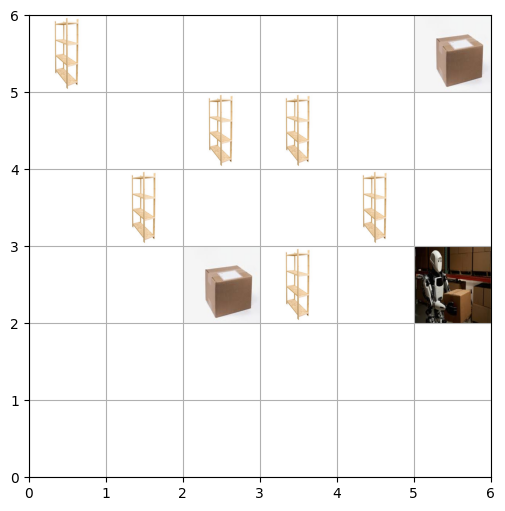

Step 11: Action=1, Position=(5, 3), Carrying=True, Reward=-1


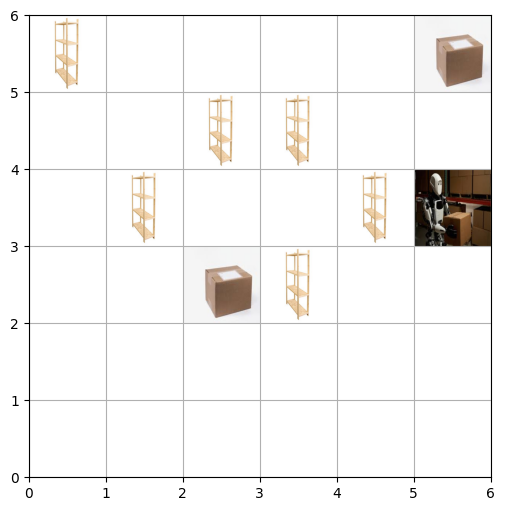

Step 12: Action=1, Position=(5, 4), Carrying=True, Reward=-1


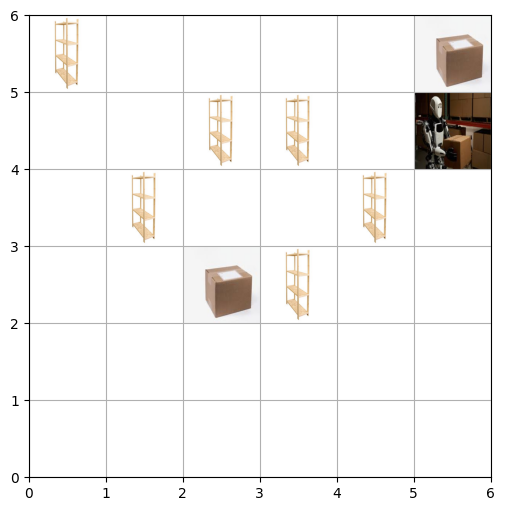

Step 13: Action=1, Position=(5, 5), Carrying=True, Reward=-1


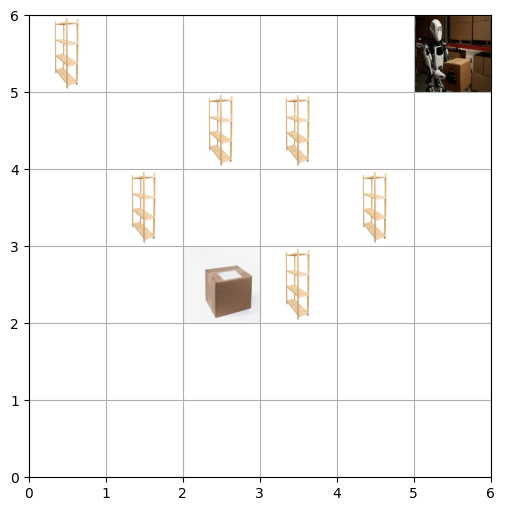

Step 14: Action=5, Position=(5, 5), Carrying=True, Reward=100


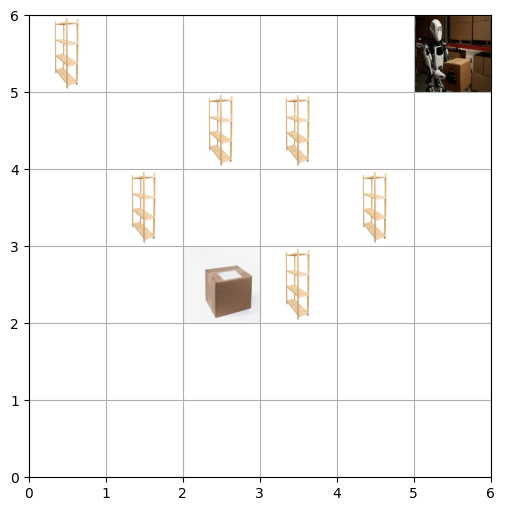

Episode 7: Task completed! Total Reward: 112
Step 0: Action=3, Position=(0, 0), Carrying=False, Reward=-1


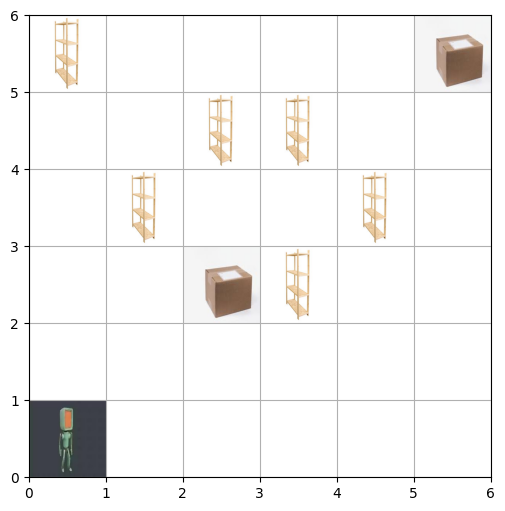

Step 1: Action=3, Position=(1, 0), Carrying=False, Reward=-1


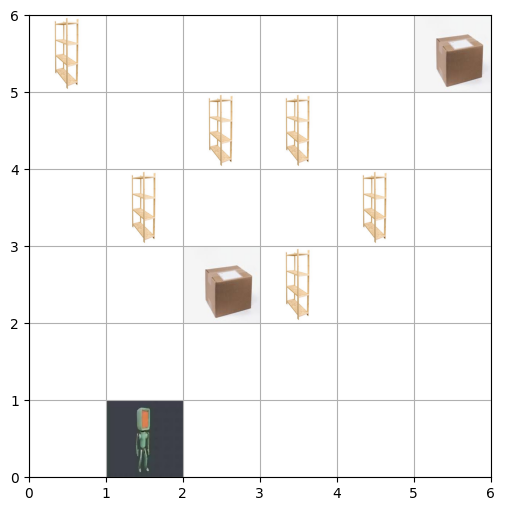

Step 2: Action=1, Position=(1, 0), Carrying=False, Reward=-1


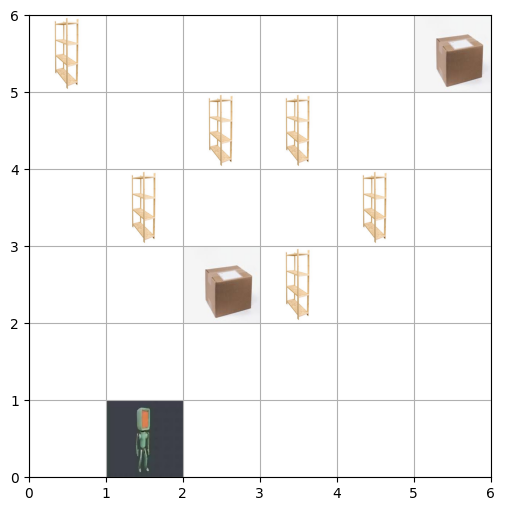

Step 3: Action=1, Position=(1, 1), Carrying=False, Reward=-1


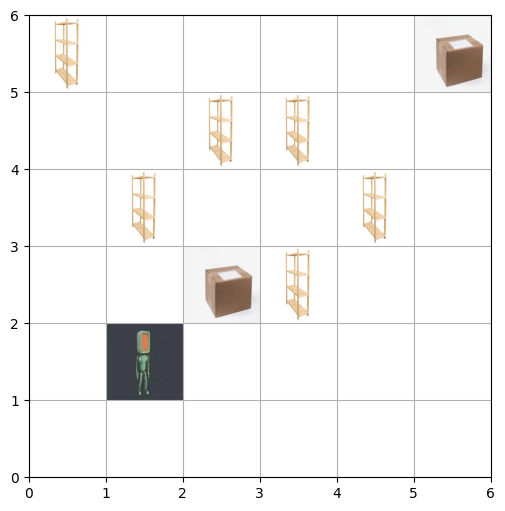

Step 4: Action=1, Position=(1, 2), Carrying=False, Reward=-1


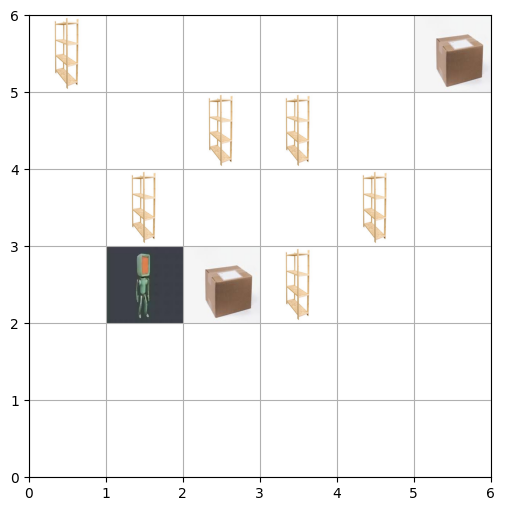

Step 5: Action=3, Position=(2, 2), Carrying=False, Reward=-1


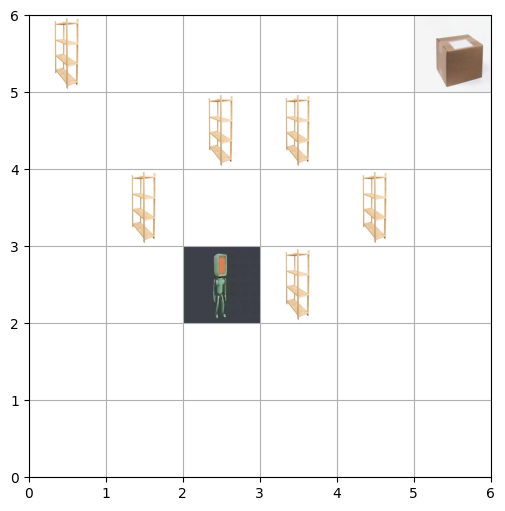

Step 6: Action=4, Position=(2, 2), Carrying=True, Reward=25


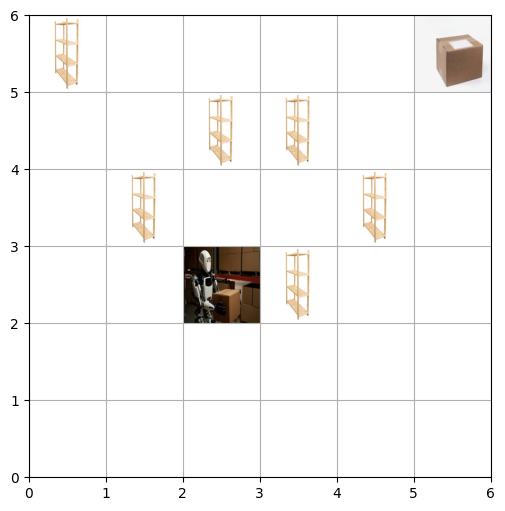

Step 7: Action=0, Position=(2, 1), Carrying=True, Reward=-1


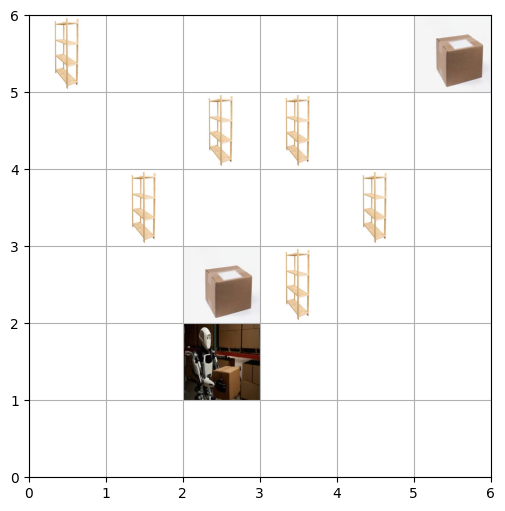

Step 8: Action=3, Position=(3, 1), Carrying=True, Reward=-1


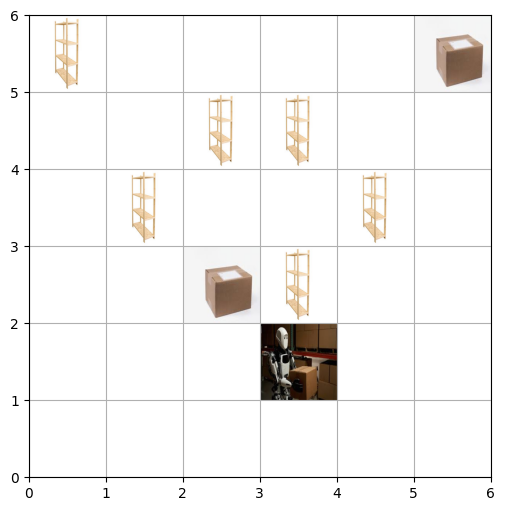

Step 9: Action=3, Position=(4, 1), Carrying=True, Reward=-1


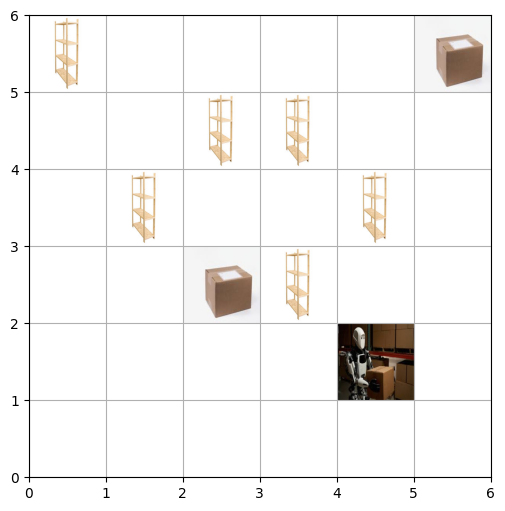

Step 10: Action=3, Position=(5, 1), Carrying=True, Reward=-1


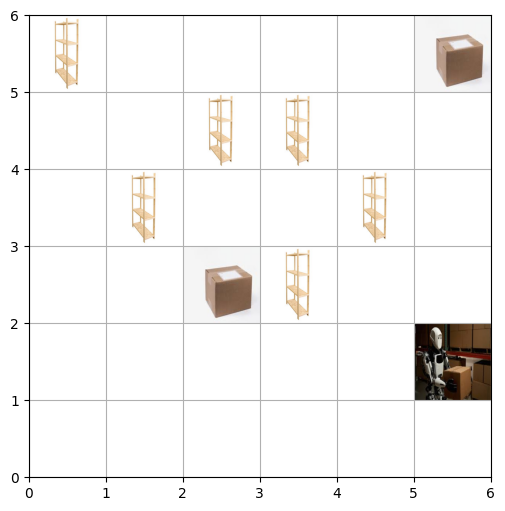

Step 11: Action=1, Position=(5, 2), Carrying=True, Reward=-1


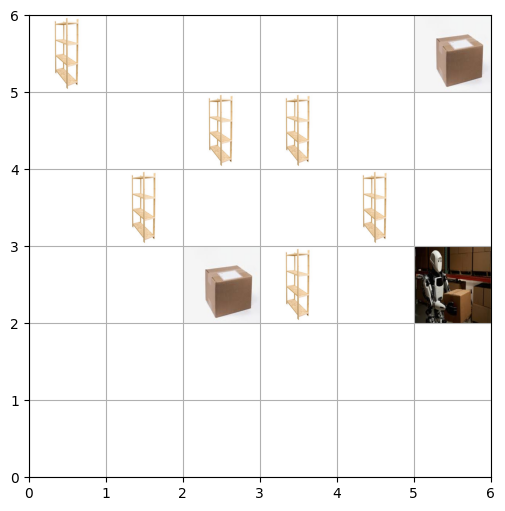

Step 12: Action=1, Position=(5, 3), Carrying=True, Reward=-1


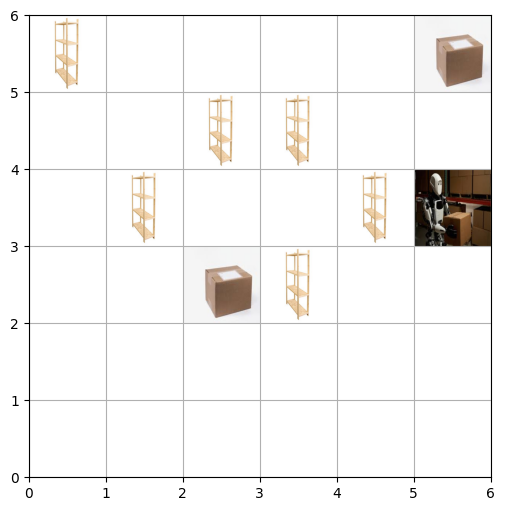

Step 13: Action=1, Position=(5, 4), Carrying=True, Reward=-1


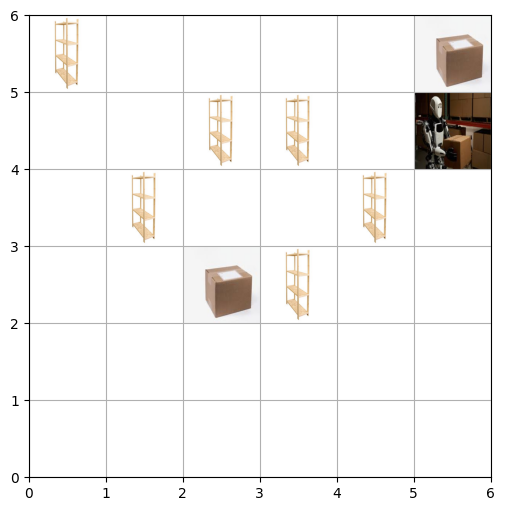

Step 14: Action=1, Position=(5, 5), Carrying=True, Reward=-1


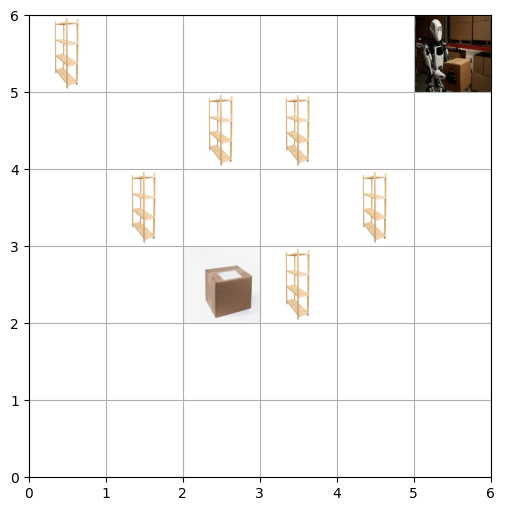

Step 15: Action=5, Position=(5, 5), Carrying=True, Reward=100


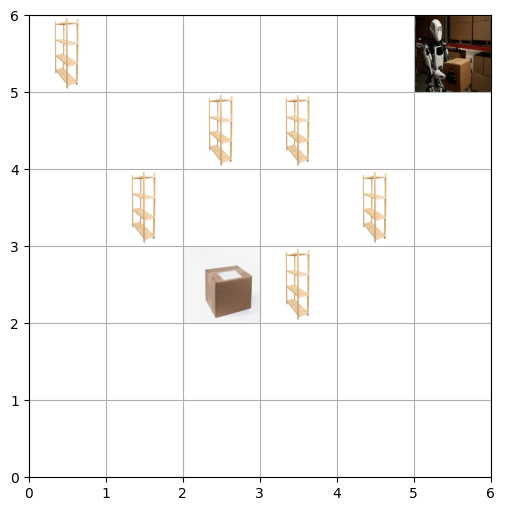

Episode 8: Task completed! Total Reward: 111
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


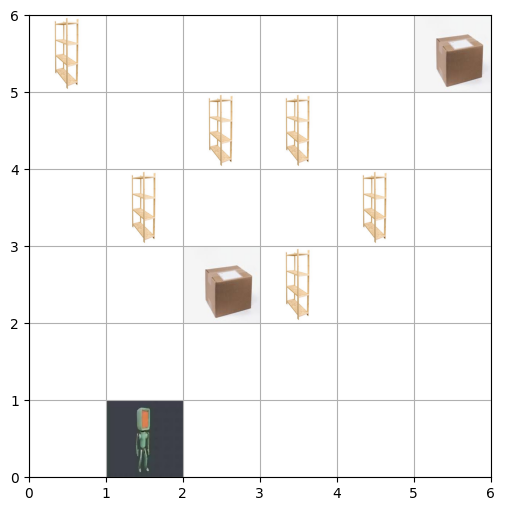

Step 1: Action=1, Position=(1, 1), Carrying=False, Reward=-1


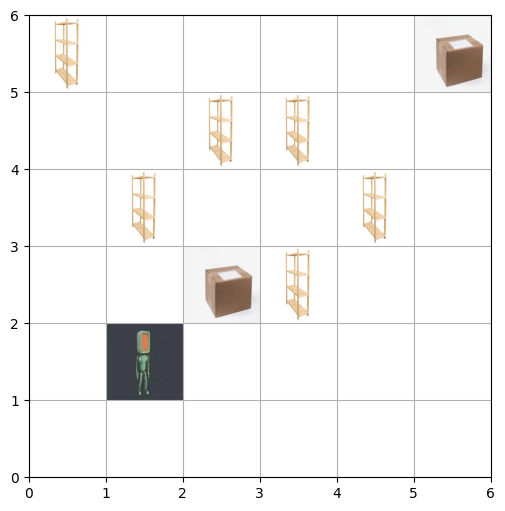

Step 2: Action=1, Position=(1, 2), Carrying=False, Reward=-1


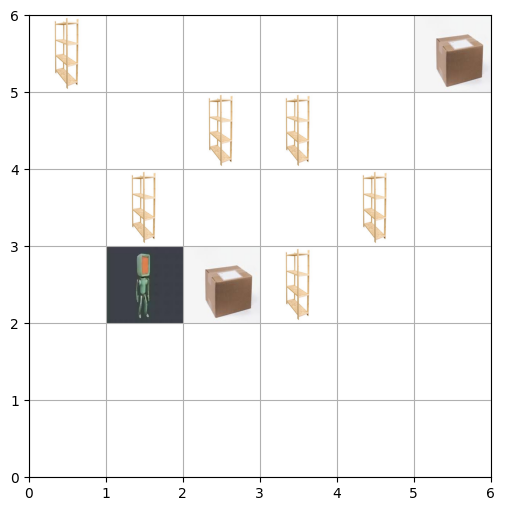

Step 3: Action=3, Position=(1, 2), Carrying=False, Reward=-1


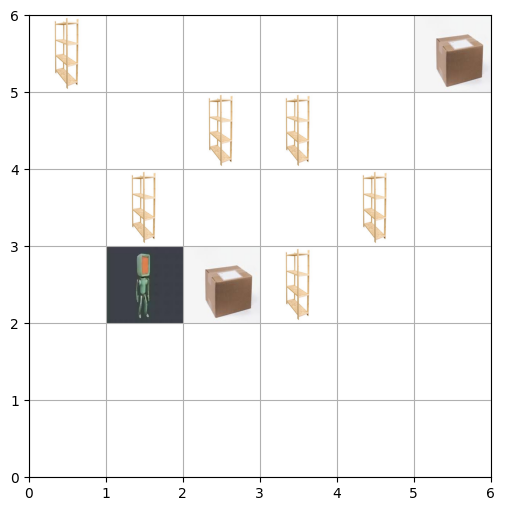

Step 4: Action=3, Position=(2, 2), Carrying=False, Reward=-1


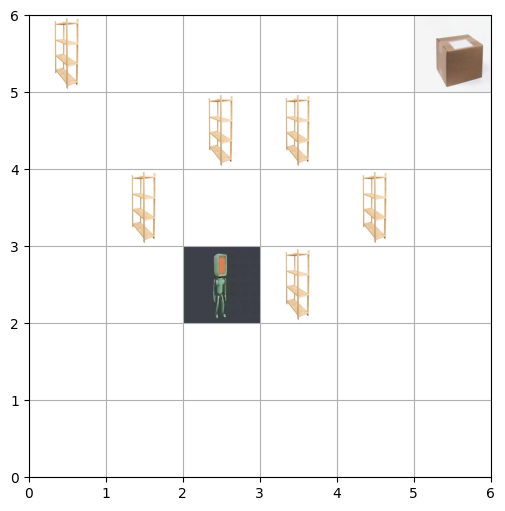

Step 5: Action=4, Position=(2, 2), Carrying=True, Reward=25


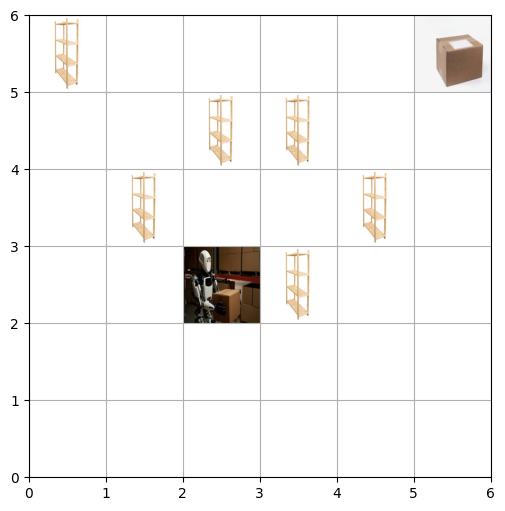

Step 6: Action=0, Position=(2, 1), Carrying=True, Reward=-1


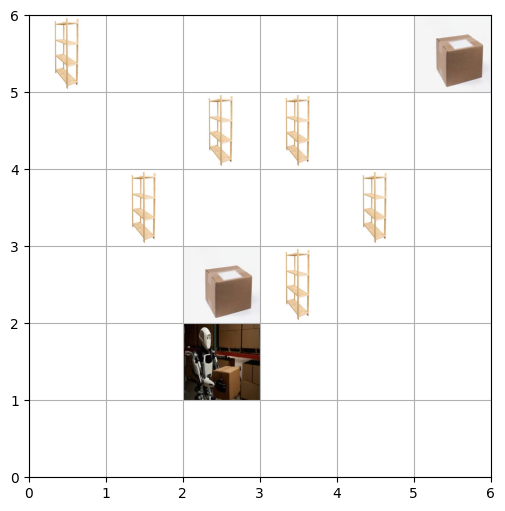

Step 7: Action=3, Position=(3, 1), Carrying=True, Reward=-1


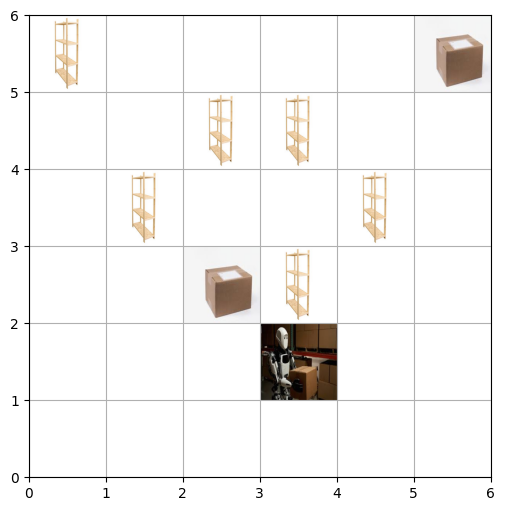

Step 8: Action=3, Position=(4, 1), Carrying=True, Reward=-1


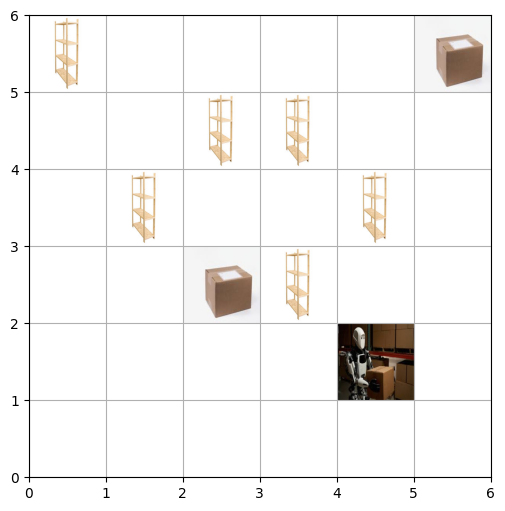

Step 9: Action=3, Position=(5, 1), Carrying=True, Reward=-1


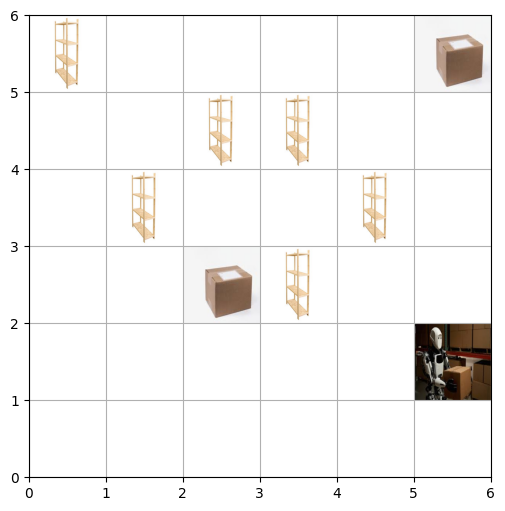

Step 10: Action=1, Position=(5, 2), Carrying=True, Reward=-1


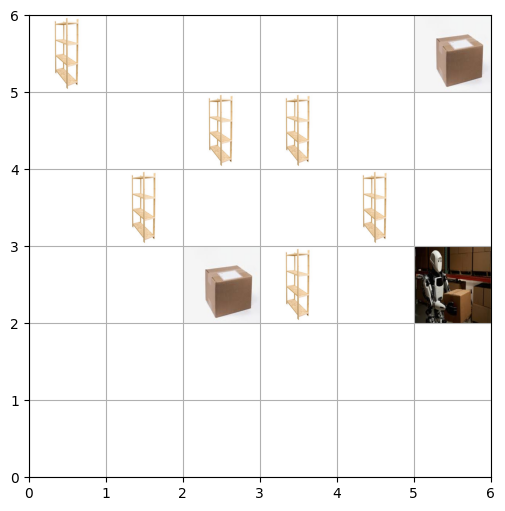

Step 11: Action=1, Position=(5, 3), Carrying=True, Reward=-1


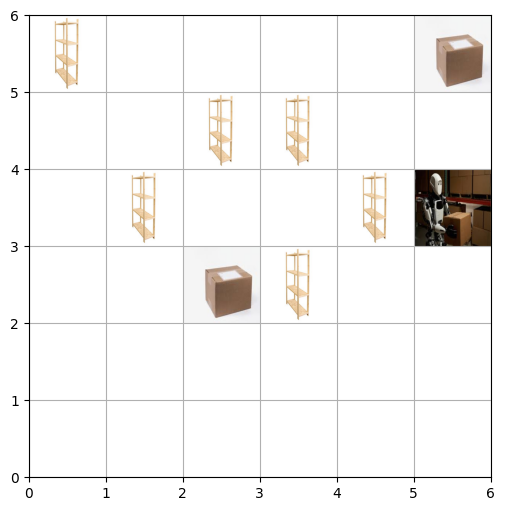

Step 12: Action=1, Position=(5, 4), Carrying=True, Reward=-1


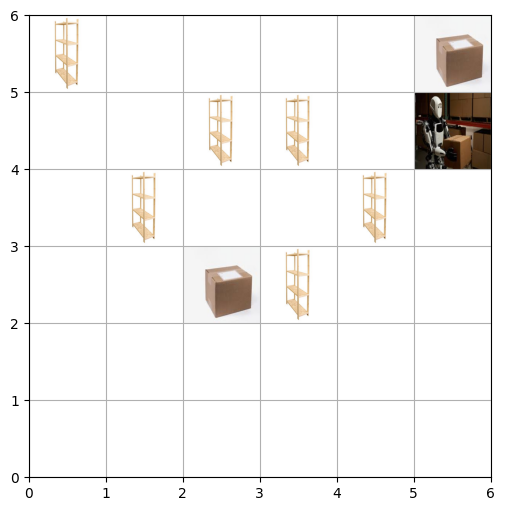

Step 13: Action=1, Position=(5, 5), Carrying=True, Reward=-1


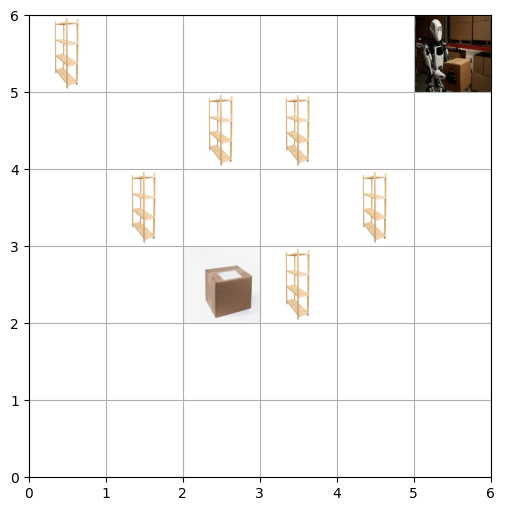

Step 14: Action=5, Position=(5, 5), Carrying=True, Reward=100


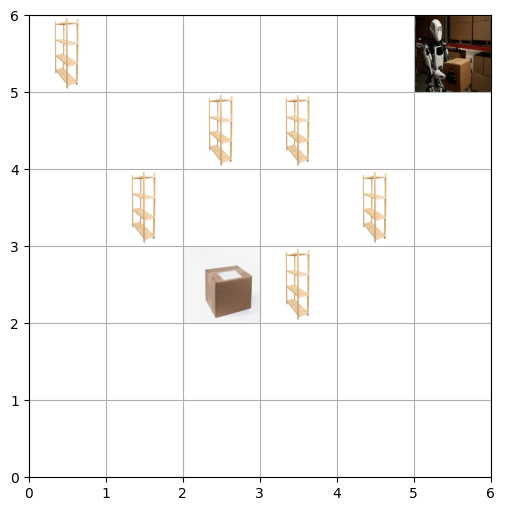

Episode 9: Task completed! Total Reward: 112
Step 0: Action=3, Position=(1, 0), Carrying=False, Reward=-1


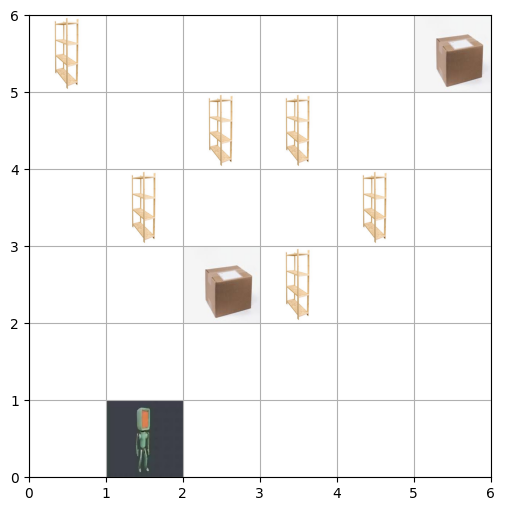

Step 1: Action=1, Position=(1, 1), Carrying=False, Reward=-1


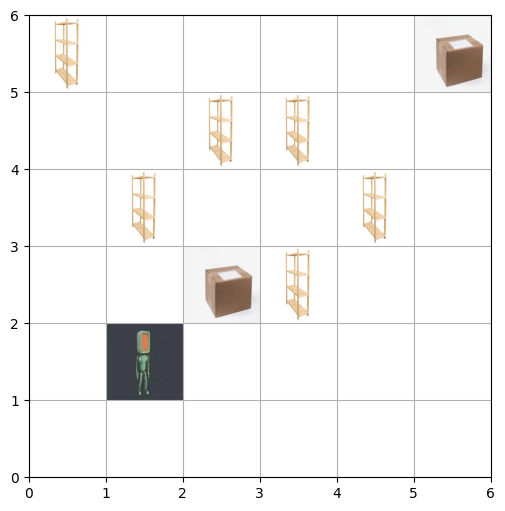

Step 2: Action=1, Position=(1, 2), Carrying=False, Reward=-1


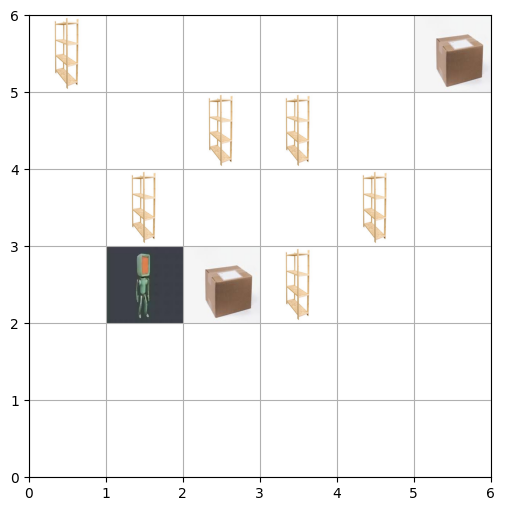

Step 3: Action=3, Position=(2, 2), Carrying=False, Reward=-1


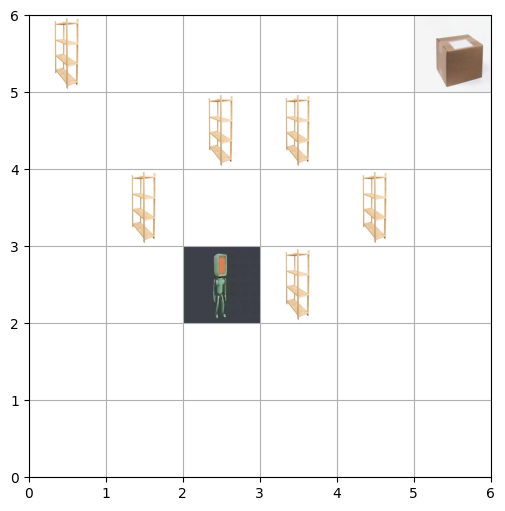

Step 4: Action=4, Position=(2, 2), Carrying=True, Reward=25


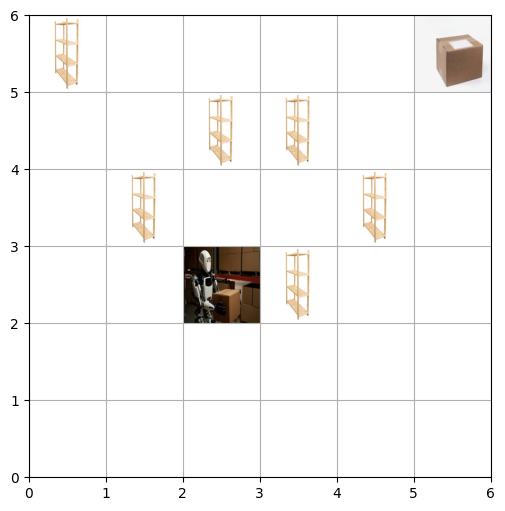

Step 5: Action=0, Position=(2, 1), Carrying=True, Reward=-1


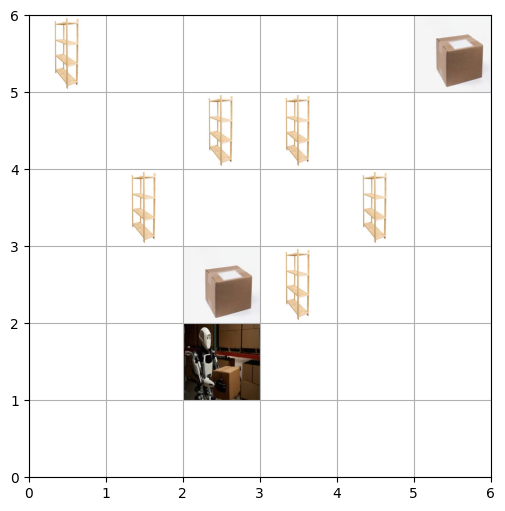

Step 6: Action=3, Position=(3, 1), Carrying=True, Reward=-1


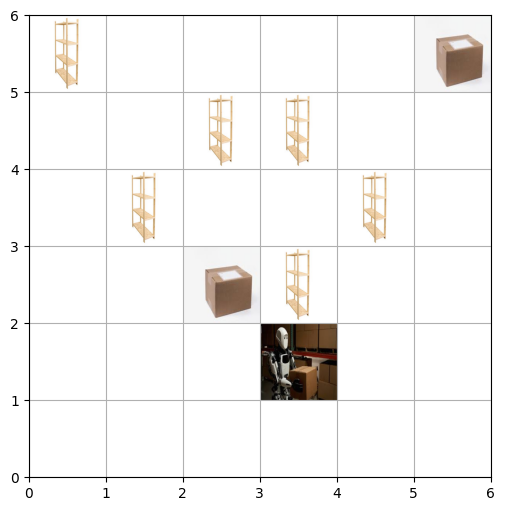

Step 7: Action=3, Position=(4, 1), Carrying=True, Reward=-1


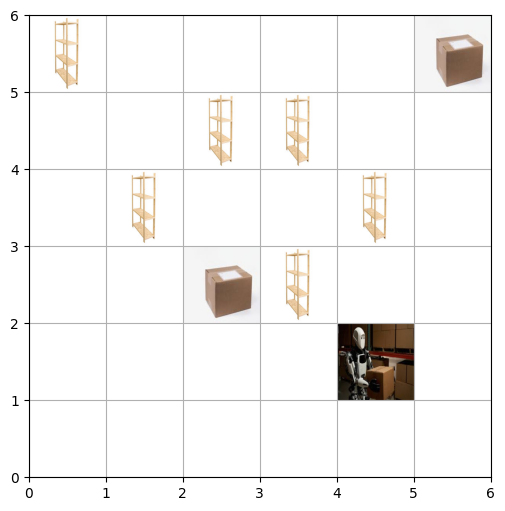

Step 8: Action=3, Position=(5, 1), Carrying=True, Reward=-1


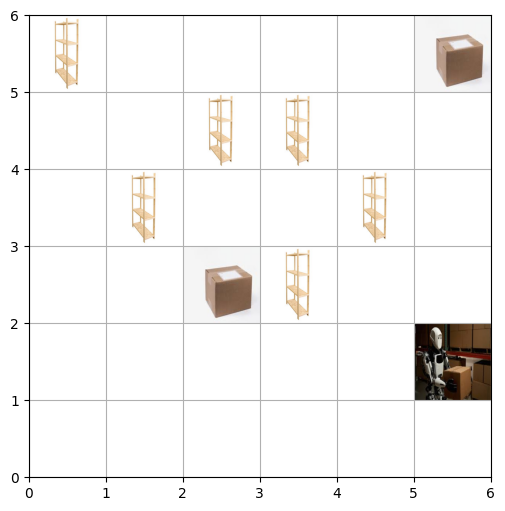

Step 9: Action=1, Position=(5, 2), Carrying=True, Reward=-1


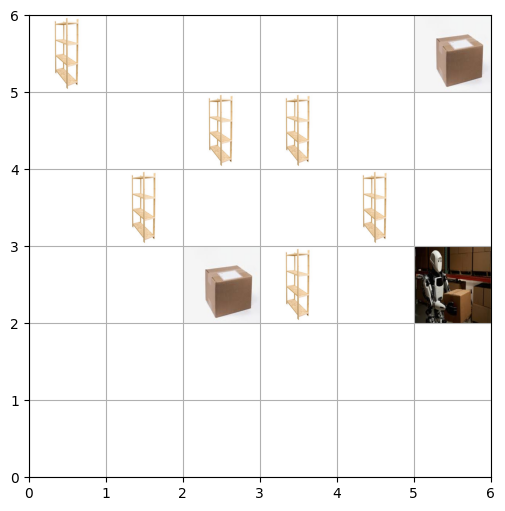

Step 10: Action=1, Position=(5, 3), Carrying=True, Reward=-1


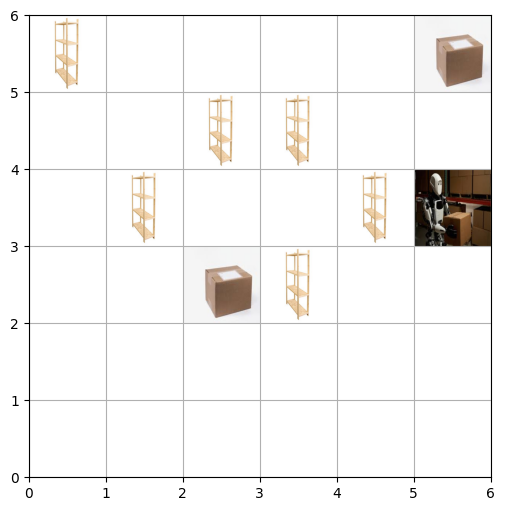

Step 11: Action=1, Position=(5, 4), Carrying=True, Reward=-1


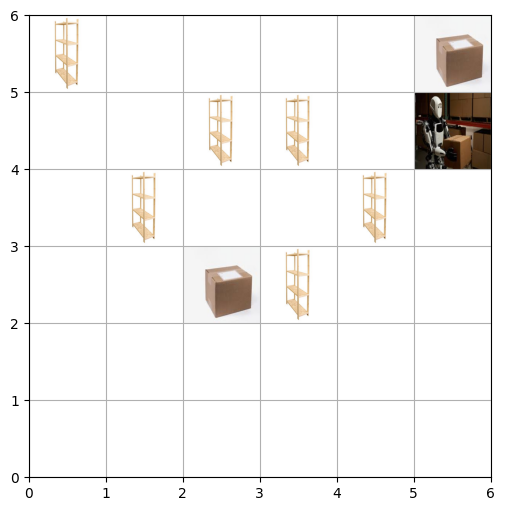

Step 12: Action=1, Position=(5, 5), Carrying=True, Reward=-1


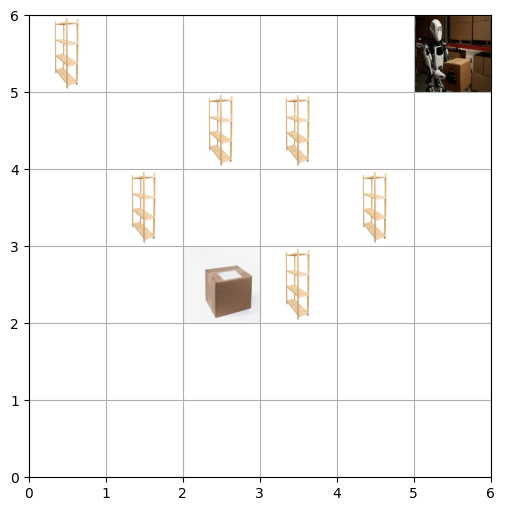

Step 13: Action=5, Position=(5, 5), Carrying=True, Reward=100


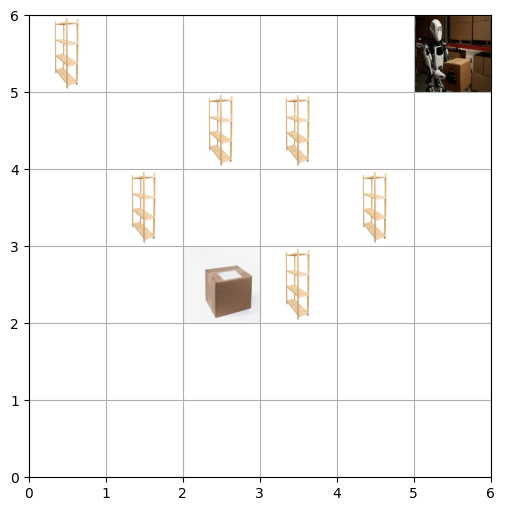

Episode 10: Task completed! Total Reward: 113


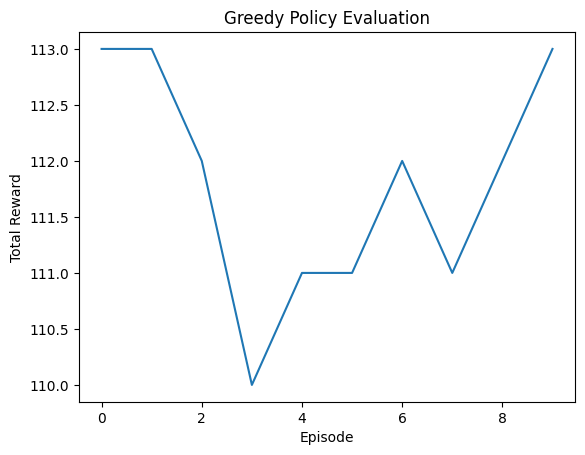

In [31]:
def test_agent(num_episodes=10):
    """Test the trained agent."""
    rewards_per_episode = []
    
    for episode in range(num_episodes):
        state, _ = env.reset()  # ✅ Unpack properly
        state = tuple(state)  # ✅ Ensure state is a tuple
        total_reward = 0
        done = False
        step = 0
        
        while not done:
            action = np.argmax(Q[state])  # Choose the best learned action
            next_state, reward, done, truncated, _ = env.step(action)  # ✅ Unpack properly
            next_state = tuple(next_state)  # ✅ Convert to tuple
            
            state = next_state
            total_reward += reward
            print(f"Step {step}: Action={action}, Position={state[:2]}, Carrying={bool(state[2])}, Reward={reward}")
            env.render()
            step += 1
            
            if done or truncated:
                print(f"Episode {episode + 1}: Task completed! Total Reward: {total_reward}")
                break
        
        rewards_per_episode.append(total_reward)
    
    # Plot the total reward per episode during greedy evaluation
    plt.figure()
    plt.plot(rewards_per_episode)
    plt.xlabel('Episode')
    plt.ylabel('Total Reward')
    plt.title('Greedy Policy Evaluation')
    plt.show()

test_agent()


### Part3:

### Deterministic environment:

In [32]:
env = Warehouse_robot()
num_actions = env.action_space.n
num_states = (env.grid_size, env.grid_size, 2)  # (x, y, carrying)

# Hyperparameters
alpha = 0.1  # Learning rate
gamma = 0.99  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_min = 0.01  # Minimum exploration rate
epsilon_decay = 0.995  # Decay rate

# Q-table initialization
Q_table = np.zeros(num_states + (num_actions,))

# Print Initial Q-table
print("Initial Q-table (first few entries):")
print(Q_table[:5, :5, :, :])  # Display a small portion for readability

# Function to choose action using epsilon-greedy policy
def choose_action(state):
    if np.random.rand() < epsilon:
        return np.random.choice(num_actions)
    else:
        return np.argmax(Q_table[state])

Initial Q-table (first few entries):
[[[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]

In [39]:
# Training Loop
num_episodes = 1000
reward_per_episode = []
epsilon_values = []

for episode in range(num_episodes):
    state, _ = env.reset()  # Extract observation only
    state = tuple(map(int, state))  # Convert to tuple of integers
    action = choose_action(state)
    total_reward = 0
    done = False

    while not done:
        next_state, reward, terminated, truncated, _ = env.step(action)
        done = terminated or truncated  # Ensure proper episode termination

        next_state = tuple(map(int, next_state))  # Ensure valid indexing
        next_action = choose_action(next_state)

        # ✅ Debugging invalid indices
        if not (0 <= state[0] < env.grid_size and 0 <= state[1] < env.grid_size and 0 <= state[2] < 2):
            print(f"Invalid state index: {state}")
        if not (0 <= next_state[0] < env.grid_size and 0 <= next_state[1] < env.grid_size and 0 <= next_state[2] < 2):
            print(f"Invalid next_state index: {next_state}")

        # ✅ Safe Q-table update
        Q_table[state][action] += alpha * (
            reward + gamma * Q_table[next_state][next_action] - Q_table[state][action]
        )

        state, action = next_state, next_action
        total_reward += reward

    # Decay epsilon
    epsilon = max(epsilon_min, epsilon * epsilon_decay)

    reward_per_episode.append(total_reward)
    epsilon_values.append(epsilon)

    if episode % 100 == 0:
        print(f"Episode {episode}, Total Reward: {total_reward}, Epsilon: {epsilon:.4f}")


# Print Trained Q-table
print("\nTrained Q-table (first few entries):")
print(Q_table[:5, :5, :, :])  # Display a small portion for readability

# Save trained Q-table as a pickle file
with open("sarsa_q_table.pkl", "wb") as f:
    pickle.dump(Q_table, f)
print("Q-table saved as 'sarsa_q_table.pkl'")

Episode 0, Total Reward: -1061, Epsilon: 0.9950
Episode 100, Total Reward: -42, Epsilon: 0.6027
Episode 200, Total Reward: 98, Epsilon: 0.3651
Episode 300, Total Reward: 107, Epsilon: 0.2212
Episode 400, Total Reward: 109, Epsilon: 0.1340
Episode 500, Total Reward: 110, Epsilon: 0.0812
Episode 600, Total Reward: 111, Epsilon: 0.0492
Episode 700, Total Reward: 111, Epsilon: 0.0298
Episode 800, Total Reward: 111, Epsilon: 0.0180
Episode 900, Total Reward: 111, Epsilon: 0.0109

Trained Q-table (first few entries):
[[[[ 2.28302053e+02  1.94724905e+03  4.47814773e+02  2.56468263e+01
     1.51296405e+02  2.42183628e+02]
   [-1.52475050e+01 -1.52738410e+01 -1.53638809e+01  4.31583518e+01
    -1.52611660e+01 -1.52957276e+01]]

  [[ 1.96379300e+02  1.88993234e+00  2.08661633e+02  2.09250738e+03
     2.42423641e+02  3.27939612e+01]
   [-1.54455539e+01 -1.57774658e+01 -1.53860516e+01 -1.54813211e+01
    -1.54337069e+01 -1.55350654e+01]]

  [[-8.38438607e+00 -1.04342937e+01 -9.15070504e+00  8.4536

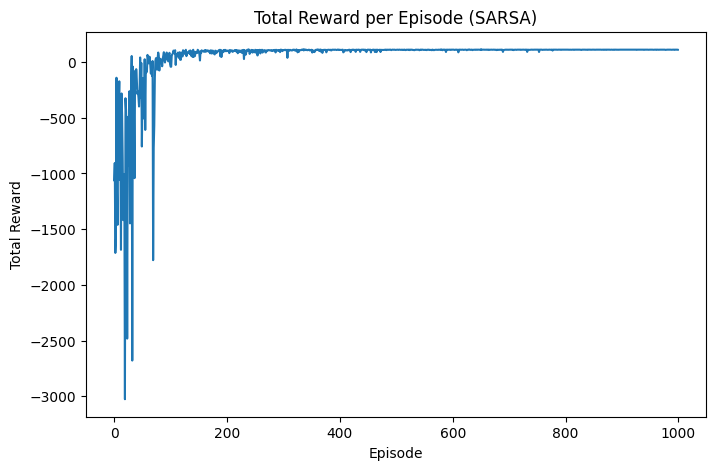

In [40]:
plt.figure(figsize=(8, 5))
plt.plot(reward_per_episode)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward per Episode (SARSA)")
plt.show()

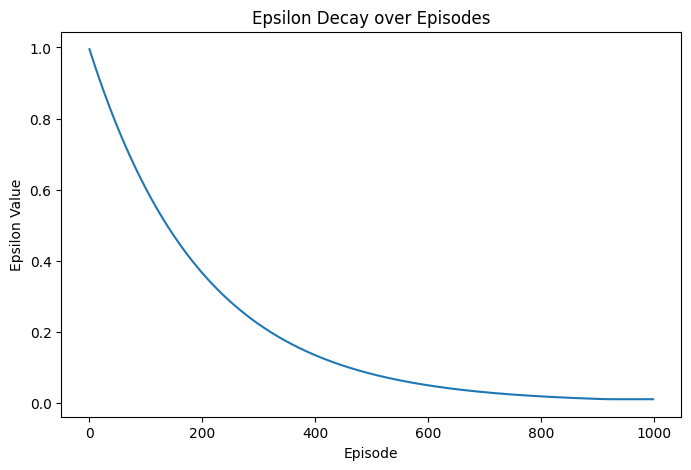

In [41]:
plt.figure(figsize=(8, 5))
plt.plot(epsilon_values)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay over Episodes")
plt.show()

In [43]:
greedy_rewards = []

for _ in range(10):
    state, _ = env.reset()  # Correct unpacking
    state = tuple(map(int, state))  # Ensure valid tuple indexing
    total_reward = 0
    done = False

    while not done:
        action = np.argmax(Q_table[state])  # Choose greedy action
        next_state, reward, terminated, truncated, _ = env.step(action)  # Correct unpacking
        done = terminated or truncated  # Ensure proper termination check
        next_state = tuple(map(int, next_state))  # Ensure valid indexing
        state = next_state
        total_reward += reward

    greedy_rewards.append(total_reward)


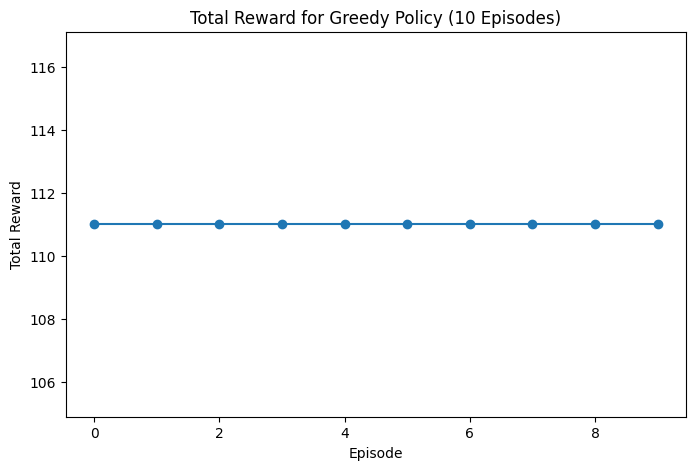

In [44]:
plt.figure(figsize=(8, 5))
plt.plot(greedy_rewards, marker='o')
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward for Greedy Policy (10 Episodes)")
plt.show()

### Stocastic environment:

In [45]:
env = Stochastic_warehouse()
num_actions = env.action_space.n
num_states = (env.grid_size, env.grid_size, 2)  # (x, y, carrying)

# Hyperparameters
alpha = 0.1  # Learning rate
gamma = 0.99  # Discount factor
epsilon = 1.0  # Initial exploration rate
epsilon_min = 0.01  # Minimum exploration rate
epsilon_decay = 0.995  # Decay rate

# Q-table initialization
Q_table = np.zeros(num_states + (num_actions,))

# Print Initial Q-table
print("Initial Q-table (first few entries):")
print(Q_table[:5, :5, :, :])  # Display a small portion for readability

# Function to choose an action using epsilon-greedy policy
def choose_action(state):
    if np.random.rand() < epsilon:
        return np.random.choice(num_actions)
    else:
        return np.argmax(Q_table[state])


Initial Q-table (first few entries):
[[[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]]


 [[[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]]

  [[0. 0. 0. 0. 0. 0.]
   [0. 0. 0. 0. 0. 0.]

In [49]:
num_episodes = 1000
reward_per_episode = []
epsilon_values = []

for episode in range(num_episodes):
    state, _ = env.reset()  # Unpack correctly
    state = tuple(map(int, state))  # Ensure integer tuple
    action = choose_action(state)
    total_reward = 0
    done = False

    while not done:
        next_state, reward, terminated, truncated, _ = env.step(action)  
        done = terminated or truncated  
        next_state = tuple(map(int, next_state))  # Convert to integer tuple
        next_action = choose_action(next_state)


        # SARSA Update Rule
        Q_table[state][action] += alpha * (
            reward + gamma * Q_table[next_state][next_action] - Q_table[state][action]
        )

        state, action = next_state, next_action
        total_reward += reward


    # Decay epsilon
    global epsilon
    epsilon = max(epsilon_min, epsilon * epsilon_decay)
    
    reward_per_episode.append(total_reward)
    epsilon_values.append(epsilon)

    if episode % 100 == 0:
        print(f"Episode {episode}, Total Reward: {total_reward}, Epsilon: {epsilon:.4f}")

# Print Trained Q-table
print("\nTrained Q-table (first few entries):")
print(Q_table[:5, :5, :, :])  # Display a small portion for readability

# Save trained Q-table as a pickle file
with open("sarsa_q_table_stochastic.pkl", "wb") as f:
    pickle.dump(Q_table, f)
print("Q-table saved as 'sarsa_q_table_stochastic.pkl'")

Episode 0, Total Reward: 113, Epsilon: 0.0100
Episode 100, Total Reward: 111, Epsilon: 0.0100
Episode 200, Total Reward: 109, Epsilon: 0.0100
Episode 300, Total Reward: 113, Epsilon: 0.0100
Episode 400, Total Reward: 111, Epsilon: 0.0100
Episode 500, Total Reward: 112, Epsilon: 0.0100
Episode 600, Total Reward: 111, Epsilon: 0.0100
Episode 700, Total Reward: 113, Epsilon: 0.0100
Episode 800, Total Reward: 112, Epsilon: 0.0100
Episode 900, Total Reward: 110, Epsilon: 0.0100

Trained Q-table (first few entries):
[[[[ 5.34431546e+01  3.61381406e+03  6.38177195e+02  1.49221683e+02
     1.79768371e+03  6.71368483e+02]
   [-2.29684534e+01 -2.31159048e+01 -2.31080840e+01 -2.29481189e+01
    -2.29981730e+01 -2.29909061e+01]]

  [[ 6.23233652e+02  3.63184344e+02  9.55878948e+02  3.85750689e+03
     1.65149303e+03  5.41501696e+02]
   [-2.32438541e+01 -2.34885664e+01 -2.33598767e+01 -1.65496963e+01
    -2.33648599e+01 -2.34165068e+01]]

  [[-1.48107382e+01 -1.51110619e+01 -1.45805337e+01  9.27227

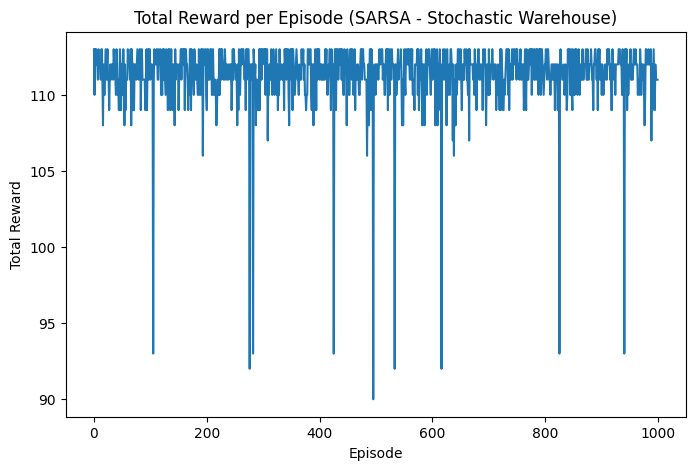

In [50]:
plt.figure(figsize=(8, 5))
plt.plot(reward_per_episode)
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward per Episode (SARSA - Stochastic Warehouse)")
plt.show()

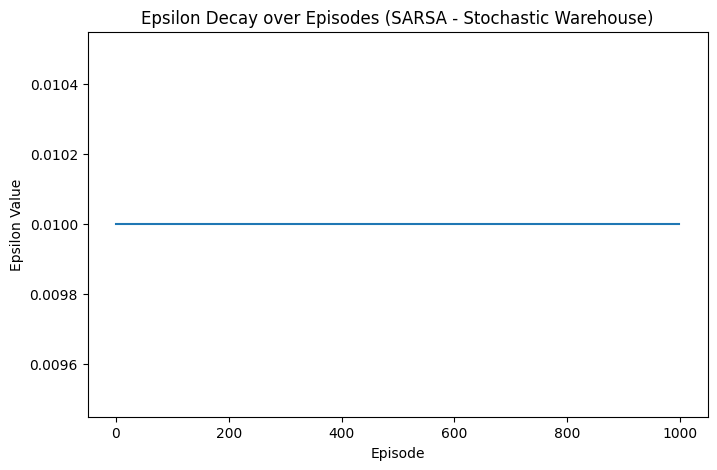

In [51]:
plt.figure(figsize=(8, 5))
plt.plot(epsilon_values)
plt.xlabel("Episode")
plt.ylabel("Epsilon Value")
plt.title("Epsilon Decay over Episodes (SARSA - Stochastic Warehouse)")
plt.show()

In [53]:
greedy_rewards = []
for _ in range(10):
    state, _ = env.reset()  # Unpack properly
    state = tuple(map(int, state))  # Ensure valid tuple
    total_reward = 0
    done = False

    while not done:
        action = np.argmax(Q_table[state])  # Select best action
        next_state, reward, terminated, truncated, _ = env.step(action)  # Unpack properly
        done = terminated or truncated  # Ensure episode ends correctly

        next_state = tuple(map(int, next_state))  # Convert to tuple
        total_reward += reward
        state = next_state  # Move to the next state

    greedy_rewards.append(total_reward)


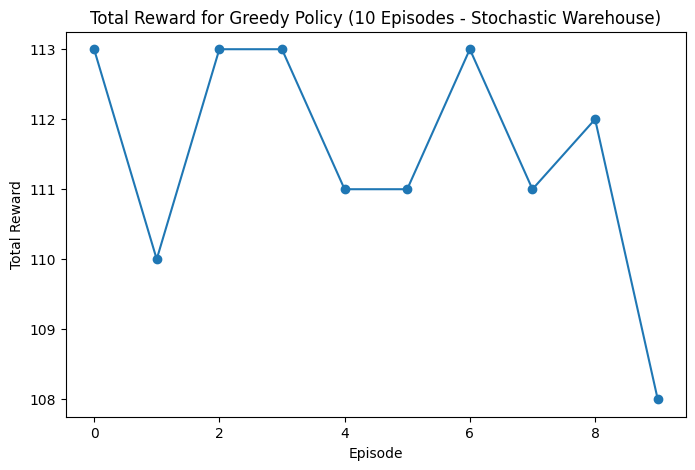

In [54]:
plt.figure(figsize=(8, 5))
plt.plot(greedy_rewards, marker='o')
plt.xlabel("Episode")
plt.ylabel("Total Reward")
plt.title("Total Reward for Greedy Policy (10 Episodes - Stochastic Warehouse)")
plt.show()